**Importing necessary libraries**

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer, RobustScaler
from sklearn.impute import SimpleImputer
from statsmodels.graphics.gofplots import qqplot
import scipy.stats as stats
from scipy.stats import skew, norm, kruskal, chi2_contingency, anderson, kstest, mannwhitneyu
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score

**Reading the dataset**

In [2]:
pd.set_option('display.max_columns', None)
df = pd.read_csv('hotel_booking.csv')
df.sample(1)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
52968,City Hotel,1,71,2016,June,25,14,0,3,1,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,Non Refund,236.0,NaN,0,Transient,120.0,0,0,Canceled,2016-04-27,Sara Gomez,SGomez@yahoo.com,228-764-0192,************7453


**Dropping columns that are not required**

In [3]:
df = df.drop(['email', 'phone-number', 'credit_card', 'name'], axis =1)

**Checking for unique values in the reservation status column. This column also seems useless, but we'll verify that.**

In [4]:
df['reservation_status'].unique()

array(['Check-Out', 'Canceled', 'No-Show'], dtype=object)

**Checking for the entries in the is_canceled column opposite to all unique values of reservation status. It is kind of evident that if the reservation status is no-show or canceled there's definitely, going to be a cancellation and will only check out if they have not cancelled the reservation.**

In [5]:
print (df[df['reservation_status'] == 'No-Show']['is_canceled'].value_counts())
print (df[df['reservation_status'] == 'Canceled']['is_canceled'].value_counts())
print (df[df['reservation_status'] == 'Check-Out']['is_canceled'].value_counts())

is_canceled
1    1207
Name: count, dtype: int64
is_canceled
1    43017
Name: count, dtype: int64
is_canceled
0    75166
Name: count, dtype: int64


**Suspision confirmed. Since it is a useless column, we'll drop it**

In [6]:
df = df.drop('reservation_status', axis =1)

**Converting the datatype of column: reservation_status_date to date-time format**

In [7]:
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'], format='%Y-%m-%d')

**Extracting year, month, and date from the column reservation_status_date and storing the values in separate columns.**

In [8]:
df['reservation_year'] = df['reservation_status_date'].dt.year
df['reservation_month'] = df['reservation_status_date'].dt.month
df['reservation_date'] = df['reservation_status_date'].dt.day

**Dropping reservation_status_date column**

In [9]:
df = df.drop ('reservation_status_date', axis =1)

**Checking for missing values**

In [10]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

**Four columns have missing values**

**Checking percentage of missing data in columns**

In [11]:
print(f"Percentage of missing data in the children column: {((4/119390)*100):.3f}%")
print(f"Percentage of missing data in the country column: {((488/119390)*100):.3f}%")
print(f"Percentage of missing data in the agent column: {((16340/119390)*100):.3f}%")
print(f"Percentage of missing data in the company column: {((112593/119390)*100):.3f}%")

Percentage of missing data in the children column: 0.003%
Percentage of missing data in the country column: 0.409%
Percentage of missing data in the agent column: 13.686%
Percentage of missing data in the company column: 94.307%


**94% of the data in the company column is missing. It's not feasible to impute this much data, so we have to drop this column**

In [12]:
df = df.drop('company', axis =1)
df.head(1)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_year,reservation_month,reservation_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,0,Transient,0.0,0,0,2015,7,1


**Printing categorical and numerical columns**

In [13]:
print(f"Categorical columns: {df.select_dtypes(include=['object', 'category']).columns.tolist()}\n")
print(f"Numerical columns: {df.select_dtypes(exclude=['object', 'category']).columns.tolist()}")

Categorical columns: ['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'customer_type']

Numerical columns: ['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'agent', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_year', 'reservation_month', 'reservation_date']


**The columns 'lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'agent', 'days_in_waiting_list', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_year', 'reservation_month', and 'reservation_date' are discrete variables. Making the necessary changes to facilitate the imputation of missing values.**

In [14]:
df['lead_time'] = df['lead_time'].astype('str')
df['arrival_date_year'] = df['arrival_date_year'].astype('str')
df['arrival_date_week_number'] = df['arrival_date_week_number'].astype('str')
df['arrival_date_day_of_month'] = df['arrival_date_day_of_month'].astype('str')
df['days_in_waiting_list'] = df['days_in_waiting_list'].astype('str')
df['reservation_date'] = df['reservation_date'].astype('str')
df['reservation_year'] = df['reservation_year'].astype('str')

In [15]:
df['agent'].replace({
    304.: '304', 240.: '240', 303.: '303', 15.: '15', 241.: '241', 8.: '8', 250.: '250',
    115.: '115', 5.: '5', 175.: '175', 134.: '134', 156.: '156', 243.: '243', 242.: '242',
    3.: '3', 105.: '105', 40.: '40', 147.: '147', 306.: '306', 184.: '184', 96.: '96', 2.: '2',
    127.: '127', 95.: '95', 146.: '146', 9.: '9', 177.: '177', 6.: '6', 143.: '143', 244.: '244',
    149.: '149', 167.: '167', 300.: '300', 171.: '171', 305.: '305', 67.: '67', 196.: '196',
    152.: '152', 142.: '142', 261.: '261', 104.: '104', 36.: '36', 26.: '26', 29.: '29', 258.: '258',
    110.: '110', 71.: '71', 181.: '181', 88.: '88', 251.: '251', 275.: '275', 69.: '69', 248.: '248',
    208.: '208', 256.: '256', 314.: '314', 126.: '126', 281.: '281', 273.: '273', 253.: '253',
    185.: '185', 330.: '330', 334.: '334', 328.: '328', 326.: '326', 321.: '321', 324.: '324',
    313.: '313', 38.: '38', 155.: '155', 68.: '68', 335.: '335', 308.: '308', 332.: '332',
    94.: '94', 348.: '348', 310.: '310', 339.: '339', 375.: '375', 66.: '66', 327.: '327',
    387.: '387', 298.: '298', 91.: '91', 245.: '245', 385.: '385', 257.: '257', 393.: '393',
    168.: '168', 405.: '405', 249.: '249', 315.: '315', 75.: '75', 128.: '128', 307.: '307',
    11.: '11', 436.: '436', 1.: '1', 201.: '201', 183.: '183', 223.: '223', 368.: '368', 336.: '336',
    291.: '291', 464.: '464', 411.: '411', 481.: '481', 10.: '10', 154.: '154', 468.: '468',
    410.: '410', 390.: '390', 440.: '440', 495.: '495', 492.: '492', 493.: '493', 434.: '434',
    57.: '57', 531.: '531', 420.: '420', 483.: '483', 526.: '526', 472.: '472', 429.: '429',
    16.: '16', 446.: '446', 34.: '34', 78.: '78', 139.: '139', 252.: '252', 270.: '270',
    47.: '47', 114.: '114', 301.: '301', 193.: '193', 182.: '182', 135.: '135', 350.: '350',
    195.: '195', 352.: '352', 355.: '355', 159.: '159', 363.: '363', 384.: '384', 360.: '360',
    331.: '331', 367.: '367', 64.: '64', 406.: '406', 163.: '163', 414.: '414', 333.: '333',
    427.: '427', 431.: '431', 430.: '430', 426.: '426', 438.: '438', 433.: '433', 418.: '418',
    441.: '441', 282.: '282', 432.: '432', 72.: '72', 450.: '450', 180.: '180', 454.: '454',
    455.: '455', 59.: '59', 451.: '451', 254.: '254', 358.: '358', 469.: '469', 165.: '165',
    467.: '467', 510.: '510', 337.: '337', 476.: '476', 502.: '502', 527.: '527', 479.: '479',
    508.: '508', 535.: '535', 302.: '302', 497.: '497', 187.: '187', 13.: '13', 7.: '7', 27.: '27',
    14.: '14', 22.: '22', 17.: '17', 28.: '28', 42.: '42', 20.: '20', 19.: '19', 45.: '45', 37.: '37',
    61.: '61', 39.: '39', 21.: '21', 24.: '24', 41.: '41', 50.: '50', 30.: '30', 54.: '54', 52.: '52',
    12.: '12', 44.: '44', 31.: '31', 83.: '83', 32.: '32', 63.: '63', 60.: '60', 55.: '55', 56.: '56',
    89.: '89', 87.: '87', 118.: '118', 86.: '86', 85.: '85', 210.: '210', 214.: '214', 129.: '129',
    179.: '179', 138.: '138', 174.: '174', 170.: '170', 153.: '153', 93.: '93', 151.: '151',
    119.: '119', 35.: '35', 173.: '173', 58.: '58', 53.: '53', 133.: '133', 79.: '79', 235.: '235',
    192.: '192', 191.: '191', 236.: '236', 162.: '162', 215.: '215', 157.: '157', 287.: '287',
    132.: '132', 234.: '234', 98.: '98', 77.: '77', 103.: '103', 107.: '107', 262.: '262',
    220.: '220', 121.: '121', 205.: '205', 378.: '378', 23.: '23', 296.: '296', 290.: '290',
    229.: '229', 33.: '33', 286.: '286', 276.: '276', 425.: '425', 484.: '484', 323.: '323',
    403.: '403', 219.: '219', 394.: '394', 509.: '509', 111.: '111', 423.: '423', 4.: '4', 70.: '70',
    82.: '82', 81.: '81', 74.: '74', 92.: '92', 99.: '99', 90.: '90', 112.: '112', 117.: '117',
    106.: '106', 148.: '148', 158.: '158', 144.: '144', 211.: '211', 213.: '213', 216.: '216',
    232.: '232', 150.: '150', 267.: '267', 227.: '227', 247.: '247', 278.: '278', 280.: '280',
    285.: '285', 289.: '289', 269.: '269', 295.: '295', 265.: '265', 288.: '288', 122.: '122',
    294.: '294', 325.: '325', 341.: '341', 344.: '344', 346.: '346', 359.: '359', 283.: '283',
    364.: '364', 370.: '370', 371.: '371', 25.: '25', 141.: '141', 391.: '391', 397.: '397',
    416.: '416', 404.: '404', 299.: '299', 197.: '197', 73.: '73', 354.: '354', 444.: '444',
    408.: '408', 461.: '461', 388.: '388', 453.: '453', 459.: '459', 474.: '474', 475.: '475',
    480.: '480', 449.: '449'}, inplace = True)

In [16]:
df['is_canceled'].replace({0: 'no', 1: 'yes'}, inplace = True)

In [17]:
df['stays_in_weekend_nights'].replace(
    {0: 'zero', 1: 'one', 2: 'two', 3: 'three', 4: 'four', 5: 'five', 6: 'six', 7: 'seven', 8: 'eight', 9: 'nine', 10: 'ten',
     12: 'twelve', 13: 'thirteen', 14: 'fourteen', 16: 'sixteen', 18: 'eighteen', 19: 'nineteen'}, inplace = True)

In [18]:
df['stays_in_week_nights'].replace(
    {0: 'zero', 1: 'one', 2: 'two', 3: 'three', 4: 'four', 5: 'five', 10: 'ten', 11: 'eleven', 8: 'eight', 
     6: 'six', 7: 'seven', 15: 'fifteen', 9: 'nine', 12: 'twelve', 33: 'thirty three', 20: 'twenty', 
     14: 'fourteen', 16: 'sixteen', 21: 'twenty one', 13: 'thirteen', 30: 'thirty', 19: 'nineteen', 
     24: 'twenty four', 40: 'forty', 22: 'twenty two', 42: 'forty two', 50: 'fifty', 25: 'twenty five', 
     17: 'seventeen', 32: 'thirty two', 26: 'twenty six', 18: 'eighteen', 34: 'thirty four', 35: 'thirty five', 
     41: 'forty one'}, inplace = True)

In [19]:
df['adults'].replace(
    {2: 'two', 1: 'one', 3: 'three', 4: 'four', 40: 'forty', 26: 'twenty six', 50: 'fifty', 27: 'twenty seven', 
     55: 'fifty five', 0: 'zero', 20: 'twenty', 6: 'six', 5: 'five', 10: 'ten'}, inplace = True)

In [20]:
df['children'].replace({0.0: 'zero', 1.0: 'one', 2.0: 'two', 10.0: 'ten', 3.0: 'three'}, inplace = True)

In [21]:
df['babies'].replace({0:'zero', 1: 'one', 2: 'two', 10: 'ten', 9: 'nine'}, inplace=True)

In [22]:
df['is_repeated_guest'].replace({0: 'no', 1: 'yes'}, inplace = True)

In [23]:
df['previous_cancellations'].replace(
    {0: 'zero', 1: 'one', 2: 'two', 3: 'three', 26: 'twenty six', 25: 'twenty five', 14: 'fourteen', 
     4: 'four', 24: 'twenty four', 19: 'nineteen', 5: 'five', 21: 'twenty one', 6: 'six', 13: 'thirteen',
     11: 'eleven'}, inplace =True)

In [24]:
df['previous_bookings_not_canceled'].replace({
    0: 'zero', 1: 'one', 2: 'two', 3: 'three', 4: 'four', 5: 'five', 6: 'six', 7: 'seven', 8: 'eight', 9: 'nine',
     10: 'ten', 11: 'eleven', 12: 'twelve', 13: 'thirteen', 14: 'fourteen', 15: 'fifteen', 16: 'sixteen',
     17: 'seventeen', 18: 'eighteen', 19: 'nineteen', 20: 'twenty', 21: 'twenty one', 22: 'twenty two',
     23: 'twenty three', 24: 'twenty four', 25: 'twenty five', 26: 'twenty six', 27: 'twenty seven',
     28: 'twenty eight', 29: 'twenty nine', 30: 'thirty', 31: 'thirty one', 32: 'thirty two', 33: 'thirty three',
     34: 'thirty four', 35: 'thirty five', 36: 'thirty six', 37: 'thirty seven', 38: 'thirty eight', 39: 'thirty nine',
     40: 'forty', 41: 'forty one', 42: 'forty two', 43: 'forty three', 44: 'forty four', 45: 'forty five', 46: 'forty six',
     47: 'forty seven', 48: 'forty eight', 49: 'forty nine', 50: 'fifty', 51: 'fifty one', 52: 'fifty two', 53: 'fifty three',
     54: 'fifty four', 55: 'fifty five', 56: 'fifty six', 57: 'fifty seven', 58: 'fifty eight', 59: 'fifty nine',
     60: 'sixty', 61: 'sixty one', 62: 'sixty two', 63: 'sixty three', 64: 'sixty four', 65: 'sixty five', 66: 'sixty six',
     67: 'sixty seven', 68: 'sixty eight', 69: 'sixty nine', 70: 'seventy', 71: 'seventy one', 72: 'seventy two'}, inplace = True)

In [25]:
df['booking_changes'].replace({
    3: 'three', 4: 'four', 0: 'zero', 1: 'one', 2: 'two', 5: 'five', 17: 'seventeen', 6: 'six', 8: 'eight', 
     7: 'seven', 10: 'ten', 16: 'sixteen', 9: 'nine', 13: 'thirteen', 12: 'twelve', 20: 'twenty', 14: 'fourteen',
     15: 'fifteen', 11: 'eleven', 21: 'twenty one', 18: 'eighteen'}, inplace = True)

In [26]:
df['required_car_parking_spaces'].replace({0:'zero', 1: 'one', 2: 'two', 8: 'eight', 3: 'three'}, inplace=True)

In [27]:
df['total_of_special_requests'].replace({0:'zero', 1: 'one', 2: 'two', 4: 'four', 3: 'three', 5: 'five'}, inplace=True)

In [28]:
df['reservation_month'].replace(
    {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 
     9: 'September', 10: 'October', 11: 'November', 12: 'December'}, inplace = True)

**Converting the countries shortcuts to actual names**

In [29]:
df['country'].replace({
    'PRT': 'Portugal', 'GBR': 'United Kingdom', 'USA': 'United States', 'ESP': 'Spain', 'IRL': 'Ireland',
    'FRA': 'France', 'ROU': 'Romania', 'NOR': 'Norway', 'OMN': 'Oman', 'ARG': 'Argentina', 'POL': 'Poland',
    'DEU': 'Germany', 'BEL': 'Belgium', 'CHE': 'Switzerland', 'CN': 'China', 'GRC': 'Greece', 'ITA': 'Italy',
    'NLD': 'Netherlands', 'DNK': 'Denmark', 'RUS': 'Russia', 'SWE': 'Sweden', 'AUS': 'Australia', 'EST': 'Estonia',
    'CZE': 'Czech Republic', 'BRA': 'Brazil', 'FIN': 'Finland', 'MOZ': 'Mozambique', 'BWA': 'Botswana',
    'LUX': 'Luxembourg', 'SVN': 'Slovenia', 'ALB': 'Albania', 'IND': 'India', 'CHN': 'China', 'MEX': 'Mexico',
    'MAR': 'Morocco', 'UKR': 'Ukraine', 'SMR': 'San Marino', 'LVA': 'Latvia', 'PRI': 'Puerto Rico', 'SRB': 'Serbia',
    'CHL': 'Chile', 'AUT': 'Austria', 'BLR': 'Belarus', 'LTU': 'Lithuania', 'TUR': 'Turkey', 'ZAF': 'South Africa',
    'AGO': 'Angola', 'ISR': 'Israel', 'CYM': 'Cayman Islands', 'ZMB': 'Zambia', 'CPV': 'Cape Verde',
    'ZWE': 'Zimbabwe', 'DZA': 'Algeria', 'KOR': 'South Korea', 'CRI': 'Costa Rica', 'HUN': 'Hungary', 'ARE': 'UAE',
    'TUN': 'Tunisia', 'JAM': 'Jamaica', 'HRV': 'Croatia', 'HKG': 'Hong Kong', 'IRN': 'Iran', 'GEO': 'Georgia',
    'AND': 'Andorra', 'GIB': 'Gibraltar', 'URY': 'Uruguay', 'JEY': 'Jersey', 'CAF': 'Central African Republic',
    'CYP': 'Cyprus', 'COL': 'Colombia', 'GGY': 'Guernsey', 'KWT': 'Kuwait', 'NGA': 'Nigeria', 'MDV': 'Maldives',
    'VEN': 'Venezuela', 'SVK': 'Slovakia', 'FJI': 'Fiji', 'KAZ': 'Kazakhstan', 'PAK': 'Pakistan', 'IDN': 'Indonesia',
    'LBN': 'Lebanon', 'PHL': 'Philippines', 'SEN': 'Senegal', 'SYC': 'Seychelles', 'AZE': 'Azerbaijan', 'BHR': 'Bahrain',
    'NZL': 'New Zealand', 'THA': 'Thailand', 'DOM': 'Dominican Republic', 'MKD': 'North Macedonia', 'MYS': 'Malaysia',
    'ARM': 'Armenia', 'JPN': 'Japan', 'LKA': 'Sri Lanka', 'CUB': 'Cuba', 'CMR': 'Cameroon', 'BIH': 'Bosnia and Herzegovina',
    'MUS': 'Mauritius', 'COM': 'Comoros', 'SUR': 'Suriname', 'UGA': 'Uganda', 'BGR': 'Bulgaria', 'CIV': 'Ivory Coast',
    'JOR': 'Jordan', 'SYR': 'Syria', 'SGP': 'Singapore', 'BDI': 'Burundi', 'SAU': 'Saudi Arabia', 'VNM': 'Vietnam',
    'PLW': 'Palau', 'QAT': 'Qatar', 'EGY': 'Egypt', 'PER': 'Peru', 'MLT': 'Malta', 'MWI': 'Malawi', 'ECU': 'Ecuador',
    'MDG': 'Madagascar', 'ISL': 'Iceland', 'UZB': 'Uzbekistan', 'NPL': 'Nepal', 'BHS': 'Bahamas', 'MAC': 'Macau',
    'TGO': 'Togo', 'TWN': 'Taiwan', 'DJI': 'Djibouti', 'STP': 'São Tomé and Príncipe', 'KNA': 'Saint Kitts and Nevis',
    'ETH': 'Ethiopia', 'IRQ': 'Iraq', 'HND': 'Honduras', 'RWA': 'Rwanda', 'KHM': 'Cambodia', 'MCO': 'Monaco',
    'BGD': 'Bangladesh', 'IMN': 'Isle of Man', 'TJK': 'Tajikistan', 'NIC': 'Nicaragua', 'BEN': 'Benin',
    'VGB': 'British Virgin Islands', 'TZA': 'Tanzania', 'GAB': 'Gabon', 'GHA': 'Ghana', 'TMP': 'Timor-Leste',
    'GLP': 'Guadeloupe', 'KEN': 'Kenya', 'LIE': 'Liechtenstein', 'GNB': 'Guinea-Bissau', 'MNE': 'Montenegro',
    'UMI': 'United States Minor Outlying Islands', 'MYT': 'Mayotte', 'FRO': 'Faroe Islands', 'MMR': 'Myanmar',
    'PAN': 'Panama', 'BFA': 'Burkina Faso', 'LBY': 'Libya', 'MLI': 'Mali', 'NAM': 'Namibia', 'BOL': 'Bolivia',
    'PRY': 'Paraguay', 'BRB': 'Barbados', 'ABW': 'Aruba', 'AIA': 'Anguilla', 'SLV': 'El Salvador', 'DMA': 'Dominica',
    'PYF': 'French Polynesia', 'GUY': 'Guyana', 'LCA': 'Saint Lucia', 'ATA': 'Antarctica', 'GTM': 'Guatemala',
    'ASM': 'American Samoa', 'MRT': 'Mauritania', 'NCL': 'New Caledonia', 'KIR': 'Kiribati', 'SDN': 'Sudan',
    'ATF': 'French Southern Territories', 'SLE': 'Sierra Leone', 'LAO': 'Laos'}, inplace = True)

**Checking for outliers through box plot**

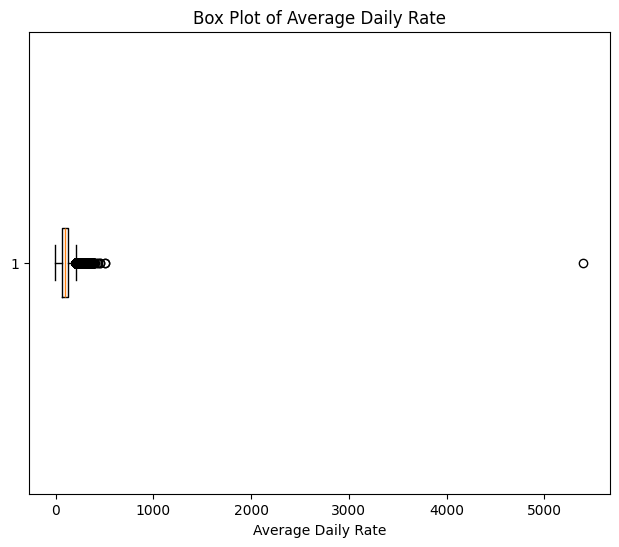

In [30]:
plt.figure(figsize=(7.5, 6))
plt.boxplot(df['adr'], vert=False)
plt.title('Box Plot of Average Daily Rate')
plt.xlabel('Average Daily Rate')
plt.show()

**The column has outliers**

**Imputing missing values in the categorial columns**

In [31]:
imputer = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
df[['children']] = imputer.fit_transform(df[['children']])
df[['country']] = imputer.fit_transform(df[['country']])
df[['agent']] = imputer.fit_transform(df[['agent']])

**Statistical Distribution**

In [32]:
df.describe()

,adr
count,119390.000000
mean,101.831122
std,50.535790
min,-6.380000
25%,69.290000
50%,94.575000
75%,126.000000
max,5400.000000


**The statistical distribution of the average daily rate (ADR) reveals some anomalies, including negative values and unusually low rates, which are implausible for a hotel stay, especially during the reservation years of 2014-2017. A more reasonable minimum ADR, based on the 25th percentile, is 69.29. Therefore, we will drop all rows with ADR values below this threshold.**

In [33]:
df = df[df['adr'] >= 69.29]
df = df.reset_index(drop=True)

**Data distribution in all columns**

In [34]:
for i in df.columns:
    print ('Data distribution in {}'.format(i))
    print (df[i].value_counts())

Data distribution in hotel
hotel
City Hotel      67266
Resort Hotel    22278
Name: count, dtype: int64
Data distribution in is_canceled
is_canceled
no     55288
yes    34256
Name: count, dtype: int64
Data distribution in lead_time
lead_time
0      3523
1      2134
2      1333
3      1154
4      1110
       ... 
378       1
390       1
370       1
374       1
463       1
Name: count, Length: 431, dtype: int64
Data distribution in arrival_date_year
arrival_date_year
2016    42396
2017    34061
2015    13087
Name: count, dtype: int64
Data distribution in arrival_date_month
arrival_date_month
August       12241
July         11200
June         10018
May           9620
April         9116
September     8150
October       7393
March         6286
February      4670
December      4008
November      3705
January       3137
Name: count, dtype: int64
Data distribution in arrival_date_week_number
arrival_date_week_number
33    3149
34    2786
30    2643
28    2579
32    2553
29    2474
25    2468
31

**Some categories in the categorical variables occur very infrequently, which may cause problems in the model predictions. Even if we don't remove them here, we'll have to handle them in the modular coding since encountering unknown categories will raise the error: 'Unknown categories encountered in the column ' '. Removing categories in all the categorical variables that occur less than 30 times.**

In [35]:
limit = 30
rows_removed = 0

while True:
    removed_this_iteration = False
    
    for col in df.select_dtypes(include=['object']).columns:
        counts = df[col].value_counts()
        categories_to_keep = counts[counts > limit].index.tolist()
        df_filtered = df[df[col].isin(categories_to_keep)]
        if len(df_filtered) < len(df):
            df = df_filtered
            removed_this_iteration = True
    if not removed_this_iteration:
        break
df = df.reset_index(drop=True)

**Confirming if the operation was successful**

In [36]:
for i in df.select_dtypes(include=['object']).columns:
    print ('Data distribution in {}'.format(i))
    print (df[i].value_counts())

Data distribution in hotel
hotel
City Hotel      63388
Resort Hotel    20603
Name: count, dtype: int64
Data distribution in is_canceled
is_canceled
no     52188
yes    31803
Name: count, dtype: int64
Data distribution in lead_time
lead_time
0      3382
1      1998
2      1244
3      1090
4      1052
       ... 
479      32
298      32
285      32
264      31
348      31
Name: count, Length: 332, dtype: int64
Data distribution in arrival_date_year
arrival_date_year
2016    40050
2017    31641
2015    12300
Name: count, dtype: int64
Data distribution in arrival_date_month
arrival_date_month
August       11617
July         10550
June          9298
May           8834
April         8539
September     7470
October       6978
March         5978
February      4509
December      3803
November      3465
January       2950
Name: count, dtype: int64
Data distribution in arrival_date_week_number
arrival_date_week_number
33    3001
34    2670
30    2446
28    2445
32    2395
29    2333
25    2308
31

**Handling duplicates (if there are any)**

In [37]:
print (df.shape)
df = df.drop_duplicates()
print (df.shape)

(83991, 32)
(63697, 32)


**There were 20294 duplicates**

**Removing outliers**

In [38]:
Q1 = 90.000000
Q3 = 146.670000
IQR = Q3 - Q1

lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR

left_outliers = df[(df['adr']<lower_limit)]
right_outliers = df[(df['adr']>upper_limit)]

df = df[(df['adr']>lower_limit)&(df['adr']<upper_limit)]
df = df.reset_index(drop=True)

**Plotting box plot**

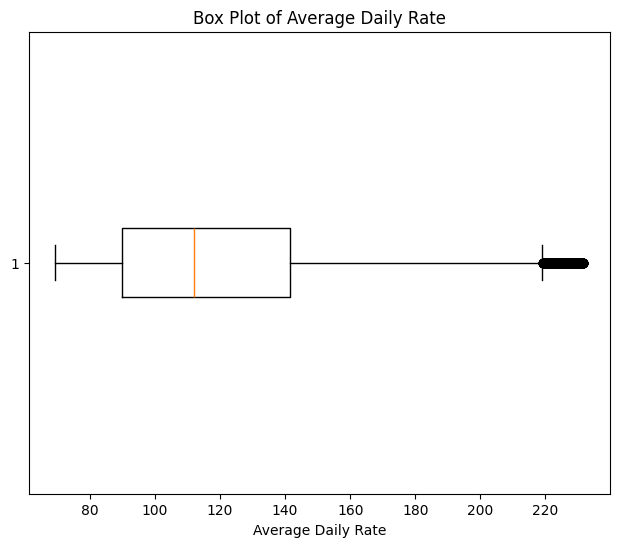

In [39]:
plt.figure(figsize=(7.5, 6))
plt.boxplot(df['adr'], vert=False)
plt.title('Box Plot of Average Daily Rate')
plt.xlabel('Average Daily Rate')
plt.show()

**Although outliers are still being detected, but the results are far better than before**

**Checking for data distribution in categorical columns again**

In [40]:
for i in df.select_dtypes(include=['object']).columns:
    print ('Data distribution in {}'.format(i))
    print (df[i].value_counts())

Data distribution in hotel
hotel
City Hotel      44822
Resort Hotel    16885
Name: count, dtype: int64
Data distribution in is_canceled
is_canceled
no     43167
yes    18540
Name: count, dtype: int64
Data distribution in lead_time
lead_time
0      3145
1      1872
2      1139
3      1006
4       938
       ... 
377       8
368       6
393       6
420       4
444       1
Name: count, Length: 332, dtype: int64
Data distribution in arrival_date_year
arrival_date_year
2016    29908
2017    23555
2015     8244
Name: count, dtype: int64
Data distribution in arrival_date_month
arrival_date_month
August       9108
July         8511
June         6563
May          6321
April        6136
September    5282
March        4522
October      4404
February     3301
December     2838
November     2482
January      2239
Name: count, dtype: int64
Data distribution in arrival_date_week_number
arrival_date_week_number
33    2238
28    2029
34    2011
32    1949
30    1897
29    1882
27    1866
31    1865
35 

**Handling the occurrence of some categories in the categorical variables that have become very infrequent due to recent outlier removal.**

In [41]:
limit = 30
rows_removed = 0

while True:
    removed_this_iteration = False
    for col in df.select_dtypes(include=['object']).columns:
        counts = df[col].value_counts()
        categories_to_keep = counts[counts > limit].index.tolist()
        df_filtered = df[df[col].isin(categories_to_keep)]
        if len(df_filtered) < len(df):
            df = df_filtered
            removed_this_iteration = True
    if not removed_this_iteration:
        break
df = df.reset_index(drop=True)

**Confirming if the operation was successful**

In [42]:
for i in df.select_dtypes(include=['object']).columns:
    print ('Data distribution in {}'.format(i))
    print (df[i].value_counts())

Data distribution in hotel
hotel
City Hotel      43732
Resort Hotel    16315
Name: count, dtype: int64
Data distribution in is_canceled
is_canceled
no     42188
yes    17859
Name: count, dtype: int64
Data distribution in lead_time
lead_time
0      3139
1      1869
2      1137
3      1001
4       935
       ... 
254      32
274      32
301      32
294      31
315      31
Name: count, Length: 283, dtype: int64
Data distribution in arrival_date_year
arrival_date_year
2016    29281
2017    22798
2015     7968
Name: count, dtype: int64
Data distribution in arrival_date_month
arrival_date_month
August       8918
July         8285
June         6369
May          6187
April        5913
September    5057
March        4455
October      4215
February     3270
December     2742
November     2431
January      2205
Name: count, dtype: int64
Data distribution in arrival_date_week_number
arrival_date_week_number
33    2198
34    1973
28    1970
32    1890
30    1860
29    1830
31    1828
27    1815
35 

**Storing numerical, categorical and the target variables in separate variables**

In [43]:
target = df['is_canceled']
num = df[['adr']]
cat = df[['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number',
          'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies',
          'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations',
          'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type',
          'agent', 'days_in_waiting_list', 'customer_type', 'required_car_parking_spaces', 'total_of_special_requests',
          'reservation_year', 'reservation_month', 'reservation_date']]

**Replacing the numerical dataframe name with 'out' to represent outliers**

In [44]:
out = num

**Plotting the histogram of Average Daily Rate**

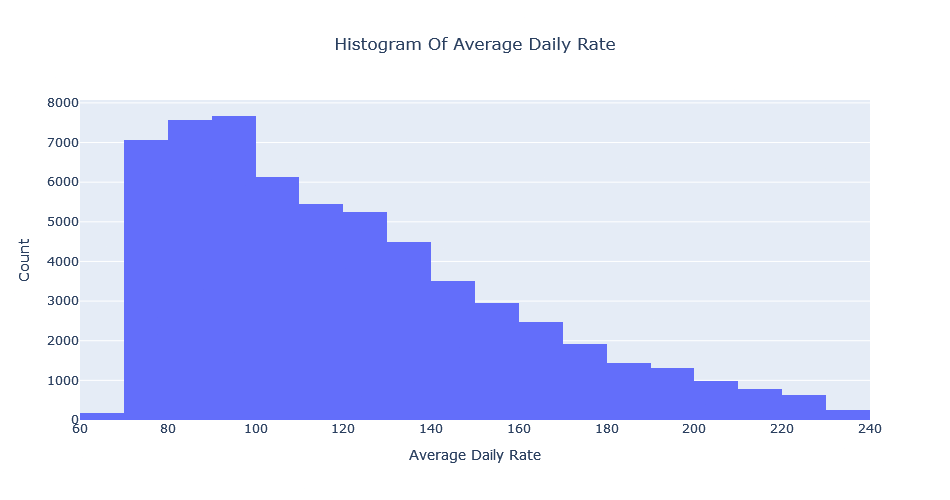

In [45]:
fig = px.histogram(df, x='adr', title='Histogram Of Average Daily Rate', nbins=30,
                   labels={'adr':'Average Daily Rate', 'count':'Count'})
fig.update_layout(title_x=0.5, width=800, height=500)
fig.update_xaxes(title_text='Average Daily Rate')
fig.update_yaxes(title_text='Count')
fig.show()

**Plotting Q-Q plot**

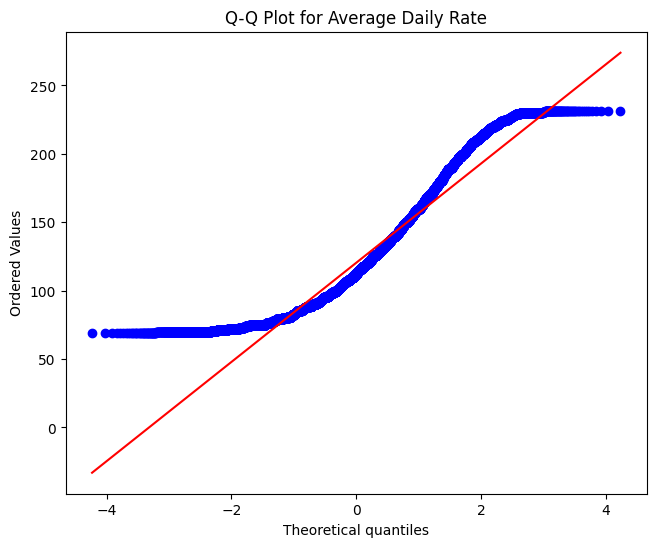

In [46]:
fig, ax = plt.subplots(figsize=(7.5,6))
stats.probplot(out['adr'], dist="norm", plot=ax)
ax.set_title('Q-Q Plot for Average Daily Rate')
plt.show()

**Plotting box plot**

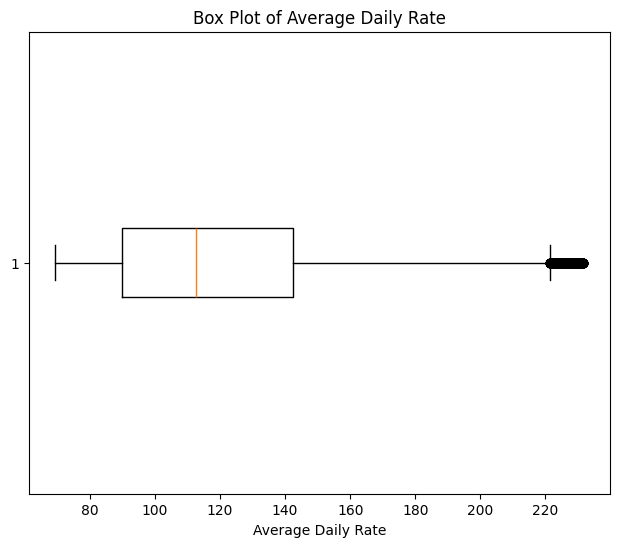

In [47]:
plt.figure(figsize=(7.5, 6))
plt.boxplot(out['adr'], vert=False)
plt.title('Box Plot of Average Daily Rate')
plt.xlabel('Average Daily Rate')
plt.show()

**Checking for skewness and performing statistical tests to see if the data is normally distributed**

In [48]:
skewness_out = out.skew()
print("Original skewness of outliers:")
print(skewness_out)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = stats.anderson(out['adr'], dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")


# Perform Kolmogorov-Smirnov test
kstest_result = stats.kstest(out['adr'], 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

Original skewness of outliers:
adr    0.840092
dtype: float64

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.


**The column is slightly right skewed and the data is not normally distributed**

**Applying robust scaler**

In [49]:
rs = RobustScaler()
out_rs = rs.fit_transform (out)
out_rs = pd.DataFrame (out_rs, columns = out.columns)

**Performing various combinations of data transformation techniques to attempt to make the data normally distributed. Also, conducting statistical tests after each step to evaluate the effectiveness of the approach.**

In [50]:
out_skewness = skew(out)
print("Original skewness of right skewed outliers:", out_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out['adr'], dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out['adr'], 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

out_rs_skewness = skew(out_rs)
print("\nSkewness after applying only robust scaler on right skewed outliers:", out_rs_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_rs.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_rs.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

out_sqrt = np.sqrt(out)

out_sqrt_skewness = skew(out_sqrt)
print("\nSkewness after first applying only square root transformation on right skewed outliers:", out_sqrt_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_sqrt.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_sqrt.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

out_log = np.log(out)

out_log_skewness = skew(out_log)
print("\nSkewness after first applying only log transformation on right skewed outliers:", out_log_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_log.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_log.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

pt1 = PowerTransformer(method='yeo-johnson')

out_pt = pt1.fit_transform(out)
out_pt_df = pd.DataFrame(out_pt, columns=out.columns)

out_pt_df_skewness = skew(out_pt_df)
print("\nSkewness after first applying only yeo johnson power transformer on right skewed outliers:", out_pt_df_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_pt_df.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_pt_df.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

out_rank = out.rank()
out_rank_skewness = skew(out_rank)
print("\nSkewness after first applying only rank transformation on right skewed outliers:", out_rank_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_rank.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_rank.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

Original skewness of right skewed outliers: [0.84007084]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after applying only robust scaler on right skewed outliers: [0.84007084]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after first applying only square root transformation on right skewed outliers: [0.57041423]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after first applying only log transformation on right skewed outliers: [0.31321725]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to b

In [51]:
pt2 = PowerTransformer(method='yeo-johnson')

out_rs_pt = pt2.fit_transform(out_rs)
out_rs_pt_df = pd.DataFrame(out_rs_pt, columns=out_rs.columns)
out_rs_pt_df_skewness = skew(out_rs_pt_df)
print("\nSkewness after first applying robust scaler and then yeo johnson power transformer on right skewed outliers:", out_rs_pt_df_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_rs_pt_df.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_rs_pt_df.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

out_rs_rank = out_rs.rank()
out_rs_rank_skewness = skew(out_rs_rank)
print("\nSkewness after first applying robust scaler and then rank transformation on right skewed outliers:", out_rs_rank_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_rs_rank.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_rs_rank.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

rs1 = RobustScaler()
out_pt_rs = rs1.fit_transform(out_pt_df)
out_pt_rs_df = pd.DataFrame(out_pt_rs, columns=out.columns)

out_pt_rs_df_skewness = skew(out_pt_rs_df)
print("\nSkewness after first applying yeo johnson power transformer and then robust scaler on right skewed outliers:", out_pt_rs_df_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_pt_rs_df.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_pt_rs_df.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

rs2 = RobustScaler()
out_rank_rs = rs2.fit_transform(out_rank)
out_rank_rs_df = pd.DataFrame(out_rank_rs, columns=out.columns)

out_rank_rs_df_skewness = skew(out_rank_rs_df)
print("\nSkewness after first applying rank transformation and then robust scaler on right skewed outliers:", out_rank_rs_df_skewness)

# Anderson-Darling test
anderson_stat, anderson_critical_values, anderson_significance = anderson(out_rank_rs_df.values.flatten(), dist='norm')
print("\nAnderson-Darling Test Results:")
if anderson_stat < anderson_critical_values[2]:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")

# Kolmogorov-Smirnov test
kstest_result = kstest(out_rank_rs_df.values.flatten(), 'norm')
print("\nKolmogorov-Smirnov Test Results:")
if kstest_result.pvalue > 0.05:
    print("The data appears to be normally distributed.")
else:
    print("The data does not appear to be normally distributed.")


Skewness after first applying robust scaler and then yeo johnson power transformer on right skewed outliers: [0.09040199]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after first applying robust scaler and then rank transformation on right skewed outliers: [5.61359581e-05]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after first applying yeo johnson power transformer and then robust scaler on right skewed outliers: [0.05168383]

Anderson-Darling Test Results:
The data does not appear to be normally distributed.

Kolmogorov-Smirnov Test Results:
The data does not appear to be normally distributed.

Skewness after first applying rank transformation and then robust scaler on right skewed outliers: [5.61359581e-05]

And

**Based on the above results, none of the transformations seem to have led to normally distributed data, as indicated by the Anderson-Darling Test and Kolmogorov-Smirnov Test. Therefore, it doesn't matter if we apply any transformation technique or not.**

**Performing separate statistical tests to find the relationship between independent and dependent features**

**Checking for unique categories in the categorical variables for choosing the appropriate statistical test/tests**

In [52]:
for i in cat.columns:
    print ('Unique categories in {}:'.format(i), cat[i].nunique())

Unique categories in hotel: 2
Unique categories in is_canceled: 2
Unique categories in lead_time: 283
Unique categories in arrival_date_year: 3
Unique categories in arrival_date_month: 12
Unique categories in arrival_date_week_number: 53
Unique categories in arrival_date_day_of_month: 31
Unique categories in stays_in_weekend_nights: 5
Unique categories in stays_in_week_nights: 11
Unique categories in adults: 5
Unique categories in children: 4
Unique categories in babies: 2
Unique categories in meal: 5
Unique categories in country: 58
Unique categories in market_segment: 6
Unique categories in distribution_channel: 4
Unique categories in is_repeated_guest: 2
Unique categories in previous_cancellations: 2
Unique categories in previous_bookings_not_canceled: 6
Unique categories in reserved_room_type: 8
Unique categories in assigned_room_type: 10
Unique categories in booking_changes: 6
Unique categories in deposit_type: 3
Unique categories in agent: 81
Unique categories in days_in_waiting_

**To assess the significance of the relationship between each independent categorical column and the dependent categorical column, the Chi-Square Test of Independence is a suitable choice. This test is well-adapted for our scenario, given that the dependent variable comprises 2 categories, regardless of the number of categories in the independent variables.**

**For evaluating the relationship between the independent continuous column and the dependent categorical column, the Mann-Whitney U test offers a robust solution. This non-parametric test is particularly apt since the independent continuous column exhibits non-normal distribution and includes outliers.**

In [53]:
independent_columns = ['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number',
                       'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
                       'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest',
                       'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type',
                       'booking_changes', 'deposit_type', 'agent', 'days_in_waiting_list', 'customer_type',
                       'required_car_parking_spaces', 'total_of_special_requests', 'reservation_year', 'reservation_month',
                       'reservation_date']

dependent_column = 'is_canceled'

rel_df = pd.DataFrame(columns=['Independent_Column', 'Dependent_Column', 'p-value'])

for col in independent_columns:
    contingency_table = pd.crosstab(df[col], df[dependent_column])
    
    # Chi-Square Test of Independence
    chi2, p, dof, ex = chi2_contingency(contingency_table)
    
    if p < 0.05:
        print(f'Significant relationship found between {col} and {dependent_column}.')
        
        new_row = pd.DataFrame({'Independent_Column': [col], 'Dependent_Column': [dependent_column], 'p-value': [p]})
        rel_df = pd.concat([rel_df, new_row], ignore_index=True)
    else:
        print(f'No significant relationship found between {col} and {dependent_column}.')

independent_continuous_column = 'adr'

category_1 = df[df[dependent_column] == df[dependent_column].unique()[0]][independent_continuous_column]
category_2 = df[df[dependent_column] == df[dependent_column].unique()[1]][independent_continuous_column]

# Mann-Whitney U test
stat, p = mannwhitneyu(category_1, category_2)

if p < 0.05:
    print(f'Significant relationship found between {independent_continuous_column} and {dependent_column}.\n')

    new_row = pd.DataFrame({'Independent_Column': [independent_continuous_column], 'Dependent_Column': [dependent_column], 'p-value': [p]})
    rel_df = pd.concat([rel_df, new_row], ignore_index=True)
else:
    print(f'No significant relationship found between {independent_continuous_column} and {dependent_column}.')

rel_df = rel_df.sort_values(by='p-value', ascending=True)
rel_df

Significant relationship found between hotel and is_canceled.
Significant relationship found between lead_time and is_canceled.
Significant relationship found between arrival_date_year and is_canceled.
Significant relationship found between arrival_date_month and is_canceled.
Significant relationship found between arrival_date_week_number and is_canceled.
Significant relationship found between arrival_date_day_of_month and is_canceled.
Significant relationship found between stays_in_weekend_nights and is_canceled.
Significant relationship found between stays_in_week_nights and is_canceled.
Significant relationship found between adults and is_canceled.
Significant relationship found between children and is_canceled.
Significant relationship found between babies and is_canceled.
Significant relationship found between meal and is_canceled.
Significant relationship found between country and is_canceled.
Significant relationship found between market_segment and is_canceled.
Significant rela

,Independent_Column,Dependent_Column,p-value
1,lead_time,is_canceled,0.000000e+00
27,reservation_month,is_canceled,0.000000e+00
25,total_of_special_requests,is_canceled,0.000000e+00
24,required_car_parking_spaces,is_canceled,0.000000e+00
22,agent,is_canceled,0.000000e+00
13,market_segment,is_canceled,0.000000e+00
12,country,is_canceled,0.000000e+00
16,previous_cancellations,is_canceled,4.571705e-265
14,distribution_channel,is_canceled,2.908245e-259
23,customer_type,is_canceled,7.665317e-223


**The results indicate a very strong relationship between some of the independent features such as lead_time, reservation_month, total_of_special_requests, required_car_parking_spaces, agent, market_segment, country and the dependent feature, as evidenced by the p-values being 0. Other significant feature identified after these are previous_cancellations, distribution_channel, customer_type, booking_changes, deposit_type, stays_in_week_nights, adr, arrival_date_year, assigned_room_type, previous_bookings_not_canceled, adults, reservation_year, meal, is_repeated_guest, children, arrival_date_month, arrival_date_week_number, stays_in_weekend_nights, reserved_room_type, hotel, babies, arrival_date_day_of_month, and reservation_date is descending order of significance.**

**Removing the target column from the dataset for the upcoming step.**

In [54]:
df1 = df.drop('is_canceled', axis = 1)
df1 = df1.reset_index(drop=True)

**Finding the relationships between all independent features.**

**Performing the Chi-Square Test of Independence for each pair of categorical variables, the Mann-Whitney U Test for the continuous and binary categorical variables, and the Kruskal-Wallis H Test for categorical features with more than two categories.**

In [55]:
categorical_columns = ['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number',
                       'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
                       'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest',
                       'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type',
                       'booking_changes', 'deposit_type', 'agent', 'days_in_waiting_list', 'customer_type',
                       'required_car_parking_spaces', 'total_of_special_requests', 'reservation_year', 'reservation_month',
                       'reservation_date']

continuous_column = 'adr'
results = []

# Chi-Square Test of Independence for categorical variables
for col1, col2 in combinations(categorical_columns, 2):
    contingency_table = pd.crosstab(df1[col1], df1[col2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    if p < 0.05:
        results.append((col1, col2, p))

# Mann-Whitney U Test for continuous and binary categorical variables
for col in categorical_columns:
    if len(df1[col].unique()) == 2:
        category_1 = df1[df1[col] == df1[col].unique()[0]][continuous_column]
        category_2 = df1[df1[col] == df1[col].unique()[1]][continuous_column]
        stat, p = mannwhitneyu(category_1, category_2)
        if p < 0.05:
            results.append((col, continuous_column, p))

# Kruskal-Wallis H Test for continuous and categorical variables with more than 2 categories
for col in categorical_columns:
    if len(df1[col].unique()) > 2:
        groups = [df1[continuous_column][df1[col] == category] for category in df1[col].unique()]
        stat, p = kruskal(*groups)
        if p < 0.05:
            results.append((col, continuous_column, p))

ind_rel = pd.DataFrame(results, columns=['feature_1', 'feature_2', 'p-value'])
ind_rel = ind_rel.sort_values(by = 'p-value', ascending = True)
ind_rel

,feature_1,feature_2,p-value
105,arrival_date_month,reservation_year,0.000000
294,market_segment,customer_type,0.000000
292,market_segment,agent,0.000000
291,market_segment,deposit_type,0.000000
125,arrival_date_week_number,agent,0.000000
...,...,...,...
162,stays_in_weekend_nights,previous_cancellations,0.013212
24,hotel,total_of_special_requests,0.014561
365,assigned_room_type,reservation_date,0.015006
308,distribution_channel,days_in_waiting_list,0.016330


**Checking all relationships of 'hotel' with other independent features.**

In [56]:
hotel_relations1 = ind_rel[ind_rel['feature_1'] == 'hotel']
hotel_relations2 = ind_rel[ind_rel['feature_2'] == 'hotel']
hotel_relations = pd.concat([hotel_relations1, hotel_relations2], axis = 0)

**Checking all relationships of 'lead_time' with other independent features.**

In [57]:
lead_time_relations1 = ind_rel[ind_rel['feature_1'] == 'lead_time']
lead_time_relations2 = ind_rel[ind_rel['feature_2'] == 'lead_time']
lead_time_relations = pd.concat([lead_time_relations1, lead_time_relations2], axis = 0)

**Checking all relationships of 'arrival_date_year' with other independent features.**

In [58]:
arrival_date_year_relations1 = ind_rel[ind_rel['feature_1'] == 'arrival_date_year']
arrival_date_year_relations2 = ind_rel[ind_rel['feature_2'] == 'arrival_date_year']
arrival_date_year_relations = pd.concat([arrival_date_year_relations1, arrival_date_year_relations2], axis = 0)

**Checking all relationships of 'arrival_date_month' with other independent features.**

In [59]:
arrival_date_month_relations1 = ind_rel[ind_rel['feature_1'] == 'arrival_date_month']
arrival_date_month_relations2 = ind_rel[ind_rel['feature_2'] == 'arrival_date_month']
arrival_date_month_relations = pd.concat([arrival_date_month_relations1, arrival_date_month_relations2], axis = 0)

**Checking all relationships of 'arrival_date_week_number' with other independent features.**

In [60]:
arrival_date_week_number_relations1 = ind_rel[ind_rel['feature_1'] == 'arrival_date_week_number']
arrival_date_week_number_relations2 = ind_rel[ind_rel['feature_2'] == 'arrival_date_week_number']
arrival_date_week_number_relations = pd.concat([arrival_date_week_number_relations1, arrival_date_week_number_relations2], axis = 0)

**Checking all relationships of 'arrival_date_day_of_month' with other independent features.**

In [61]:
arrival_date_day_of_month_relations1 = ind_rel[ind_rel['feature_1'] == 'arrival_date_day_of_month']
arrival_date_day_of_month_relations2 = ind_rel[ind_rel['feature_2'] == 'arrival_date_day_of_month']
arrival_date_day_of_month_relations = pd.concat([arrival_date_day_of_month_relations1, arrival_date_day_of_month_relations2], axis = 0)

**Checking all relationships of 'stays_in_weekend_nights' with other independent features.**

In [62]:
stays_in_weekend_nights_relations1 = ind_rel[ind_rel['feature_1'] == 'stays_in_weekend_nights']
stays_in_weekend_nights_relations2 = ind_rel[ind_rel['feature_2'] == 'stays_in_weekend_nights']
stays_in_weekend_nights_relations = pd.concat([stays_in_weekend_nights_relations1, stays_in_weekend_nights_relations2], axis = 0)

**Checking all relationships of 'stays_in_week_nights' with other independent features.**

In [63]:
stays_in_week_nights_relations1 = ind_rel[ind_rel['feature_1'] == 'stays_in_week_nights']
stays_in_week_nights_relations2 = ind_rel[ind_rel['feature_2'] == 'stays_in_week_nights']
stays_in_week_nights_relations = pd.concat([stays_in_week_nights_relations1, stays_in_week_nights_relations2], axis = 0)

**Checking all relationships of 'adults' with other independent features.**

In [64]:
adults_relations1 = ind_rel[ind_rel['feature_1'] == 'adults']
adults_relations2 = ind_rel[ind_rel['feature_2'] == 'adults']
adults_relations = pd.concat([adults_relations1, adults_relations2], axis = 0)

**Checking all relationships of 'children' with other independent features.**

In [65]:
children_relations1 = ind_rel[ind_rel['feature_1'] == 'children']
children_relations2 = ind_rel[ind_rel['feature_2'] == 'children']
children_relations = pd.concat([children_relations1, children_relations2], axis = 0)

**Checking all relationships of 'babies' with other independent features.**

In [66]:
babies_relations1 = ind_rel[ind_rel['feature_1'] == 'babies']
babies_relations2 = ind_rel[ind_rel['feature_2'] == 'babies']
babies_relations = pd.concat([babies_relations1, babies_relations2], axis = 0)

**Checking all relationships of 'meal' with other independent features.**

In [67]:
meal_relations1 = ind_rel[ind_rel['feature_1'] == 'meal']
meal_relations2 = ind_rel[ind_rel['feature_2'] == 'meal']
meal_relations = pd.concat([meal_relations1, meal_relations2], axis = 0)

**Checking all relationships of 'country' with other independent features.**

In [68]:
country_relations1 = ind_rel[ind_rel['feature_1'] == 'country']
country_relations2 = ind_rel[ind_rel['feature_2'] == 'country']
country_relations = pd.concat([country_relations1, country_relations2], axis = 0)

**Checking all relationships of 'market_segment' with other independent features.**

In [69]:
market_segment_relations1 = ind_rel[ind_rel['feature_1'] == 'market_segment']
market_segment_relations2 = ind_rel[ind_rel['feature_2'] == 'market_segment']
market_segment_relations = pd.concat([market_segment_relations1, market_segment_relations2], axis = 0)

**Checking all relationships of 'distribution_channel' with other independent features.**

In [70]:
distribution_channel_relations1 = ind_rel[ind_rel['feature_1'] == 'distribution_channel']
distribution_channel_relations2 = ind_rel[ind_rel['feature_2'] == 'distribution_channel']
distribution_channel_relations = pd.concat([distribution_channel_relations1, distribution_channel_relations2], axis = 0)

**Checking all relationships of 'is_repeated_guest' with other independent features.**

In [71]:
is_repeated_guest_relations1 = ind_rel[ind_rel['feature_1'] == 'is_repeated_guest']
is_repeated_guest_relations2 = ind_rel[ind_rel['feature_2'] == 'is_repeated_guest']
is_repeated_guest_relations = pd.concat([is_repeated_guest_relations1, is_repeated_guest_relations2], axis = 0)

**Checking all relationships of 'previous_cancellations' with other independent features.**|

In [72]:
previous_cancellations_relations1 = ind_rel[ind_rel['feature_1'] == 'previous_cancellations']
previous_cancellations_relations2 = ind_rel[ind_rel['feature_2'] == 'previous_cancellations']
previous_cancellations_relations = pd.concat([previous_cancellations_relations1, previous_cancellations_relations2], axis = 0)

**Checking all relationships of 'previous_bookings_not_canceled' with other independent features.**

In [73]:
previous_bookings_not_canceled_relations1 = ind_rel[ind_rel['feature_1'] == 'previous_bookings_not_canceled']
previous_bookings_not_canceled_relations2 = ind_rel[ind_rel['feature_2'] == 'previous_bookings_not_canceled']
previous_bookings_not_canceled_relations = pd.concat([previous_bookings_not_canceled_relations1, previous_bookings_not_canceled_relations2], axis = 0)

**Checking all relationships of 'reserved_room_type' with other independent features.**

In [74]:
reserved_room_type_relations1 = ind_rel[ind_rel['feature_1'] == 'reserved_room_type']
reserved_room_type_relations2 = ind_rel[ind_rel['feature_2'] == 'reserved_room_type']
reserved_room_type_relations = pd.concat([reserved_room_type_relations1, reserved_room_type_relations2], axis = 0)

**Checking all relationships of 'assigned_room_type' with other independent features.**

In [75]:
assigned_room_type_relations1 = ind_rel[ind_rel['feature_1'] == 'assigned_room_type']
assigned_room_type_relations2 = ind_rel[ind_rel['feature_2'] == 'assigned_room_type']
assigned_room_type_relations = pd.concat([assigned_room_type_relations1, assigned_room_type_relations2], axis = 0)

**Checking all relationships of 'booking_changes' with other independent features.**

In [76]:
booking_changes_relations1 = ind_rel[ind_rel['feature_1'] == 'booking_changes']
booking_changes_relations2 = ind_rel[ind_rel['feature_2'] == 'booking_changes']
booking_changes_relations = pd.concat([booking_changes_relations1, booking_changes_relations2], axis = 0)

**Checking all relationships of 'deposit_type' with other independent features.**

In [77]:
deposit_type_relations1 = ind_rel[ind_rel['feature_1'] == 'deposit_type']
deposit_type_relations2 = ind_rel[ind_rel['feature_2'] == 'deposit_type']
deposit_type_relations = pd.concat([deposit_type_relations1, deposit_type_relations2], axis = 0)

**Checking all relationships of 'agent' with other independent features.**

In [78]:
agent_relations1 = ind_rel[ind_rel['feature_1'] == 'agent']
agent_relations2 = ind_rel[ind_rel['feature_2'] == 'agent']
agent_relations = pd.concat([agent_relations1, agent_relations2], axis = 0)

**Checking all relationships of 'days_in_waiting_list' with other independent features.**

In [79]:
days_in_waiting_list_relations1 = ind_rel[ind_rel['feature_1'] == 'days_in_waiting_list']
days_in_waiting_list_relations2 = ind_rel[ind_rel['feature_2'] == 'days_in_waiting_list']
days_in_waiting_list_relations = pd.concat([days_in_waiting_list_relations1, days_in_waiting_list_relations2], axis = 0)

**Checking all relationships of 'customer_type' with other independent features.**

In [80]:
customer_type_relations1 = ind_rel[ind_rel['feature_1'] == 'customer_type']
customer_type_relations2 = ind_rel[ind_rel['feature_2'] == 'customer_type']
customer_type_relations = pd.concat([customer_type_relations1, customer_type_relations2], axis = 0)

**Checking all relationships of 'required_car_parking_spaces' with other independent features.**

In [81]:
required_car_parking_spaces_relations1 = ind_rel[ind_rel['feature_1'] == 'required_car_parking_spaces']
required_car_parking_spaces_relations2 = ind_rel[ind_rel['feature_2'] == 'required_car_parking_spaces']
required_car_parking_spaces_relations = pd.concat([required_car_parking_spaces_relations1, required_car_parking_spaces_relations2], axis = 0)

**Checking all relationships of 'total_of_special_requests' with other independent features.**

In [82]:
total_of_special_requests_relations1 = ind_rel[ind_rel['feature_1'] == 'total_of_special_requests']
total_of_special_requests_relations2 = ind_rel[ind_rel['feature_2'] == 'total_of_special_requests']
total_of_special_requests_relations = pd.concat([total_of_special_requests_relations1, total_of_special_requests_relations2], axis = 0)

**Checking all relationships of 'reservation_year' with other independent features.**

In [83]:
reservation_year_relations1 = ind_rel[ind_rel['feature_1'] == 'reservation_year']
reservation_year_relations2 = ind_rel[ind_rel['feature_2'] == 'reservation_year']
reservation_year_relations = pd.concat([reservation_year_relations1, reservation_year_relations2], axis = 0)

**Checking all relationships of 'reservation_month' with other independent features.**

In [84]:
reservation_month_relations1 = ind_rel[ind_rel['feature_1'] == 'reservation_month']
reservation_month_relations2 = ind_rel[ind_rel['feature_2'] == 'reservation_month']
reservation_month_relations = pd.concat([reservation_month_relations1, reservation_month_relations2], axis = 0)

**Checking all relationships of 'reservation_date' with other independent features.**

In [85]:
reservation_date_relations1 = ind_rel[ind_rel['feature_1'] == 'reservation_date']
reservation_date_relations2 = ind_rel[ind_rel['feature_2'] == 'reservation_date']
reservation_date_relations = pd.concat([reservation_date_relations1, reservation_date_relations2], axis = 0)

**Checking all relationships of 'adr' with other independent features.**

In [86]:
adr_relations1 = ind_rel[ind_rel['feature_1'] == 'adr']
adr_relations2 = ind_rel[ind_rel['feature_2'] == 'adr']
adr_relations = pd.concat([adr_relations1, adr_relations2], axis = 0)

**Now that the statistical tests are done, we proceed with model training**

**Converting the categories in the target variable to numerical values**

In [87]:
df['is_canceled'].replace({'no': 0, 'yes':1}, inplace = True)

**Checking if the dataset is balanced**

In [88]:
df['is_canceled'].value_counts(normalize=True)

is_canceled
0    0.702583
1    0.297417
Name: proportion, dtype: float64

**The dataset is not strictly imbalanced but it isn't balanced either**

**Converting the data types of categorical columns from object to category type as required by the models**

In [89]:
categorical_features = df.select_dtypes('object')
for feature in categorical_features:
    df[feature] = df[feature].astype('category')

**Separating dependent and independent features and making train, test and validation splits**

In [90]:
x = df.drop('is_canceled', axis =1)
y = df['is_canceled']

x_train_old, x_test, y_train_old, y_test = train_test_split(x, y, test_size=0.2, random_state=0)
x_train, x_val, y_train, y_val = train_test_split(x_train_old, y_train_old, test_size=0.2, random_state=0)

**Xgboost model training and evaluation**

In [91]:
xgb = XGBClassifier(enable_categorical=True, tree_method="hist", n_estimators=50, device='cuda')
xgb.fit(x_train, y_train, verbose=True)

y_pred_train = xgb.predict(x_train)
y_pred_test = xgb.predict(x_test)

print(f"Accuracy on training data: {accuracy_score(y_pred_train, y_train) * 100:.2f}")
print(f"Accuracy on test data: {accuracy_score(y_pred_test, y_test) * 100:.2f}")

print(f"Correct predictions on training data: {sum(y_train == y_pred_train)}")
print(f"Incorrect predictions on training data: {sum(y_train != y_pred_train)}")

print(f"Correct predictions on test data: {sum(y_test == y_pred_test)}")
print(f"Incorrect predictions on test data: {sum(y_test != y_pred_test)}")

print(f"F1 Score on training data: {f1_score(y_train, y_pred_train):.4f}")
print(f"F1 Score on test data: {f1_score(y_test, y_pred_test):.4f}")

print(f"Precision on training data: {precision_score(y_train, y_pred_train):.3f}")
print(f"Precision on test data: {precision_score(y_test, y_pred_test):.3f}")

print(f"Recall on training data: {recall_score(y_train, y_pred_train):.3f}")
print(f"Recall on test data: {recall_score(y_test, y_pred_test):.3f}")

print(f"Confusion matrix of training data:\n", confusion_matrix(y_train, y_pred_train))
print(f"Confusion matrix of test data:\n", confusion_matrix(y_test, y_pred_test))

print(f"Classification report of training data:\n", classification_report(y_train, y_pred_train, digits=4))
print(f"Classification report of test data:\n", classification_report(y_test, y_pred_test, digits=4))

Accuracy on training data: 99.95
Accuracy on test data: 98.88
Correct predictions on training data: 38411
Incorrect predictions on training data: 18
Correct predictions on test data: 11876
Incorrect predictions on test data: 134
F1 Score on training data: 0.9992
F1 Score on test data: 0.9813
Precision on training data: 1.000
Precision on test data: 0.998
Recall on training data: 0.999
Recall on test data: 0.965
Confusion matrix of training data:
 [[27043     2]
 [   16 11368]]
Confusion matrix of test data:
 [[8355    8]
 [ 126 3521]]
Classification report of training data:
               precision    recall  f1-score   support

           0     0.9994    0.9999    0.9997     27045
           1     0.9998    0.9986    0.9992     11384

    accuracy                         0.9995     38429
   macro avg     0.9996    0.9993    0.9994     38429
weighted avg     0.9995    0.9995    0.9995     38429

Classification report of test data:
               precision    recall  f1-score   support


**Promising results**

**Calculating feature importance scores**

In [92]:
feature_importance_xg = xgb.feature_importances_
feature_importance_xg_df = pd.DataFrame({'Feature': x_train.columns, 'Importance': feature_importance_xg*100})
feature_importance_xg_df_sorted = feature_importance_xg_df.sort_values(by='Importance', ascending=False)
feature_importance_xg_df_sorted

,Feature,Importance
26,required_car_parking_spaces,15.758599
27,total_of_special_requests,12.649007
24,customer_type,8.340909
22,agent,7.991777
12,country,7.823647
13,market_segment,7.427160
20,booking_changes,5.583583
3,arrival_date_month,5.497136
16,previous_cancellations,4.052389
1,lead_time,3.653277


**Univariate Data Analysis**

**Plotting The Top Five Values For Lead Time**

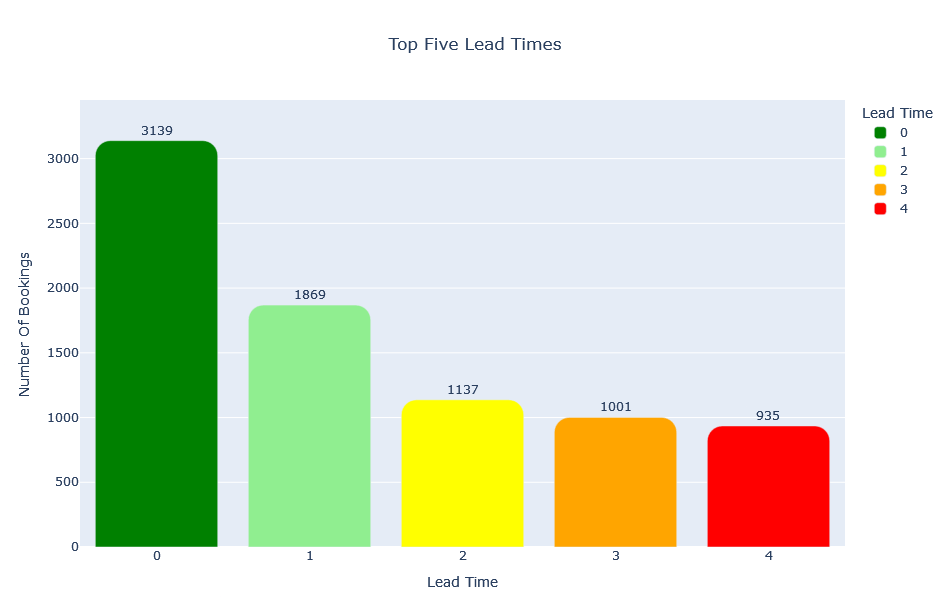

In [93]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_lead_time = df['lead_time'].value_counts().sort_values(ascending=False).head()

top_lead_time_data = pd.DataFrame({'Lead Time': top_lead_time.index,
                          'Number Of Bookings': top_lead_time.values})

fig = px.bar(top_lead_time_data, x='Lead Time', y='Number Of Bookings', labels={'x':'Lead Time', 'y':'Number Of Bookings'},
             color='Lead Time', color_discrete_map=dict(zip(top_lead_time_data['Lead Time'], colors)),
             hover_data={'Lead Time': False}, text='Number Of Bookings', title='Top Five Lead Times', 
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_lead_time.max() * 1.1])

**The bar plot indicates a predominant number of bookings with a lead time of 0 days, followed by 1, 2, 3, and 4 days, in descending order of frequency. This suggests a trend of last-minute reservations, implying that many guests make spontaneous travel decisions. To accommodate this, implement flexible booking policies, offer early booking promotions, and optimize inventory management with dynamic pricing. Guide marketing strategies to target spontaneous travelers through last-minute deals, and ensure that customer service is efficient to facilitate check-in processes.**

**Plotting The Top Five Reservation Months**

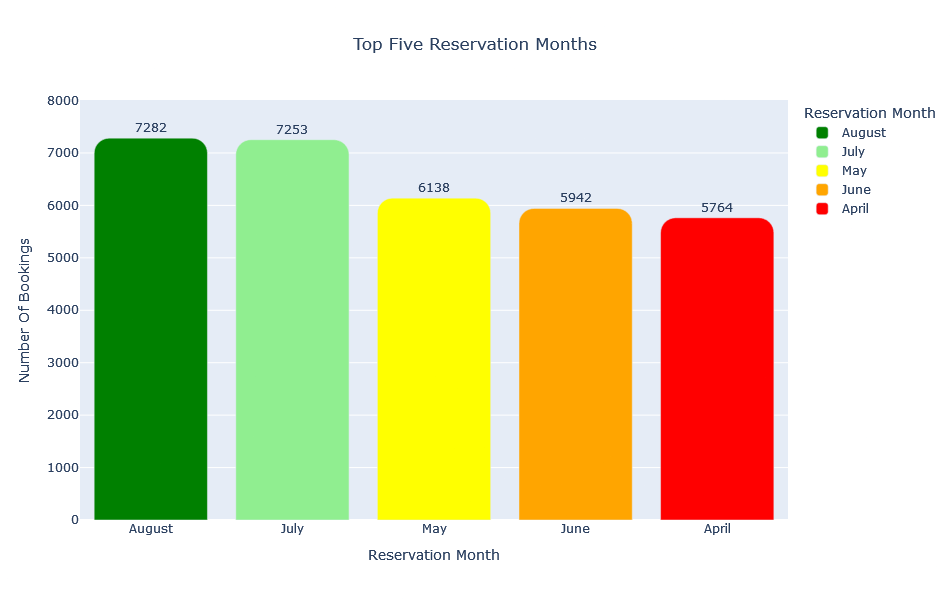

In [94]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_reservation_month = df['reservation_month'].value_counts().sort_values(ascending=False).head()

top_reservation_month_data = pd.DataFrame({'Reservation Month': top_reservation_month.index,
                          'Number Of Bookings': top_reservation_month.values})

fig = px.bar(top_reservation_month_data, x='Reservation Month', y='Number Of Bookings', labels={'x':'Reservation Month', 'y':'Number Of Bookings'},
             color='Reservation Month', color_discrete_map=dict(zip(top_reservation_month_data['Reservation Month'], colors)),
             hover_data={'Reservation Month': False}, text='Number Of Bookings', title='Top Five Reservation Months', 
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15,)
fig.update_yaxes(range=[0, top_reservation_month.max() * 1.1])

**The bar plot indicates a predominant number of reservations are made in the month of August, followed by July, May, June, and April, in descending order of frequency. This suggests that the hotel experiences peak booking periods during the summer months. To optimize revenue, consider implementing peak season pricing strategies and increasing marketing efforts during these months. Additionally, ensure adequate staffing and resources to handle the higher volume of guests, and explore offering special promotions or packages to attract even more reservations during these peak times.**

**Plotting The Top Values For The Number Of Special Requests**

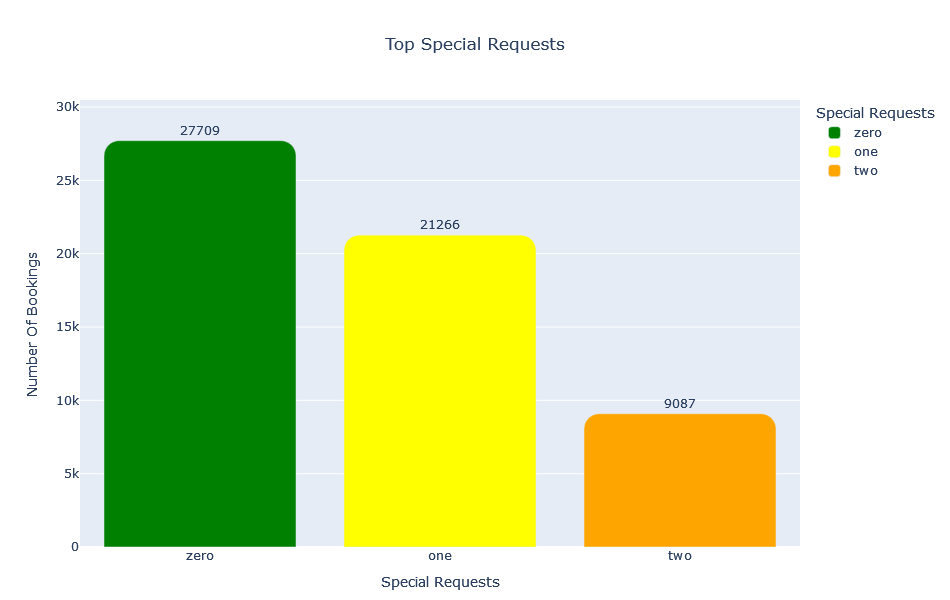

In [95]:
colors = ['green',  'yellow', 'orange']
top_total_of_special_requests = df['total_of_special_requests'].value_counts().sort_values(ascending=False).head(3)

top_total_of_special_requests_data = pd.DataFrame({'Special Requests': top_total_of_special_requests.index,
                      	'Number Of Bookings': top_total_of_special_requests.values})

fig = px.bar(top_total_of_special_requests_data, x='Special Requests', y='Number Of Bookings', labels={'x':'Special Requests', 'y':'Number Of Bookings'},
         	color='Special Requests', color_discrete_map=dict(zip(top_total_of_special_requests_data['Special Requests'], colors)),
         	hover_data={'Special Requests': False}, text='Number Of Bookings', title='Top Special Requests',
         	width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_total_of_special_requests.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with 0 special requests, followed by 1 and 2 requests, in descending order of frequency. This suggests that most guests do not require special accommodations. To enhance guest satisfaction, consider promoting special request options more prominently during the booking process. Ensure efficient handling of special requests to improve the guest experience and potentially attract more bookings from guests with specific needs.**

**Plotting The Top Values For Required Car Parking Spaces**

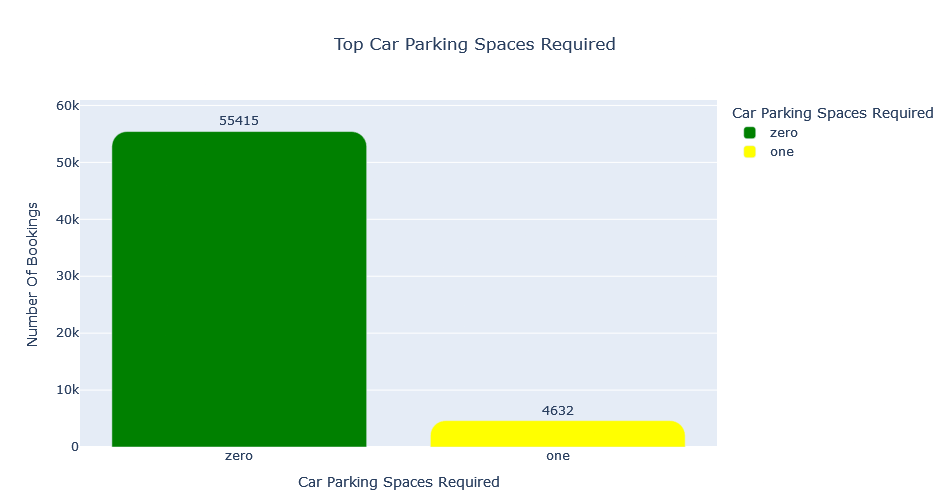

In [96]:
colors = ['green', 'yellow']
top_required_car_parking_spaces = df['required_car_parking_spaces'].value_counts().sort_values(ascending=False).head()

top_required_car_parking_spaces_data = pd.DataFrame({'Car Parking Spaces Required': top_required_car_parking_spaces.index,
                      	'Number Of Bookings': top_required_car_parking_spaces.values})

fig = px.bar(top_required_car_parking_spaces_data, x='Car Parking Spaces Required', y='Number Of Bookings', labels={'x':'Car Parking Spaces Required', 'y':'Number Of Bookings'},
         	color='Car Parking Spaces Required', color_discrete_map=dict(zip(top_required_car_parking_spaces_data['Car Parking Spaces Required'], colors)),
         	hover_data={'Car Parking Spaces Required': False}, text='Number Of Bookings', title='Top Car Parking Spaces Required',
         	width=950, height=500)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_required_car_parking_spaces.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset do not require any car parking spaces, followed by guests who require 1 car parking space. This suggests that many guests either do not bring cars or use alternative parking options. Given bookings are from 58 different countries, it's likely that guests are from out of the city, possibly explaining lower demand for parking. Consider assessing the hotel's parking service to ensure it meets guest expectations, especially for those who do require parking. Enhance communication about available parking options during the booking process and consider partnerships with nearby parking facilities to accommodate guests' needs effectively.**

**Plotting The Top Five Agents**

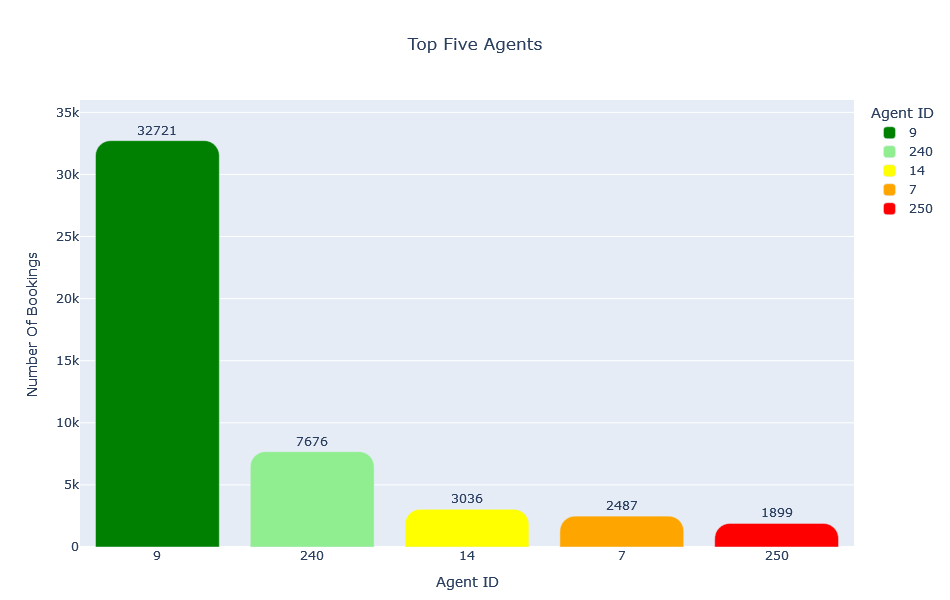

In [97]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_agents = df['agent'].value_counts().sort_values(ascending=False).head()
top_agents_data = pd.DataFrame({'Agent ID': top_agents.index, 'Number Of Bookings': top_agents.values})
fig = px.bar(top_agents_data, x='Agent ID', y='Number Of Bookings', labels={'x':'Agent ID', 'y':'Number Of Bookings'},
             color='Agent ID', color_discrete_map=dict(zip(top_agents_data['Agent ID'], colors)),
             hover_data={'Agent ID': False}, text='Number Of Bookings', title='Top Five Agents',
             width=950, height=600)
fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_agents.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset are from agent ID 9, followed by agents with IDs 240, 14, 7, and 250, in descending order of frequency. Consider strengthening the partnership or incentives with agent 9 to potentially increase bookings further. Additionally, evaluate the performance and contribution of other agents with high booking frequencies to optimize distribution channel strategies and maximize overall booking efficiency. Conduct meetings with agents who have lower booking frequencies to understand their challenges, gather feedback, and address any issues they might have, aiming to improve their performance and foster stronger partnerships.**

**Plotting The Top Five Market Segments**

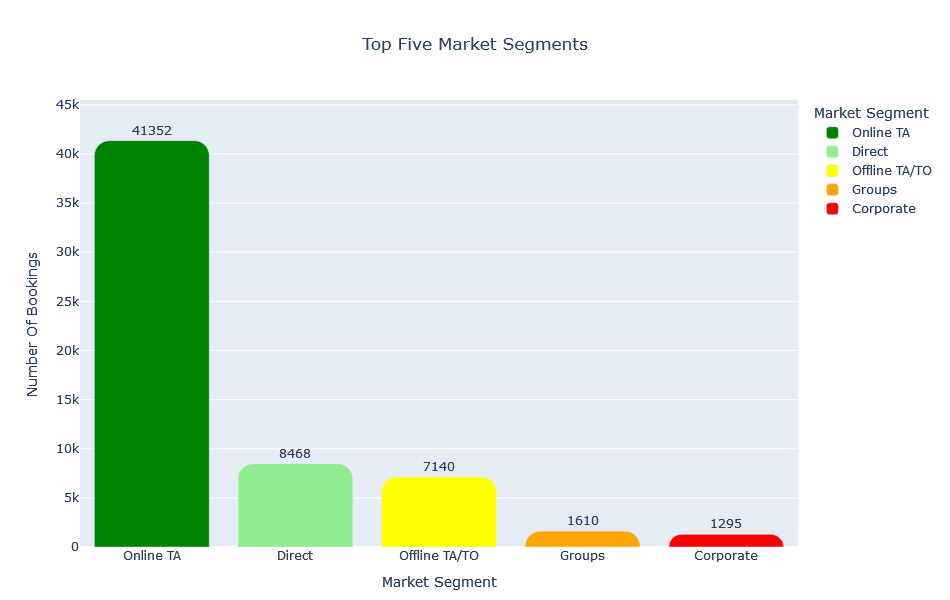

In [98]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_market_segment = df['market_segment'].value_counts().sort_values(ascending=False).head()

top_market_segment_data = pd.DataFrame({'Market Segment': top_market_segment.index,
                            	'Number Of Bookings': top_market_segment.values})

fig = px.bar(top_market_segment_data, x='Market Segment', y='Number Of Bookings', labels={'x':'Market Segment', 'y':'Number Of Bookings'},
         	color='Market Segment', color_discrete_map=dict(zip(top_market_segment_data['Market Segment'], colors)),
         	hover_data={'Market Segment': False}, text='Number Of Bookings', title='Top Five Market Segments',
         	width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_market_segment.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset from the market segment Online TA, followed by Direct, Offline TA/TO, Groups, and Corporate, in descending order of frequency. This suggests that Online Travel Agents (TA) contribute significantly to bookings, highlighting the importance of online distribution channels. To capitalize on this trend, optimize partnerships and marketing strategies with Online TAs to further increase bookings. Simultaneously, enhance direct booking capabilities and explore opportunities to attract more corporate and group bookings through targeted promotions and tailored services, aiming to diversify and strengthen the hotel's customer base.**

**Plotting The Top Five Countries**

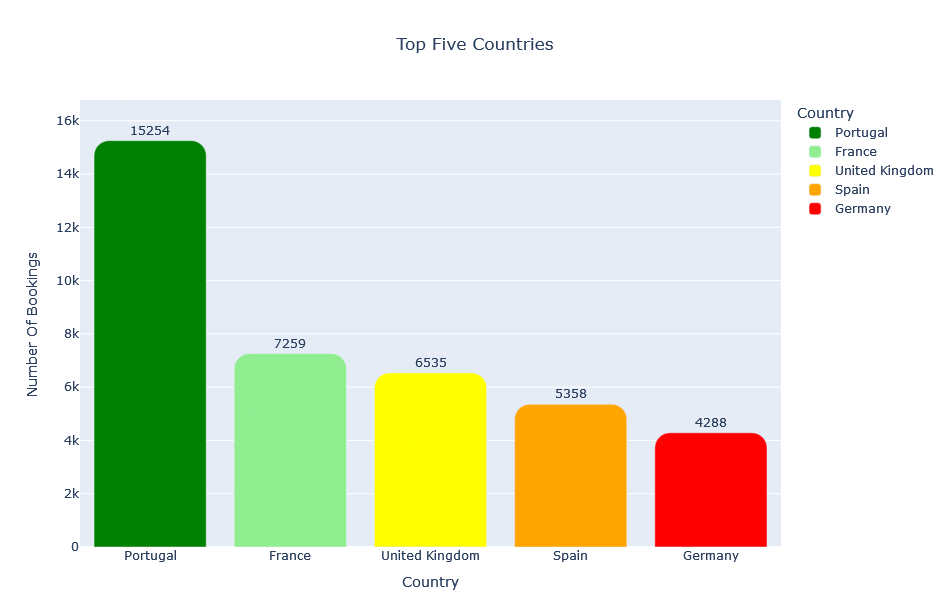

In [99]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_country = df['country'].value_counts().sort_values(ascending=False).head()

top_country_data = pd.DataFrame({'Country': top_country.index,
                                 'Number Of Bookings': top_country.values})

fig = px.bar(top_country_data, x='Country', y='Number Of Bookings', labels={'x': 'Country', 'y': 'Number Of Bookings'},
             color='Country', color_discrete_map=dict(zip(top_country_data['Country'], colors)),
             hover_data={'Country': False}, text='Number Of Bookings', title='Top Five Countries',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_country.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset are from the countries Portugal, France, United Kingdom, Spain, and Germany, in descending order of frequency, highlighting their significant contribution to the hotel's bookings. To capitalize on these insights, tailor marketing campaigns and promotional offers specifically for these key markets. Consider forging partnerships with travel agencies or online platforms popular in these regions to enhance visibility and attract more guests. Additionally, ensure multilingual support and cultural sensitivity to provide excellent service and improve guest satisfaction. To broaden our guest base further, focus on countries where we currently have fewer bookings. Develop targeted marketing strategies based on insights from market research to understand preferences and travel behaviors in these untapped regions. Strengthen visibility through localized advertising, collaborate with regional travel agencies, and introduce promotions designed to appeal to guests from these countries. This approach will diversify our geographical reach, maximize occupancy, and bolster revenue while establishing a stronger international presence.**

**Plotting The Top Values For Number Of Previous Cancellations**

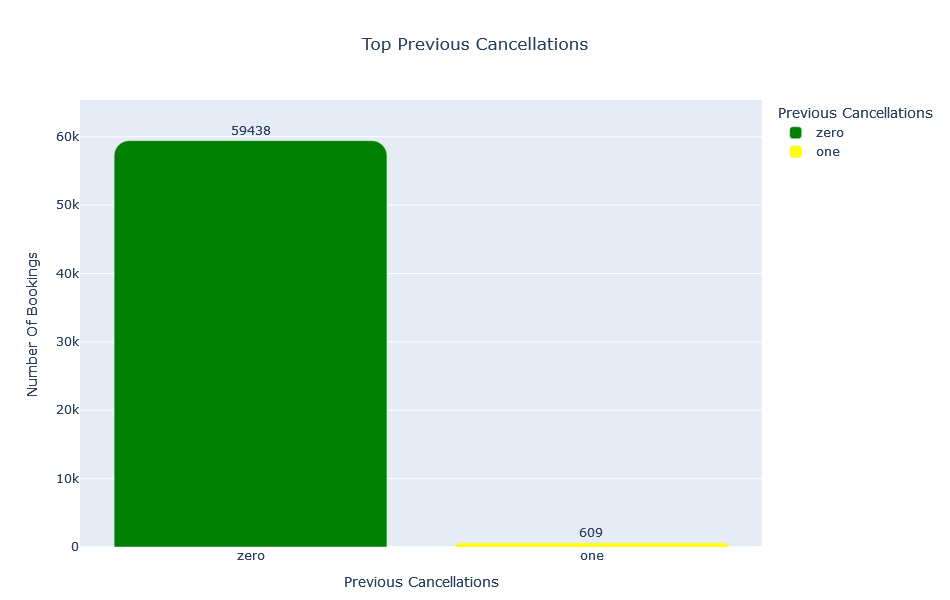

In [100]:
colors = ['green', 'yellow']
top_previous_cancellations = df['previous_cancellations'].value_counts().sort_values(ascending=False).head()

top_previous_cancellations_data = pd.DataFrame({'Previous Cancellations': top_previous_cancellations.index,
                                                'Number Of Bookings': top_previous_cancellations.values})

fig = px.bar(top_previous_cancellations_data, x='Previous Cancellations', y='Number Of Bookings', labels={'x': 'Previous Cancellations', 'y': 'Number Of Bookings'},
             color='Previous Cancellations', color_discrete_map=dict(zip(top_previous_cancellations_data['Previous Cancellations'], colors)),
             hover_data={'Previous Cancellations': False}, text='Number Of Bookings', title='Top Previous Cancellations',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_previous_cancellations.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset are from guests with zero previous cancellations, followed by those who had 1 previous cancellation, in descending order of frequency. This suggests that a majority of guests have a history of reliable bookings. To maintain this trend, continue to prioritize guest satisfaction and service excellence to reduce the likelihood of cancellations. Additionally, implement proactive measures such as reminder emails or incentives for confirming bookings to further minimize cancellations and enhance overall guest retention and satisfaction.**

**Plotting The Top Three Distribution Channels**

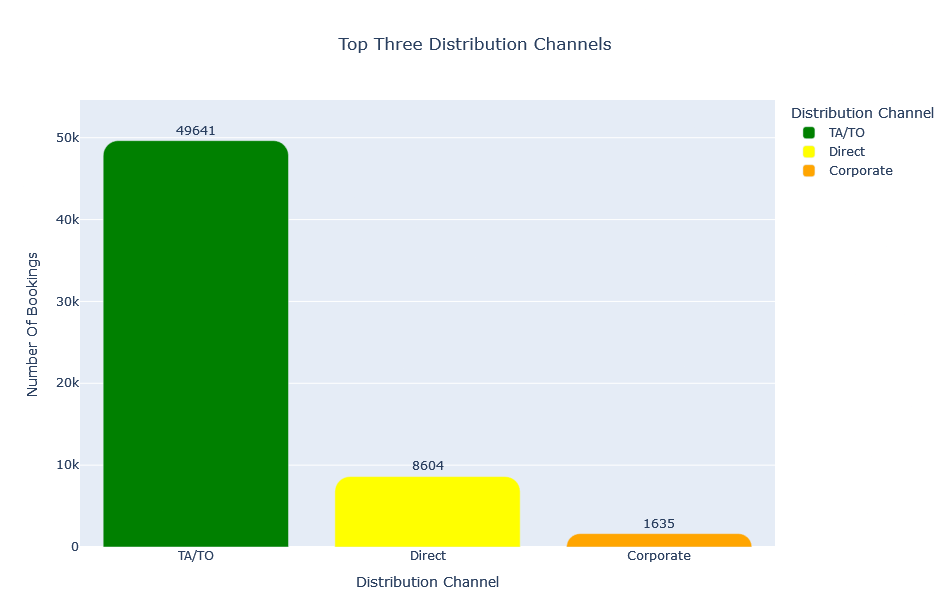

In [101]:
colors = ['green', 'yellow', 'orange']
top_distribution_channel = df['distribution_channel'].value_counts().sort_values(ascending=False).head(3)

top_distribution_channel_data = pd.DataFrame({'Distribution Channel': top_distribution_channel.index,
                                              'Number Of Bookings': top_distribution_channel.values})

fig = px.bar(top_distribution_channel_data, x='Distribution Channel', y='Number Of Bookings', labels={'x': 'Distribution Channel', 'y': 'Number Of Bookings'},
             color='Distribution Channel', color_discrete_map=dict(zip(top_distribution_channel_data['Distribution Channel'], colors)),
             hover_data={'Distribution Channel': False}, text='Number Of Bookings', title='Top Three Distribution Channels',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_distribution_channel.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset from the distribution channel TA/TO, followed by Direct and Corporate, in descending order of frequency. This highlights the significant contribution of Travel Agents/Tour Operators (TA/TO) to bookings. To capitalize on this, strengthen relationships with TA/TO partners through enhanced incentives or collaborative marketing efforts. Simultaneously, focus on increasing direct bookings by improving the hotel's online booking experience and offering exclusive promotions. For Corporate bookings, tailor packages and services that meet business travelers' needs, ensuring seamless booking processes and personalized service to enhance guest satisfaction and loyalty across all distribution channels.**

**Plotting The Top Three Customer Types**

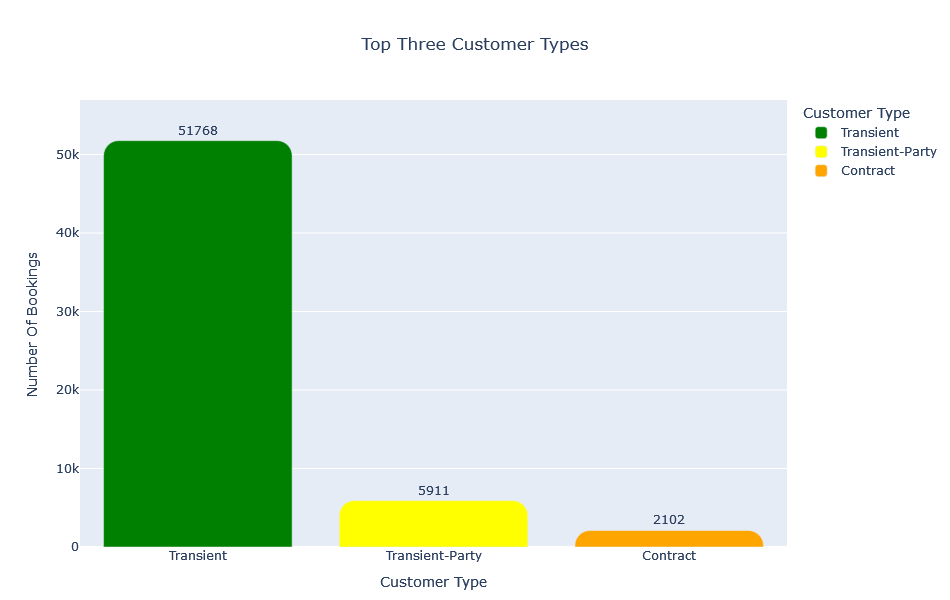

In [102]:
colors = ['green', 'yellow', 'orange']
top_customer_type = df['customer_type'].value_counts().sort_values(ascending=False).head(3)

top_customer_type_data = pd.DataFrame({'Customer Type': top_customer_type.index,
                                       'Number Of Bookings': top_customer_type.values})

fig = px.bar(top_customer_type_data, x='Customer Type', y='Number Of Bookings', labels={'x': 'Customer Type', 'y': 'Number Of Bookings'},
             color='Customer Type', color_discrete_map=dict(zip(top_customer_type_data['Customer Type'], colors)),
             hover_data={'Customer Type': False}, text='Number Of Bookings', title='Top Three Customer Types',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_customer_type.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset are from the customer type Transient, followed by Transient-Party and Contract, in descending order of frequency. This underscores the importance of catering to transient guests, who make up the majority of bookings. To maximize revenue, focus on personalized marketing strategies tailored to transient guests' preferences and behaviors. Enhance guest experiences through efficient check-in/out processes and amenities that appeal to transient travelers. Additionally, engage with Transient-Party and Contract customers by offering tailored packages and services that cater to group or business travel needs, aiming to increase bookings from these segments and optimize overall occupancy.**

**Plotting The Top Three Values For Number Of Booking Changes**

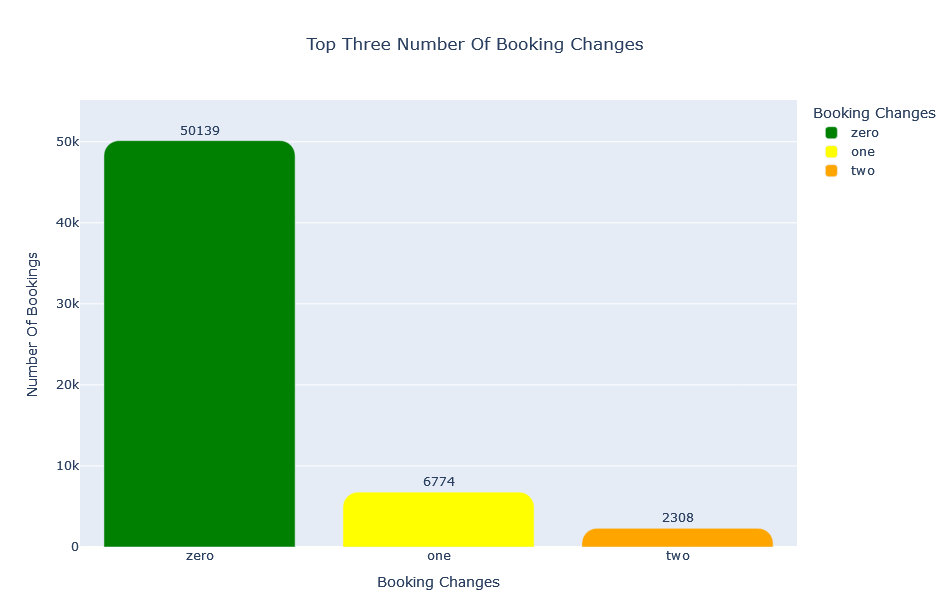

In [103]:
colors = ['green', 'yellow', 'orange']
top_booking_changes = df['booking_changes'].value_counts().sort_values(ascending=False).head(3)

top_booking_changes_data = pd.DataFrame({'Booking Changes': top_booking_changes.index,
                                         'Number Of Bookings': top_booking_changes.values})

fig = px.bar(top_booking_changes_data, x='Booking Changes', y='Number Of Bookings', labels={'x': 'Booking Changes', 'y': 'Number Of Bookings'},
             color='Booking Changes', color_discrete_map=dict(zip(top_booking_changes_data['Booking Changes'], colors)),
             hover_data={'Booking Changes': False}, text='Number Of Bookings', title='Top Three Number Of Booking Changes',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_booking_changes.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with zero booking changes, followed by 1 and 2 booking changes, in descending order of frequency. This suggests that most bookings remain stable without modifications. To maintain this trend and enhance operational efficiency, streamline booking processes and ensure clear communication of policies and options during reservation. Additionally, implement proactive measures to minimize the need for changes, such as flexible booking policies and comprehensive pre-booking information. This approach can help reduce the workload associated with modifications and improve overall guest satisfaction.**

**Plotting The Top Deposit Types**

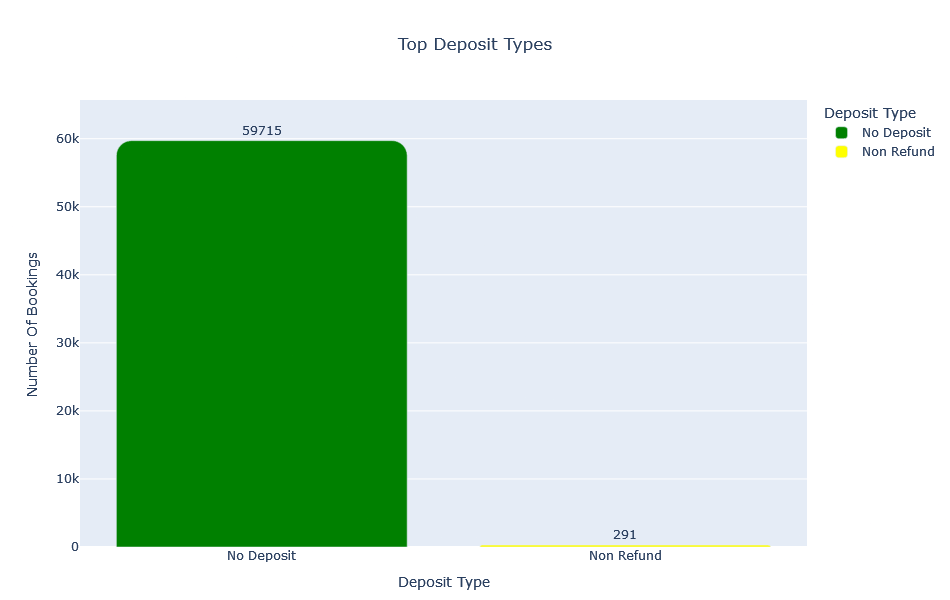

In [104]:
colors = ['green', 'yellow']
top_deposit_type = df['deposit_type'].value_counts().sort_values(ascending=False).head(2)

top_deposit_type_data = pd.DataFrame({'Deposit Type': top_deposit_type.index,
                                      'Number Of Bookings': top_deposit_type.values})

fig = px.bar(top_deposit_type_data, x='Deposit Type', y='Number Of Bookings', labels={'x': 'Deposit Type', 'y': 'Number Of Bookings'},
             color='Deposit Type', color_discrete_map=dict(zip(top_deposit_type_data['Deposit Type'], colors)),
             hover_data={'Deposit Type': False}, text='Number Of Bookings', title='Top Deposit Types',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_deposit_type.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with no deposit, followed by non-refundable deposit types, in descending order of frequency. This highlights a preference among guests for bookings that do not require upfront deposits or have stricter cancellation policies. To cater to this trend while mitigating risks, consider offering flexible booking options with minimal or no deposits for certain booking types or periods. Simultaneously, optimize revenue by strategically implementing non-refundable deposit options, ensuring clear communication of policies during the booking process to manage expectations effectively and minimize cancellations.**

**Plotting The Top Five Values For Stays In Week Nights**

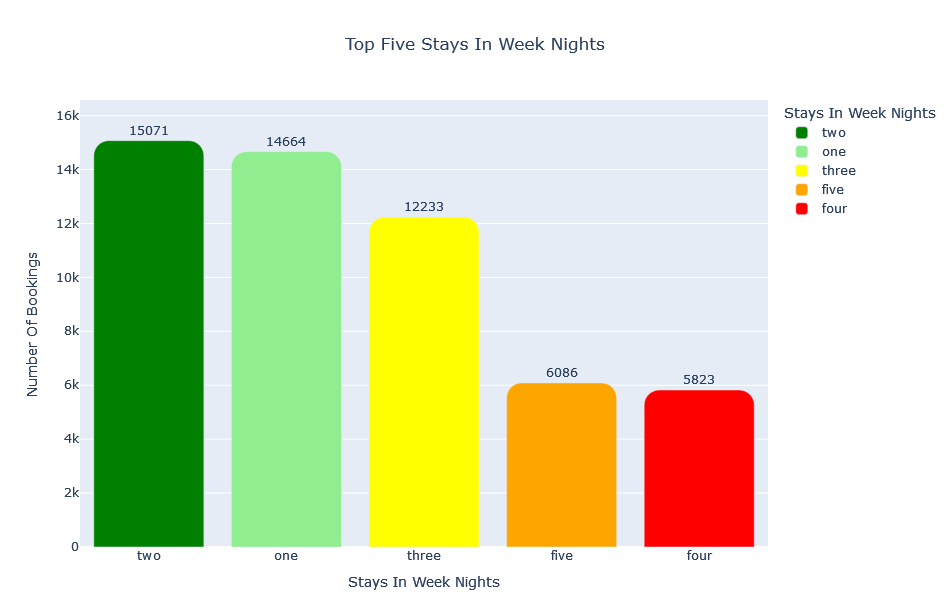

In [105]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_stays_in_week_nights = df['stays_in_week_nights'].value_counts().sort_values(ascending=False).head()

top_stays_in_week_nights_data = pd.DataFrame({'Stays In Week Nights': top_stays_in_week_nights.index,
                                              'Number Of Bookings': top_stays_in_week_nights.values})

fig = px.bar(top_stays_in_week_nights_data, x='Stays In Week Nights', y='Number Of Bookings', labels={'x': 'Stays In Week Nights', 'y': 'Number Of Bookings'},
             color='Stays In Week Nights', color_discrete_map=dict(zip(top_stays_in_week_nights_data['Stays In Week Nights'], colors)),
             hover_data={'Stays In Week Nights': False}, text='Number Of Bookings', title='Top Five Stays In Week Nights',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_stays_in_week_nights.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with two stays in weeknights, followed closely by 1, 3, 5, and 4 stays in weeknights, in descending order of frequency. This suggests a varied distribution of stays across weeknights, with two-night stays being the most common. To optimize room utilization and revenue, consider offering packages or promotions that encourage longer stays or mid-week bookings.**

**Plotting The Histogram For Average Daily Rate**

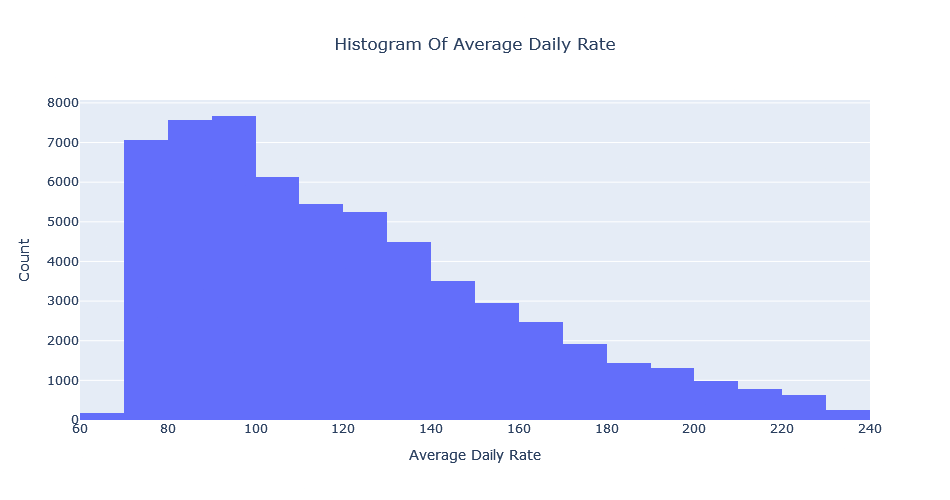

In [106]:
fig = px.histogram(df, x='adr', title='Histogram Of Average Daily Rate', nbins=30,
                   labels={'adr':'Average Daily Rate', 'count':'Count'})
fig.update_layout(title_x=0.5, width=800, height=500)
fig.update_xaxes(title_text='Average Daily Rate')
fig.update_yaxes(title_text='Count')

**The histogram above shows that the majority of bookings in the dataset have house average daily rates between 70 and 140. This pricing range appears to be the most popular among guests making reservations. To maximize revenue while maintaining competitive pricing, consider adjusting pricing strategies based on demand fluctuations and market conditions within this range. Monitor competitor rates and guest booking patterns to optimize pricing decisions and potentially attract more bookings by offering targeted promotions or value-added services within this price bracket.**

**Plotting The Top Three Arrival Years**

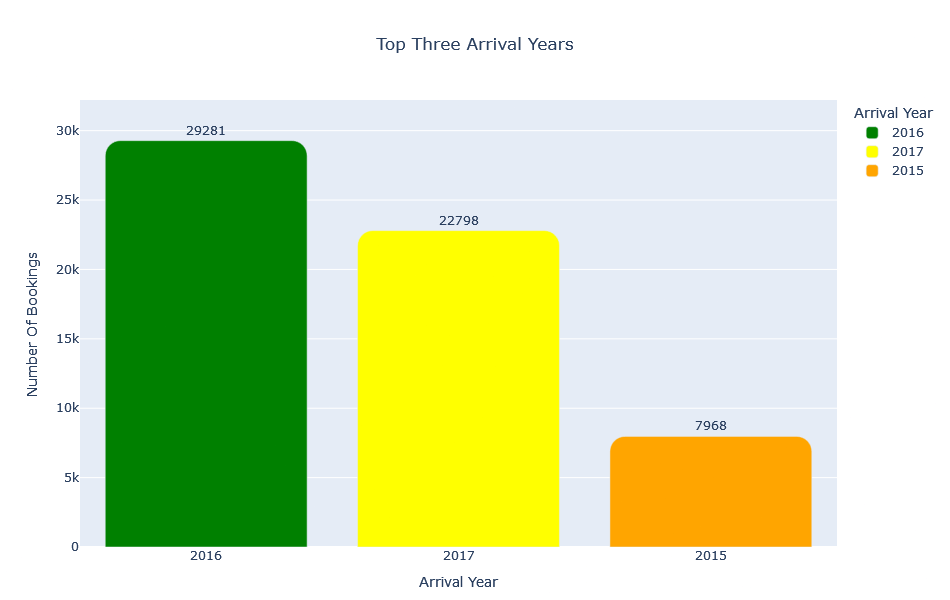

In [107]:
colors = ['green', 'yellow', 'orange']
top_arrival_date_year = df['arrival_date_year'].value_counts().sort_values(ascending=False).head()

top_arrival_date_year_data = pd.DataFrame({'Arrival Year': top_arrival_date_year.index,
                                           'Number Of Bookings': top_arrival_date_year.values})

fig = px.bar(top_arrival_date_year_data, x='Arrival Year', y='Number Of Bookings', labels={'x': 'Arrival Year', 'y': 'Number Of Bookings'},
             color='Arrival Year', color_discrete_map=dict(zip(top_arrival_date_year_data['Arrival Year'], colors)),
             hover_data={'Arrival Year': False}, text='Number Of Bookings', title='Top Three Arrival Years',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_arrival_date_year.max() * 1.1])

**The bar plot indicates that bookings peaked in 2016, slightly decreased in 2017, and were the lowest in 2015. This trend suggests fluctuating demand over the years, with potential factors influencing these variations such as economic conditions or market dynamics. To optimize future performance, capitalize on strategies that were effective during peak years, particularly focusing on enhancing marketing efforts and service offerings to attract more bookings. Consider implementing targeted promotions or packages to boost bookings during slower periods.**

**Plotting The Top Five Assigned Room Types**

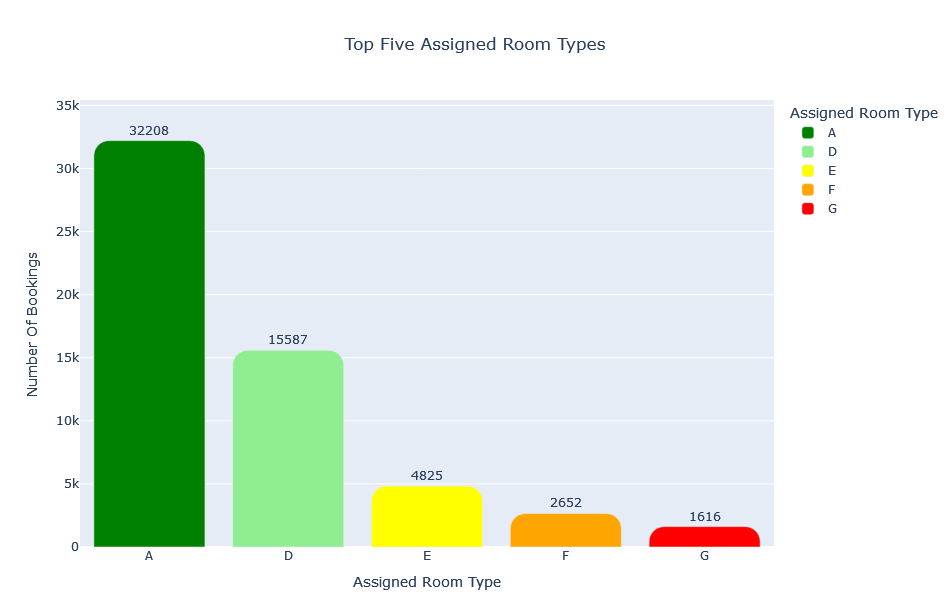

In [108]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_assigned_room_type = df['assigned_room_type'].value_counts().sort_values(ascending=False).head()

top_assigned_room_type_data = pd.DataFrame({'Assigned Room Type': top_assigned_room_type.index,
                                            'Number Of Bookings': top_assigned_room_type.values})

fig = px.bar(top_assigned_room_type_data, x='Assigned Room Type', y='Number Of Bookings', labels={'x': 'Assigned Room Type', 'y': 'Number Of Bookings'},
             color='Assigned Room Type', color_discrete_map=dict(zip(top_assigned_room_type_data['Assigned Room Type'], colors)),
             hover_data={'Assigned Room Type': False}, text='Number Of Bookings', title='Top Five Assigned Room Types',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_assigned_room_type.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with assigned room type A, followed by room types D, E, F, and G, in descending order of frequency. This distribution suggests that room type A is the most popular among guests, potentially indicating higher demand or preference for this room category. To optimize guest satisfaction and revenue, consider allocating resources to ensure availability and quality of room type A. Additionally, evaluate the amenities and features that contribute to its popularity and consider similar enhancements for other room types to diversify offerings and cater to a broader range of guest preferences.**

**Plotting The Top Values For Previous Bookings Not Canceled**

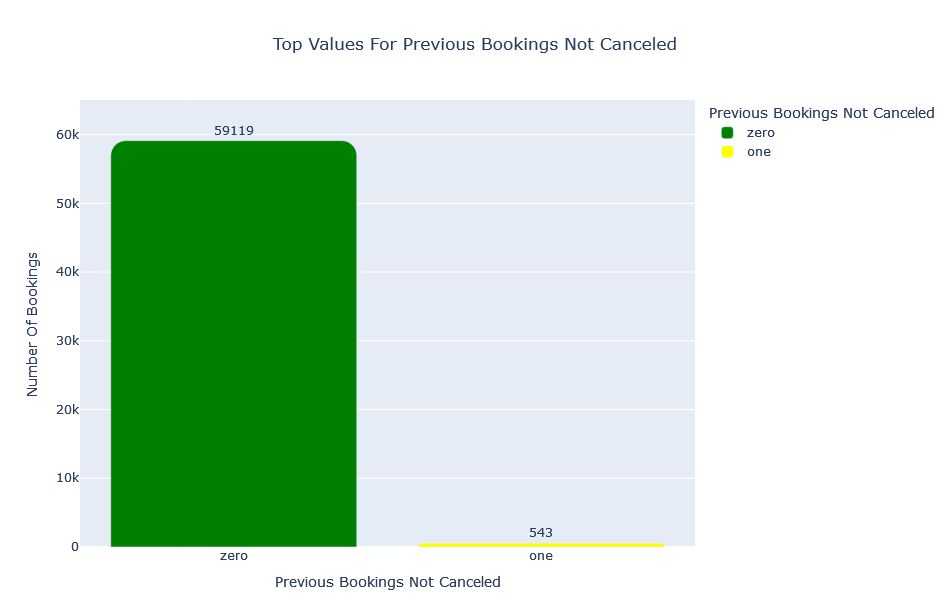

In [109]:
colors = ['green', 'yellow', 'orange']
top_previous_bookings_not_canceled = df['previous_bookings_not_canceled'].value_counts().sort_values(ascending=False).head(2)

top_previous_bookings_not_canceled_data = pd.DataFrame({'Previous Bookings Not Canceled': top_previous_bookings_not_canceled.index,
                                                        'Number Of Bookings': top_previous_bookings_not_canceled.values})

fig = px.bar(top_previous_bookings_not_canceled_data, x='Previous Bookings Not Canceled', y='Number Of Bookings', labels={'x': 'Previous Bookings Not Canceled', 'y': 'Number Of Bookings'},
             color='Previous Bookings Not Canceled', color_discrete_map=dict(zip(top_previous_bookings_not_canceled_data['Previous Bookings Not Canceled'], colors)),
             hover_data={'Previous Bookings Not Canceled': False}, text='Number Of Bookings', title='Top Values For Previous Bookings Not Canceled',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_previous_bookings_not_canceled.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with zero previous bookings not canceled, followed by 1 previous booking not canceled, in descending order of frequency. This suggests that a majority of guests have a history of reliable bookings without cancellations. To maintain this trend and enhance guest loyalty, continue to prioritize service excellence and proactive communication. Consider implementing loyalty programs or exclusive offers for repeat guests to further incentivize bookings and foster long-term relationships. Additionally, analyze guest feedback to identify areas for improvement and ensure consistent delivery of exceptional experiences across all stays**

**Plotting The Top Three Values For Number Of Adults**

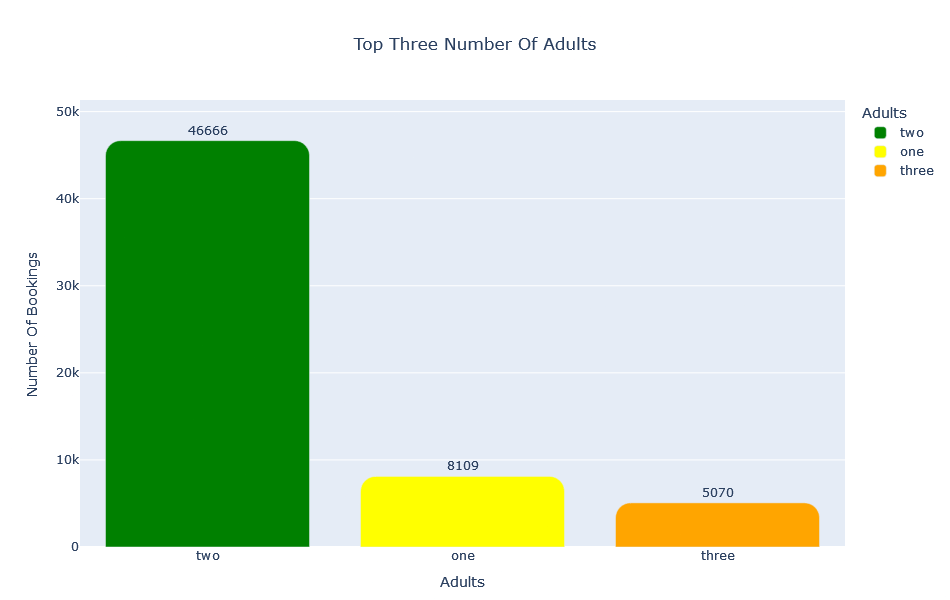

In [110]:
colors = ['green', 'yellow', 'orange']
top_adults = df['adults'].value_counts().sort_values(ascending=False).head(3)

top_adults_data = pd.DataFrame({'Adults': top_adults.index,
                                'Number Of Bookings': top_adults.values})

fig = px.bar(top_adults_data, x='Adults', y='Number Of Bookings', labels={'x': 'Adults', 'y': 'Number Of Bookings'},
             color='Adults', color_discrete_map=dict(zip(top_adults_data['Adults'], colors)),
             hover_data={'Adults': False}, text='Number Of Bookings', title='Top Three Number Of Adults',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_adults.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with two adults, followed by bookings with one and three adults, in descending order of frequency. This suggests that the majority of bookings accommodate couples or individual travelers, with fewer bookings for larger groups. To optimize room allocation and guest satisfaction, ensure that rooms are configured to comfortably accommodate varying group sizes. Consider offering promotions or packages tailored to couples and solo travelers, while also enhancing amenities and services to cater to the needs of larger groups when bookings occur.**

**Plotting The Top Three Reservation Years**

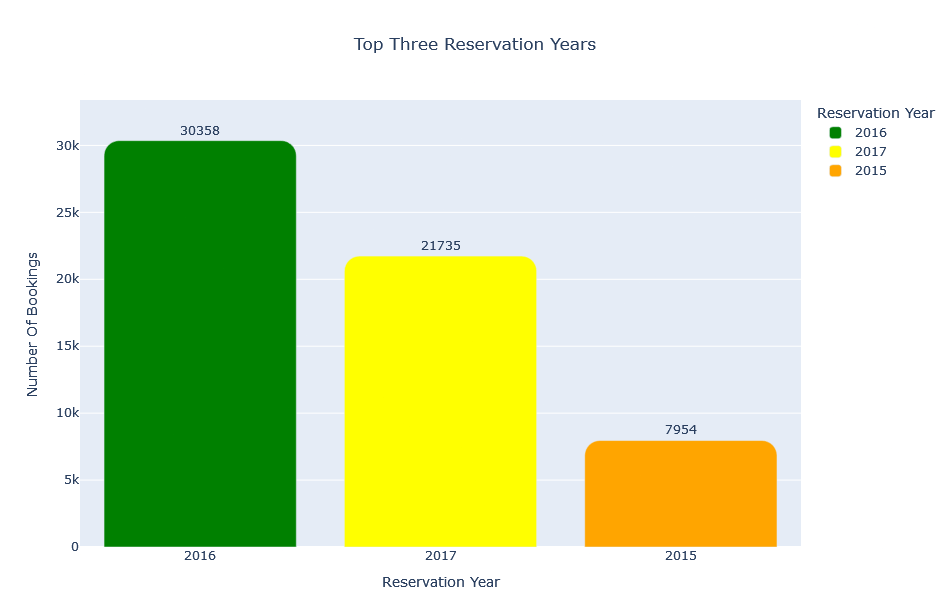

In [111]:
colors = ['green', 'yellow', 'orange']
top_reservation_year = df['reservation_year'].value_counts().sort_values(ascending=False).head()

top_reservation_year_data = pd.DataFrame({'Reservation Year': top_reservation_year.index,
                                          'Number Of Bookings': top_reservation_year.values})

fig = px.bar(top_reservation_year_data, x='Reservation Year', y='Number Of Bookings', labels={'x': 'Reservation Year', 'y': 'Number Of Bookings'},
             color='Reservation Year', color_discrete_map=dict(zip(top_reservation_year_data['Reservation Year'], colors)),
             hover_data={'Reservation Year': False}, text='Number Of Bookings', title='Top Three Reservation Years',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_reservation_year.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset were reserved in the year 2016, followed by 2017 and 2015, in descending order of frequency. This suggests that 2016 was the peak year for reservations, followed by a slight decrease in 2017 and the lowest activity in 2015. To capitalize on historical trends, focus on leveraging successful booking strategies from 2016 while adjusting for market conditions and guest preferences observed in subsequent years. Implement targeted marketing campaigns and promotions that align with peak booking periods to optimize occupancy and revenue.**

**Plotting The Top Three Meals**

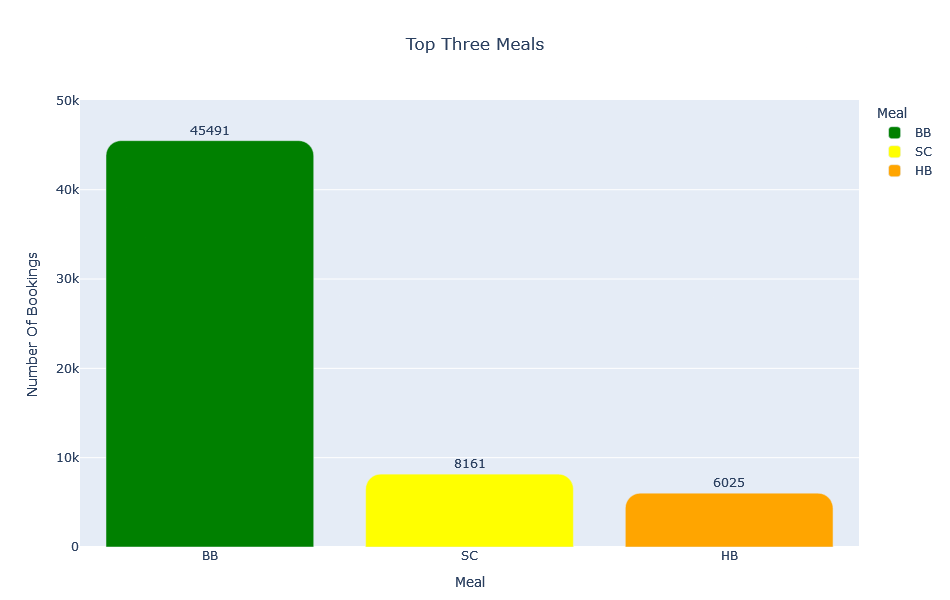

In [112]:
colors = ['green', 'yellow', 'orange']
top_meal = df['meal'].value_counts().sort_values(ascending=False).head(3)

top_meal_data = pd.DataFrame({'Meal': top_meal.index, 'Number Of Bookings': top_meal.values})

fig = px.bar(top_meal_data, x='Meal', y='Number Of Bookings', labels={'x': 'Meal', 'y': 'Number Of Bookings'},
             color='Meal', color_discrete_map=dict(zip(top_meal_data['Meal'], colors)),
             hover_data={'Meal': False}, text='Number Of Bookings', title='Top Three Meals',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_meal.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with booked meal type BB (Bed and Breakfast), followed by SC (Room Only) and HB (Half Board), in descending order of frequency. This suggests that guests often prefer meal-inclusive options, particularly Bed and Breakfast, followed by Room Only and Half Board options. To enhance guest satisfaction and optimize revenue, ensure that meal offerings are well-promoted and tailored to guest preferences. Consider enhancing meal packages or offering flexible dining options to cater to diverse guest needs and preferences, aiming to attract more bookings by aligning services with guest expectations.**

**Plotting The Top Values For Is Repeated Guest**

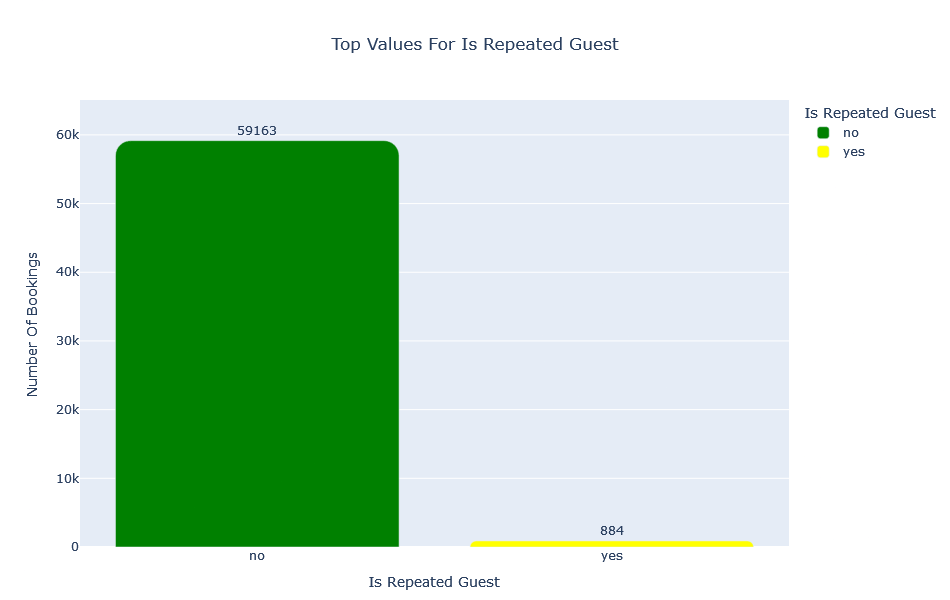

In [113]:
colors = ['green', 'yellow']
top_is_repeated_guest = df['is_repeated_guest'].value_counts().sort_values(ascending=False).head()

top_is_repeated_guest_data = pd.DataFrame({'Is Repeated Guest': top_is_repeated_guest.index,
                                           'Number Of Bookings': top_is_repeated_guest.values})

fig = px.bar(top_is_repeated_guest_data, x='Is Repeated Guest', y='Number Of Bookings', labels={'x': 'Is Repeated Guest', 'y': 'Number Of Bookings'},
             color='Is Repeated Guest', color_discrete_map=dict(zip(top_is_repeated_guest_data['Is Repeated Guest'], colors)),
             hover_data={'Is Repeated Guest': False}, text='Number Of Bookings', title='Top Values For Is Repeated Guest',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_is_repeated_guest.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset from non-repeated guests, followed by repeated guests, in descending order of frequency. This suggests that the hotel attracts a significant number of new guests, with a notable portion being repeat visitors. To enhance guest retention and loyalty, focus on personalized experiences and loyalty programs tailored to repeat guests. Implement strategies to incentivize repeat bookings, such as exclusive offers or rewards for loyal customers. Additionally, prioritize guest satisfaction across all stays to encourage positive reviews and referrals, which can contribute to increased bookings from both new and repeat guests.**

**Plotting The Top Three Values Number Of Children**

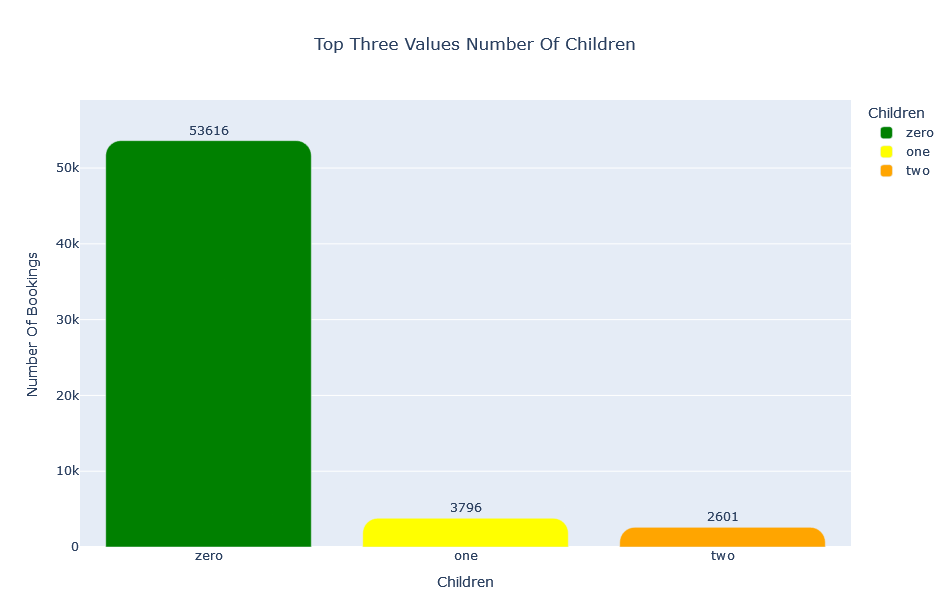

In [114]:
colors = ['green','yellow', 'orange']
top_children = df['children'].value_counts().sort_values(ascending=False).head(3)

top_children_data = pd.DataFrame({'Children': top_children.index,
                                  'Number Of Bookings': top_children.values})

fig = px.bar(top_children_data, x='Children', y='Number Of Bookings', labels={'x': 'Children', 'y': 'Number Of Bookings'},
             color='Children', color_discrete_map=dict(zip(top_children_data['Children'], colors)),
             hover_data={'Children': False}, text='Number Of Bookings', title='Top Three Values Number Of Children',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_children.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with 0 children, followed by bookings with 1 and 2 children, in descending order of frequency. This suggests that most guests are either solo travelers or couples without children, with fewer family bookings. To cater to this demographic, ensure that amenities and services are tailored to the needs of solo travelers and couples. Additionally, consider offering family-friendly packages and amenities to attract more bookings from guests with children, aiming to diversify the guest profile and increase overall occupancy.**

**Plotting The Top Five Arrival Months**

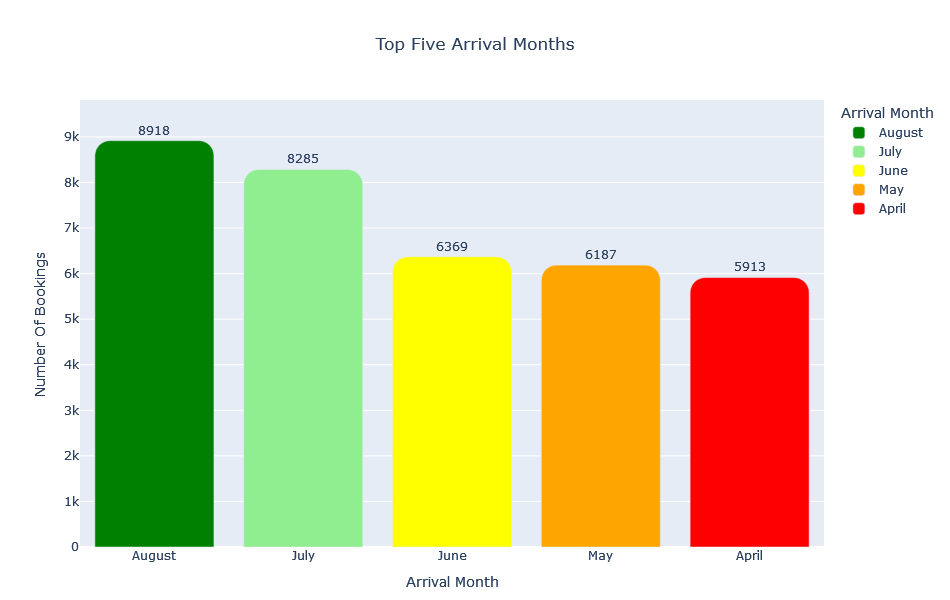

In [115]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_arrival_date_month = df['arrival_date_month'].value_counts().sort_values(ascending=False).head()

top_arrival_date_month_data = pd.DataFrame({'Arrival Month': top_arrival_date_month.index,
                                            'Number Of Bookings': top_arrival_date_month.values})

fig = px.bar(top_arrival_date_month_data, x='Arrival Month', y='Number Of Bookings', labels={'x': 'Arrival Month', 'y': 'Number Of Bookings'},
             color='Arrival Month', color_discrete_map=dict(zip(top_arrival_date_month_data['Arrival Month'], colors)),
             hover_data={'Arrival Month': False}, text='Number Of Bookings', title='Top Five Arrival Months',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_arrival_date_month.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with arrivals in the month of August, followed by July, June, May, and April, in descending order of frequency. This suggests that the hotel experiences peak booking periods during the summer months. To optimize revenue and manage high demand, consider implementing peak season pricing strategies and increasing marketing efforts during these months. Additionally, ensure adequate staffing and resources to handle the higher volume of guests. To address lower bookings during the winter months, develop targeted off-season promotions and packages to attract guests. Consider offering discounts, themed events, or bundled services to make the hotel more appealing during the slower season. By balancing strategies for both peak and off-peak periods, the hotel can maintain steadier occupancy and revenue year-round.**

**Plotting The Top Five Arrival Week Numbers**

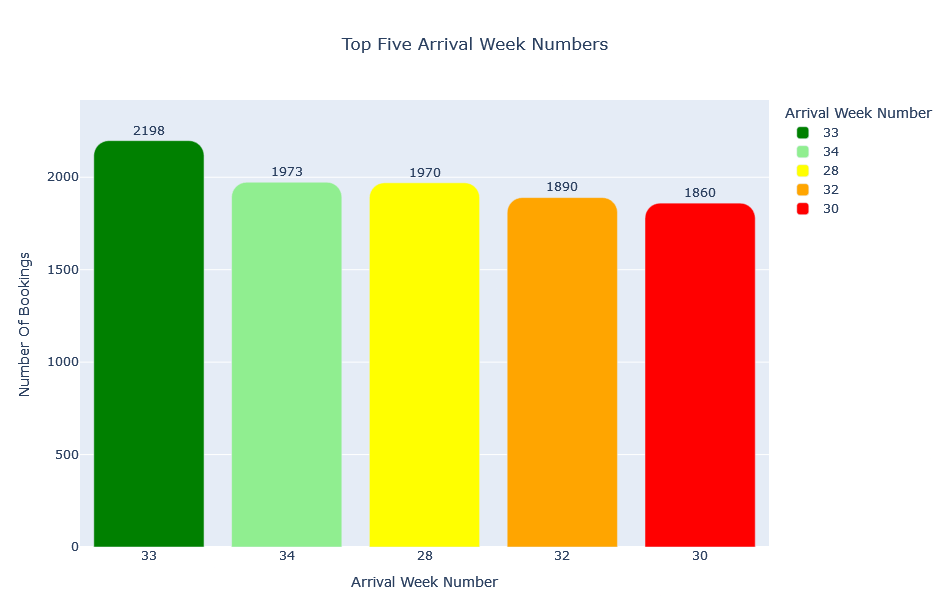

In [116]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_arrival_date_week_number = df['arrival_date_week_number'].value_counts().sort_values(ascending=False).head()

top_arrival_date_week_number_data = pd.DataFrame({'Arrival Week Number': top_arrival_date_week_number.index,
                                                  'Number Of Bookings': top_arrival_date_week_number.values})

fig = px.bar(top_arrival_date_week_number_data, x='Arrival Week Number', y='Number Of Bookings', labels={'x': 'Arrival Week Number', 'y': 'Number Of Bookings'},
             color='Arrival Week Number', color_discrete_map=dict(zip(top_arrival_date_week_number_data['Arrival Week Number'], colors)),
             hover_data={'Arrival Week Number': False}, text='Number Of Bookings', title='Top Five Arrival Week Numbers',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_arrival_date_week_number.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with arrivals in week number 33, followed by week numbers 34, 28, 32, and 30, in descending order of frequency. This suggests that certain weeks, particularly around late summer, experience higher booking volumes. To optimize occupancy and revenue, focus on these peak weeks by implementing dynamic pricing strategies and targeted marketing campaigns. Additionally, ensure that staffing and resources are adequately managed to handle the increased demand during these weeks. To balance occupancy throughout the year, consider developing special promotions and events to attract guests during off-peak weeks.**

**Plotting The Top Five Values For Stays In Weekend Nights**

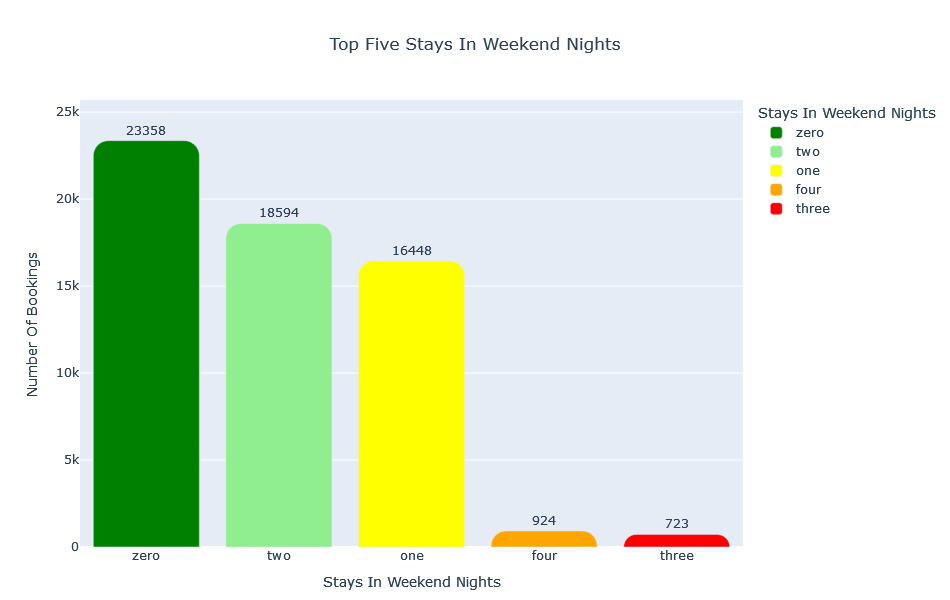

In [117]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_stays_in_weekend_nights = df['stays_in_weekend_nights'].value_counts().sort_values(ascending=False).head()

top_stays_in_weekend_nights_data = pd.DataFrame({'Stays In Weekend Nights': top_stays_in_weekend_nights.index,
                                                 'Number Of Bookings': top_stays_in_weekend_nights.values})

fig = px.bar(top_stays_in_weekend_nights_data, x='Stays In Weekend Nights', y='Number Of Bookings', labels={'x': 'Stays In Weekend Nights', 'y': 'Number Of Bookings'},
             color='Stays In Weekend Nights', color_discrete_map=dict(zip(top_stays_in_weekend_nights_data['Stays In Weekend Nights'], colors)),
             hover_data={'Stays In Weekend Nights': False}, text='Number Of Bookings', title='Top Five Stays In Weekend Nights',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_stays_in_weekend_nights.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with zero stays in weekend nights, followed by 2, 1, 4, and 3 stays in weekend nights, in descending order of frequency. This suggests that many guests prefer weekday stays, with fewer opting for weekend stays. To increase weekend occupancy, consider implementing special weekend promotions, packages, and events designed to attract guests. Additionally, enhance marketing efforts targeting weekend travelers, such as couples and families looking for short getaways. By offering unique weekend experiences and incentives, the hotel can balance occupancy rates and optimize revenue across all days of the week.**

**Plotting The Top Five Reserved Room Types**

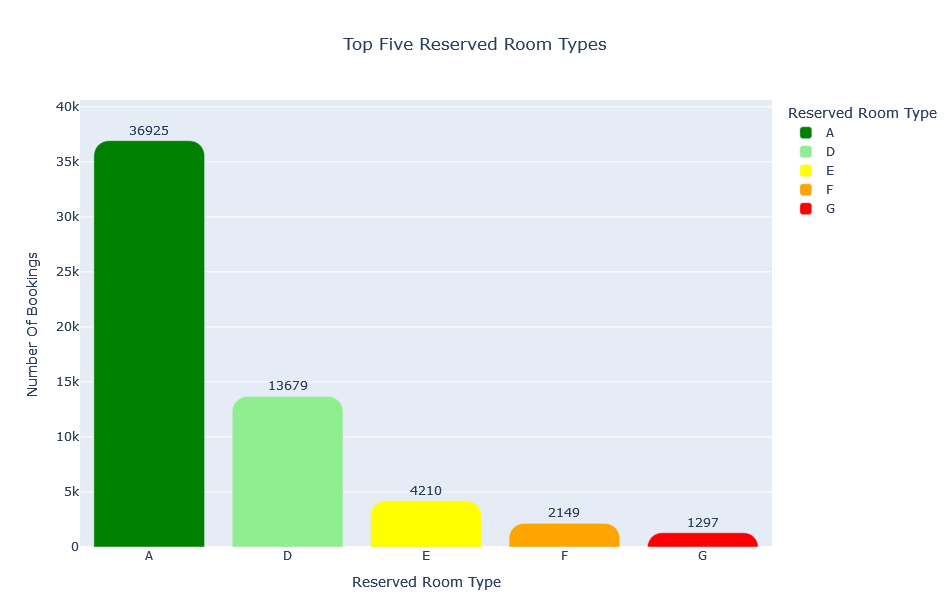

In [118]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_reserved_room_type = df['reserved_room_type'].value_counts().sort_values(ascending=False).head()

top_reserved_room_type_data = pd.DataFrame({'Reserved Room Type': top_reserved_room_type.index,
                                            'Number Of Bookings': top_reserved_room_type.values})

fig = px.bar(top_reserved_room_type_data, x='Reserved Room Type', y='Number Of Bookings', labels={'x': 'Reserved Room Type', 'y': 'Number Of Bookings'},
             color='Reserved Room Type', color_discrete_map=dict(zip(top_reserved_room_type_data['Reserved Room Type'], colors)),
             hover_data={'Reserved Room Type': False}, text='Number Of Bookings', title='Top Five Reserved Room Types',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_reserved_room_type.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with the reserved room type A, followed by room types D, E, F, and G, in descending order of frequency. This suggests that room type A is the most popular choice among guests, indicating a high demand for this room category. To maximize revenue and guest satisfaction, ensure ample availability and quality maintenance of room type A. Additionally, analyze the features and amenities that make room type A appealing and consider enhancing similar attributes in other room types to increase their attractiveness. Offering targeted promotions for less popular room types may also help in balancing occupancy across different categories.**

**Plotting The Top Hotels**

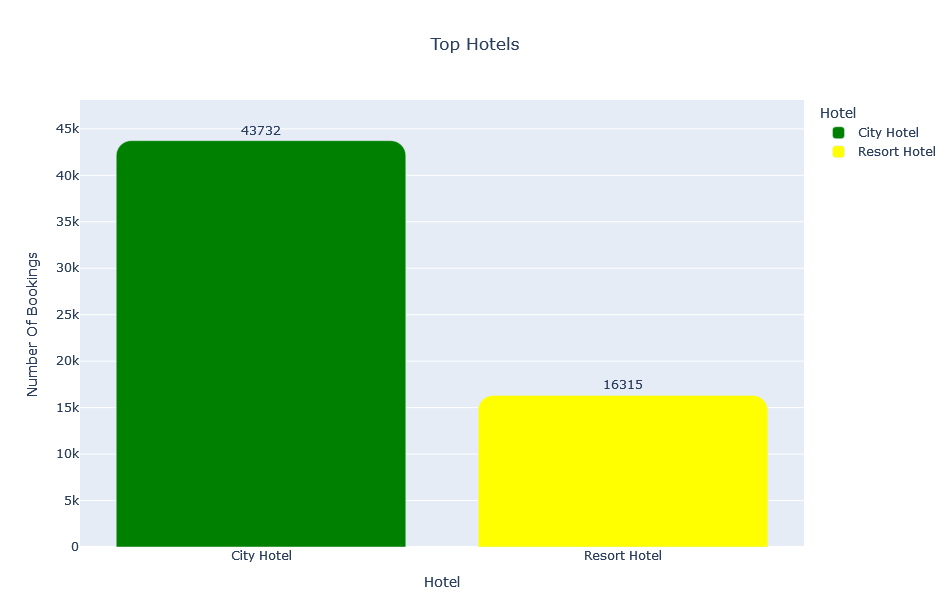

In [119]:
colors = ['green', 'yellow']
top_hotel = df['hotel'].value_counts().sort_values(ascending=False).head()

top_hotel_data = pd.DataFrame({'Hotel': top_hotel.index,
                               'Number Of Bookings': top_hotel.values})

fig = px.bar(top_hotel_data, x='Hotel', y='Number Of Bookings', labels={'x': 'Hotel', 'y': 'Number Of Bookings'},
             color='Hotel', color_discrete_map=dict(zip(top_hotel_data['Hotel'], colors)),
             hover_data={'Hotel': False}, text='Number Of Bookings', title='Top Hotels',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_hotel.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset are in the city hotel, followed by the resort hotel, in descending order of frequency. This suggests that the city hotel is more popular among guests compared to the resort hotel. To capitalize on this trend, focus marketing efforts and resources on promoting the city hotel, highlighting its unique features and amenities. Additionally, develop targeted strategies to boost the appeal of resort hotel, such as offering special packages, enhancing amenities, or promoting seasonal attractions. Balancing promotional efforts between both types of hotels can help optimize overall occupancy and revenue.**

**Plotting The Top Values For Number Of Babies**

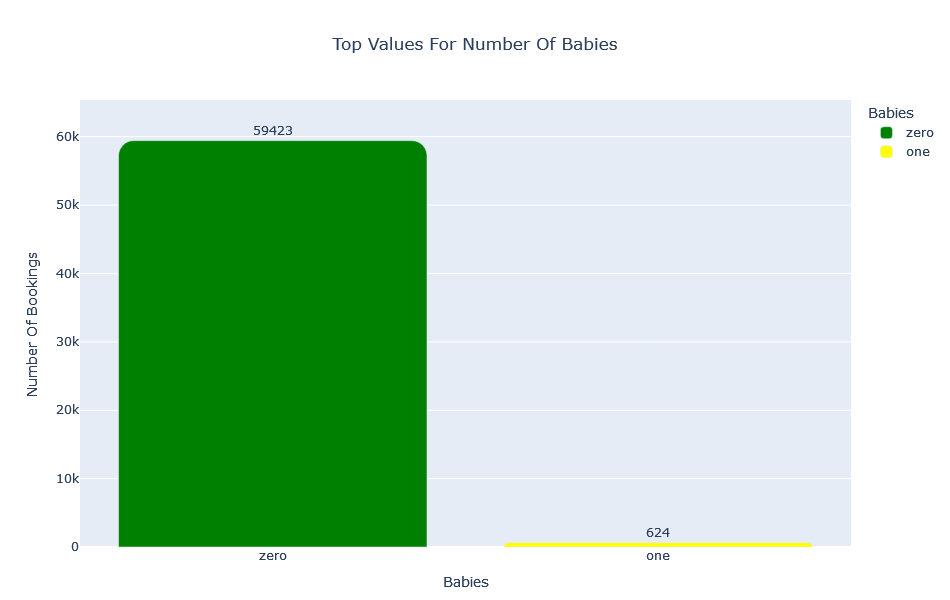

In [120]:
colors = ['green', 'yellow']
top_babies = df['babies'].value_counts().sort_values(ascending=False).head()

top_babies_data = pd.DataFrame({'Babies': top_babies.index,
                                'Number Of Bookings': top_babies.values})

fig = px.bar(top_babies_data, x='Babies', y='Number Of Bookings', labels={'x': 'Babies', 'y': 'Number Of Bookings'},
             color='Babies', color_discrete_map=dict(zip(top_babies_data['Babies'], colors)),
             hover_data={'Babies': False}, text='Number Of Bookings', title='Top Values For Number Of Babies',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_babies.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset have no babies, followed by bookings with 1 baby, in descending order of frequency. This suggests that most guests do not travel with babies, with a smaller proportion of bookings including infants. To cater to this demographic, focus on amenities and services that appeal to adults and older children. Additionally, to attract more families with babies, consider offering family-friendly amenities such as cribs, baby-proof rooms, and child care services. Additionally, promote family-oriented packages and activities to make the hotel more appealing to guests with young children.**

**Plotting The Top For Arrival Dates Of Months**

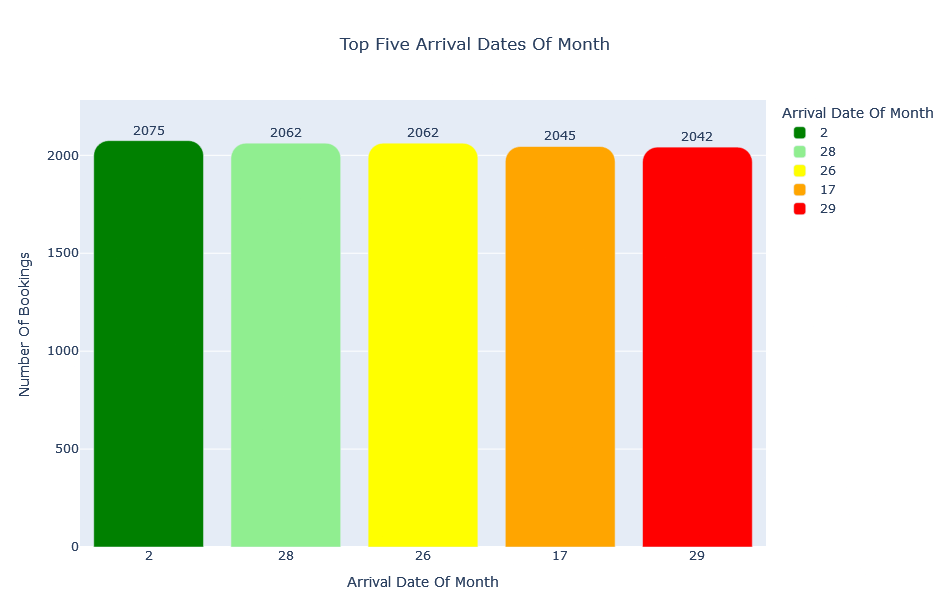

In [121]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_arrival_date_day_of_month = df['arrival_date_day_of_month'].value_counts().sort_values(ascending=False).head()

top_arrival_date_day_of_month_data = pd.DataFrame({'Arrival Date Of Month': top_arrival_date_day_of_month.index,
                                                   'Number Of Bookings': top_arrival_date_day_of_month.values})

fig = px.bar(top_arrival_date_day_of_month_data, x='Arrival Date Of Month', y='Number Of Bookings', labels={'x': 'Arrival Date Of Month', 'y': 'Number Of Bookings'},
             color='Arrival Date Of Month', color_discrete_map=dict(zip(top_arrival_date_day_of_month_data['Arrival Date Of Month'], colors)),
             hover_data={'Arrival Date Of Month': False}, text='Number Of Bookings', title='Top Five Arrival Dates Of Month',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_arrival_date_day_of_month.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with arrival dates on the 2nd, followed by the 28th, 26th, 17th, and 29th, in descending order of frequency. This pattern suggests that the 2nd of the month sees the highest number of arrivals, followed by several other peak dates throughout the month. To optimize guest satisfaction and operational efficiency, ensure sufficient staffing and resources are allocated on these peak arrival dates. Additionally, consider offering promotions or incentives for bookings on less popular arrival dates to balance occupancy and maximize revenue across the entire month.**

**Plotting The Top Five Reservation Dates**

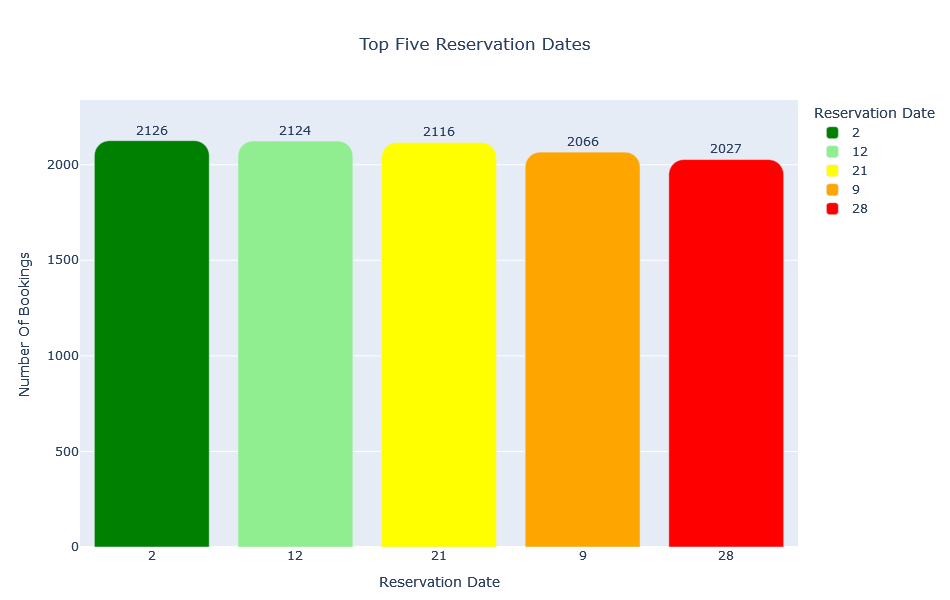

In [122]:
colors = ['green', 'lightgreen', 'yellow', 'orange', 'red']
top_reservation_date = df['reservation_date'].value_counts().sort_values(ascending=False).head()

top_reservation_date_data = pd.DataFrame({'Reservation Date': top_reservation_date.index,
                                          'Number Of Bookings': top_reservation_date.values})

fig = px.bar(top_reservation_date_data, x='Reservation Date', y='Number Of Bookings', labels={'x': 'Reservation Date', 'y': 'Number Of Bookings'},
             color='Reservation Date', color_discrete_map=dict(zip(top_reservation_date_data['Reservation Date'], colors)),
             hover_data={'Reservation Date': False}, text='Number Of Bookings', title='Top Five Reservation Dates',
             width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15, margin=dict(b=30))
fig.update_yaxes(range=[0, top_reservation_date.max() * 1.1])

**The bar plot indicates a predominant number of bookings in the dataset with reservation dates on the 2nd, followed closely by the 12th, 21st, 9th, and 28th, in descending order of frequency. This pattern suggests that these dates are popular for making reservations. To optimize booking efficiency and guest satisfaction, ensure that reservation systems are robust and responsive on these peak reservation dates. Additionally, consider implementing promotional offers or incentives during quieter reservation periods to encourage bookings and maintain steady occupancy throughout the month.**

Conclusions Of Univariate Analysis:

1. Lead Time Analysis: The data reveals a trend of last-minute reservations, predominantly within 0 to 4 days. To cater to spontaneous travelers, implement flexible booking policies, early booking promotions, and dynamic pricing strategies. Target these guests through tailored marketing campaigns and ensure efficient customer service for seamless check-in experiences.

2. Monthly Reservation Trends: Peak bookings occur in August, July, May, June, and April, indicating strong summer demand. Optimize revenue by deploying peak season pricing strategies, intensifying marketing efforts, and offering special promotions. Adequate staffing and resource management are crucial during these high-volume periods.

3. Special Requests Analysis: Most guests do not request special accommodations. Enhance guest satisfaction by promoting special request options prominently during booking. Efficient handling of requests can improve guest experience and attract bookings from guests with specific needs.

4. Car Parking Demand: Majority of bookings do not require parking, suggesting guests either use alternative transport or are from out of town. Evaluate parking services to meet guest expectations, enhance communication about parking options, and consider partnerships with nearby facilities.

5. Agent Contribution Analysis: Bookings are primarily driven by a few key agents. Strengthen partnerships with top-performing agents and evaluate others to optimize distribution channels. Support agents with lower booking frequencies to improve performance and foster stronger relationships.

6. Market Segment Analysis: Online Travel Agents (TA) dominate bookings, highlighting the importance of optimizing partnerships and marketing strategies with Online TAs. Enhance direct booking capabilities and target corporate and group bookings through tailored promotions and services to diversify customer base.

7. Top Booking Countries: Focus marketing efforts on key markets like Portugal, France, UK, Spain, and Germany. Tailor campaigns, forge partnerships with local agencies, and ensure multilingual support to attract more guests and enhance guest satisfaction.

8. Guest Cancellation History: Most guests have no history of cancellations, indicating reliability. Prioritize guest satisfaction to maintain this trend, implement proactive measures like reminder emails, and incentives to minimize cancellations and improve guest retention.

9. Distribution Channel Analysis: Travel Agents/Tour Operators (TA/TO) play a significant role in bookings. Strengthen relationships with TA/TO partners, improve online booking experiences for direct bookings, and tailor services for corporate clients to optimize all distribution channels.

10. Customer Type Analysis: Transient guests dominate bookings, suggesting personalized marketing and enhanced guest experiences tailored to transient preferences. Engage Transient-Party and Contract customers with specialized packages to increase bookings from these segments.

11. Booking Changes Analysis: Most bookings remain stable without changes, indicating efficient booking processes. To maintain this trend, streamline procedures and communicate policies clearly. Implement flexible booking options and preemptive measures to minimize changes, ensuring guest satisfaction and operational efficiency.

12. Deposit Preference Analysis: Guests predominantly opt for bookings without deposits or with non-refundable options. Cater to this preference by offering flexible booking choices and strategic non-refundable deposit options. Clear communication of policies during booking helps manage expectations and mitigate cancellations while maximizing revenue.

13. Weeknight Stays Distribution: Two-night stays are most common among weeknight bookings. Encourage longer stays with promotions and packages tailored to mid-week guests to optimize room utilization and revenue.

14. Average Daily Rate Distribution: Most bookings fall within the 70-140 range, indicating a popular pricing bracket. Adjust pricing dynamically based on demand and market conditions within this range. Monitor competitor rates and guest booking patterns to attract more bookings through targeted promotions and enhanced services.

15. Booking Trends by Arrival Year: Bookings peaked in 2016, declined slightly in 2017, and were lowest in 2015. Capitalize on successful strategies from peak years, enhancing marketing efforts and service offerings to align with historical demand patterns and boost bookings during slower periods.

16. Assigned Room Type Analysis: Room type A is most favored, suggesting high demand or guest preference. Ensure availability and quality of room type A while evaluating amenities that contribute to its popularity. Enhance other room types to diversify offerings and cater to broader guest preferences.

17. Guest Booking History: Majority of guests have a reliable booking history with no cancellations. Maintain guest loyalty through exceptional service and proactive communication. Implement loyalty programs and personalized offers to incentivize repeat bookings and enhance guest relationships.

18. Guests by Adult Count: Bookings predominantly accommodate two adults, followed by singles and groups of three. Optimize room allocation and guest satisfaction by configuring rooms to suit various group sizes. Tailor promotions and amenities to both couples and larger groups to enhance overall guest experience.

19. Booking Distribution by Reservation Year: 2016 saw the highest bookings, with slight decreases in subsequent years. Leverage successful strategies from peak years while adapting to current market conditions and guest preferences through targeted marketing campaigns and promotions.

20. Meal Type Preference Analysis: Bed and Breakfast (BB) is the most preferred meal type, followed by Room Only (SC) and Half Board (HB). Enhance guest satisfaction and revenue by promoting meal packages aligned with guest preferences. Offer flexible dining options to cater to diverse needs and attract more bookings.

21. Guest Type Analysis: The hotel attracts a significant number of new guests, with a notable portion being repeat visitors. To enhance guest retention and loyalty, focus on personalized experiences and loyalty programs for repeat guests. Incentivize repeat bookings with exclusive offers and prioritize guest satisfaction across all stays to encourage positive reviews and referrals, thereby increasing bookings from both new and repeat guests.

22. Guests with Children Analysis: Most bookings are from solo travelers or couples without children, with fewer family bookings. Tailor amenities and services to the needs of solo travelers and couples, while also offering family-friendly packages and amenities to attract bookings from guests with children. This approach aims to diversify the guest profile and increase overall occupancy.

23. Monthly Booking Patterns Analysis: Peak booking periods occur during the summer months, particularly in August, followed by July, June, May, and April. Optimize revenue during peak seasons with dynamic pricing strategies and increased marketing efforts. Ensure adequate staffing and resources to manage higher guest volumes. Implement targeted off-season promotions to boost bookings during slower winter months, enhancing overall occupancy year-round.

24. Weekly Booking Patterns Analysis: Certain weeks, notably around late summer (week 33, 34, 28, 32, 30), experience higher booking volumes. Optimize occupancy and revenue during peak weeks with dynamic pricing strategies and targeted marketing campaigns. Manage resources effectively to meet increased demand. Develop special promotions and events to attract guests during off-peak weeks, balancing occupancy throughout the year.

25. Weekend vs. Weekday Stays Analysis: Guests prefer weekday stays over weekends, suggesting an opportunity to increase weekend occupancy. Implement special weekend promotions, packages, and events to attract weekend travelers, such as couples and families. Enhance marketing efforts targeting weekend getaways to optimize revenue across all days of the week.

26. Reserved Room Type Preference Analysis: Room type A is the most popular choice among guests, indicating high demand. Ensure availability and quality maintenance of room type A while enhancing amenities to meet guest preferences. Consider promoting less popular room types through targeted promotions to balance occupancy across all categories.

27. Hotel Type Preference Analysis: The city hotel is more popular compared to the resort hotel. Focus on promoting the city hotel's unique features and amenities through targeted marketing efforts. Develop strategies to enhance the appeal of the resort hotel with special packages, improved amenities, and seasonal promotions. Balancing promotional efforts between both types of hotels can optimize overall occupancy and revenue.

28. Guests with Babies Analysis: Most guests do not travel with babies, with a smaller proportion including infants. Focus on amenities and services appealing to adults and older children. To attract more families with babies, offer family-friendly amenities like cribs and child care services. Promote family-oriented packages and activities to make the hotel appealing to guests with young children.

29. Arrival Date Preference Analysis: Peak arrival dates include the 2nd, 28th, 26th, 17th, and 29th of the month. Allocate sufficient staffing and resources on these dates to optimize guest satisfaction and operational efficiency. Consider promotions or incentives for bookings on less popular arrival dates to balance occupancy throughout the month effectively.

30. Reservation Date Preference Analysis: Popular reservation dates include the 2nd, 12th, 21st, 9th, and 28th of the month. Ensure robust and responsive reservation systems on these peak dates to optimize booking efficiency and guest satisfaction. Implement promotional offers during quieter reservation periods to maintain steady occupancy levels across the month.

**Bivariate Analysis**

**Statistical tests revealed that the relationship between some independent features and the dependent variable was much stronger than with others. Therefore, we will start our bivariate analysis with those features and then move on to the other features.**

**Converting the values of the target variable back to categorical type for bivariate analysis**

In [123]:
df['is_canceled'].replace({0: 'no', 1: 'yes'}, inplace = True)

**Bivariate analysis between lead time and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [124]:
pt_cancellations_with_lead_time = df.groupby (['lead_time', 'is_canceled'])['is_canceled'].count().unstack()

pt_cancellations_with_lead_time['percentage of total cancellations'] = ((pt_cancellations_with_lead_time['yes']/pt_cancellations_with_lead_time['yes'].sum())*100).round(3)
pt_cancellations_with_lead_time['percentage of total confirmations'] = ((pt_cancellations_with_lead_time['no']/pt_cancellations_with_lead_time['no'].sum())*100).round(3)
pt_cancellations_with_lead_time.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
lead_time,,,,
0,2937,202,1.131,6.962
18,338,190,1.064,0.801
12,481,176,0.985,1.140
17,388,161,0.902,0.920
10,435,160,0.896,1.031


**Plotting The Top Five Lead Times With Highest Percentage Of Total Cancellations**

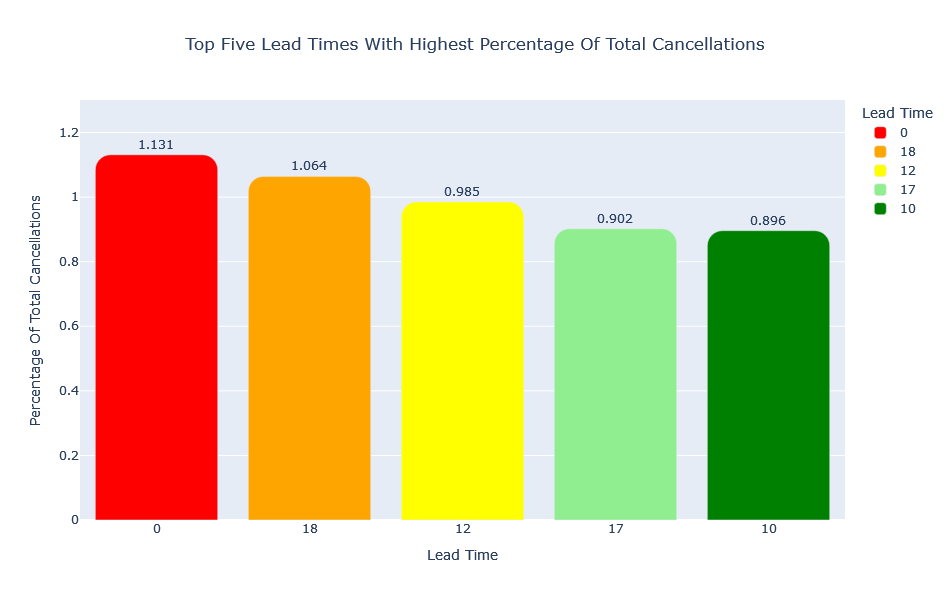

In [125]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_lead_times = pt_cancellations_with_lead_time.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_lead_times_df = pd.DataFrame({'Lead Time': top_lead_times.index, 'Percentage Of Total Cancellations': top_lead_times['percentage of total cancellations']})

fig = px.bar(top_lead_times_df, x='Lead Time', y='Percentage Of Total Cancellations',
             labels={'x':'Lead Time', 'y':'Percentage Of Total Cancellations'}, color='Lead Time',
             color_discrete_map=dict(zip(top_lead_times_df['Lead Time'], colors)),
             hover_data={'Lead Time': False}, text='Percentage Of Total Cancellations',
             title='Top Five Lead Times With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_lead_times_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the lead time of 0 days (1.131%), followed by 18 days (1.064%), 12 days (0.985%), 10 days (0.902%) & 17 days (0.896%) in descending order of frequency. Based on the bivariate analysis of cancellations by lead time, it's evident that a significant percentage of cancellations occur with 0 days of lead time, indicating last-minute changes in travel plans. Additionally, cancellations are notable at longer lead times, such as 18 days, 12 days, 10 days, and 17 days. To mitigate these issues, consider implementing flexible cancellation policies tailored to last-minute bookings, enhancing guest communication about cancellation policies, and offering incentives for early bookings to stabilize occupancy rates and revenue streams effectively.**

**Sensitivity Analysis**

**Making necessary preparations for running sensitivity analysis**

In [126]:
df_for_sa = df.copy()
df_for_sa.replace ({"is_canceled": {'no': 0, 'yes': 1}}, inplace = True)

x_for_sa = df_for_sa.drop ('is_canceled', axis =1)
y_for_sa = df_for_sa['is_canceled']

x_train_old_for_sa, x_test_for_sa, y_train_old_for_sa, y_test_for_sa = train_test_split(x_for_sa, y_for_sa, test_size=0.2, random_state=0)
x_train_for_sa, x_val_for_sa, y_train_for_sa, y_val_for_sa = train_test_split(x_train_old_for_sa, y_train_old_for_sa, test_size=0.2, random_state=0)

**Running sensitivity analysis**

In [127]:
xg1 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg1.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))
    indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time']=='0'],
                                         num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change, 'lead_time'] = '315'
    y_pred_test_for_sa = xg1.predict(modified_x_test_for_sa)
    print(f"Scenario: With {scenario}% Changes In Lead Time From 0 To 315 Days")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Lead Time From 0 To 315 Days
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Lead Time From 0 To 315 Days
Accuracy On Test Data: 98.85%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9855    0.9982    0.9918      8363
           1     0.9958    0.9663    0.9808      3647

    accuracy                         0.9885     12010
   macro avg     0.9906    0.9822    0.9863     12010
weighted avg     0.9886    0.9885    0.9885     12010

Scenario: With 50% Changes In Lead Time From 0 To 315 Days
Accuracy On Test Data: 98.85%
Classifi

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the lead times are relatively small. The model's response to changes in lead times may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between lead time and 
market segment, distribution channel, country, days in waiting list, agent, meal, arrival date year, arrival date month, arrival date week number, stays in weekend nights, stays in week nights, adults, arrival date day of month, reservation month, customer type, reservation year, reservation date, is repeated guest, total of special requests, deposit type, reserved room type,
booking changes, required car parking spaces, adr, assigned room type, previous cancellations, children, previous bookings not canceled, & hotel. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of column and it's not feasible to make a pivot table of them.**

**Running sensitivity analysis with modifications to the column lead time and the columns related with it**

In [128]:
xg2 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg2.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg2.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Lead Time And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Lead Time And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Lead Time And Interrelated Columns
Accuracy On Test Data: 88.02%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8809    0.9574    0.9175      8363
           1     0.8781    0.7030    0.7809      3647

    accuracy                         0.8802     12010
   macro avg     0.8795    0.8302    0.8492     12010
weighted avg     0.8800    0.8802    0.8760     12010

Scenario: With 50% Changes In Lead Time And Interrelated Columns
Accuracy On Test Dat

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between reservation month and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [129]:
pt_cancellations_with_reservation_month = df.groupby(['reservation_month', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_reservation_month['percentage of total cancellations'] = ((pt_cancellations_with_reservation_month['yes'] / pt_cancellations_with_reservation_month['yes'].sum()) * 100).round(0)
pt_cancellations_with_reservation_month['percentage of total confirmations'] = ((pt_cancellations_with_reservation_month['no'] / pt_cancellations_with_reservation_month['no'].sum()) * 100).round(0)
pt_cancellations_with_reservation_month.sort_values(by='percentage of total cancellations', ascending=False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
reservation_month,,,,
March,3044,2100,12.0,7.0
April,3876,1888,11.0,9.0
February,2253,1939,11.0,5.0
January,1887,1758,10.0,4.0
May,4281,1857,10.0,10.0


**Plotting The Top Five Reservation Months With Highest Percentage Of Total Cancellations**

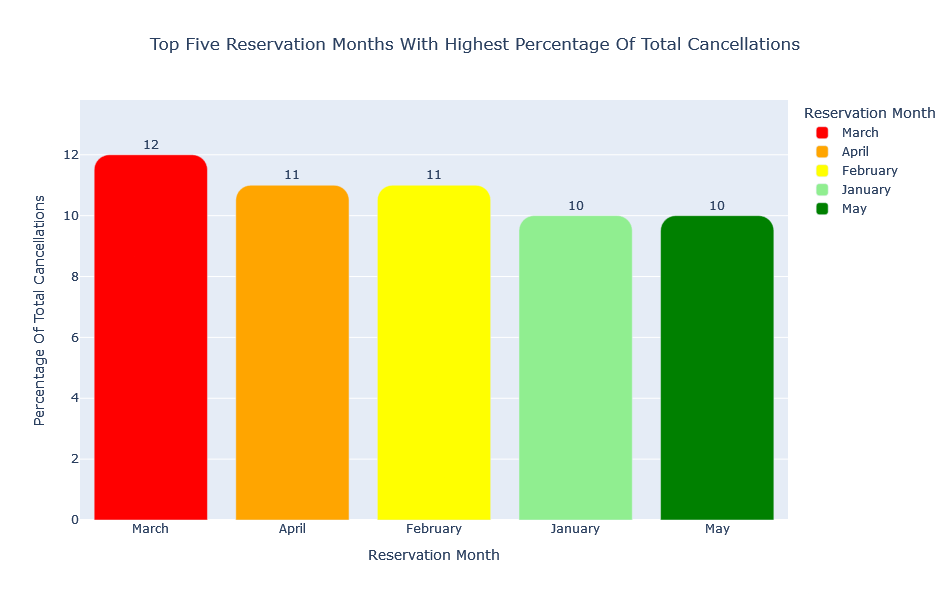

In [130]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_reservation_months = pt_cancellations_with_reservation_month.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_reservation_months_df = pd.DataFrame({'Reservation Month': top_reservation_months.index, 'Percentage Of Total Cancellations': top_reservation_months['percentage of total cancellations']})

fig = px.bar(top_reservation_months_df, x='Reservation Month', y='Percentage Of Total Cancellations',
         	labels={'x':'Reservation Month', 'y':'Percentage Of Total Cancellations'}, color='Reservation Month',
         	color_discrete_map=dict(zip(top_reservation_months_df['Reservation Month'], colors)),
         	hover_data={'Reservation Month': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Reservation Months With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_reservation_months_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are in the reservation month of March (12%), followed by April, February (11% each), and January, May (10% each), in descending order of frequency. However, it is important to note that the highest percentage of total confirmations are also in the reservation month of August (14%), followed closely by July (13%), and June, May, and September (10% each). This dual perspective reveals that while March experiences peak cancellations, August sees the highest number of confirmations. To optimize revenue and manage occupancy effectively, consider implementing flexible cancellation policies tailored for peak cancellation months like March. Simultaneously, capitalize on the high confirmation periods in August and July by enhancing marketing efforts and offering attractive promotions. Regularly monitor monthly booking trends to adjust strategies promptly and ensure alignment with changing demand patterns.**

**Sensitivity Analysis**

In [131]:
xg3 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg3.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month']=='August'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'reservation_month'] = 'December'
	y_pred_test_for_sa = xg3.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Reservation Month From August To December")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Reservation Month From August To December
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reservation Month From August To December
Accuracy On Test Data: 93.26%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9857    0.9164    0.9498      8363
           1     0.8349    0.9696    0.8972      3647

    accuracy                         0.9326     12010
   macro avg     0.9103    0.9430    0.9235     12010
weighted avg     0.9399    0.9326    0.9338     12010

Scenario: With 50% Changes In Reservation Month From August To December

**The results of sensitivity analysis show a considerable change when the reservation months are altered. This supports the observation made above that reservation month is in fact a determining factor in booking cancellations.**

**Bivariate analysis between total of special requests and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [132]:
pt_cancellations_with_total_of_special_requests = df.groupby (['total_of_special_requests', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_total_of_special_requests['percentage of total cancellations'] = ((pt_cancellations_with_total_of_special_requests['yes']/pt_cancellations_with_total_of_special_requests['yes'].sum())*100).round(0)
pt_cancellations_with_total_of_special_requests['percentage of total confirmations'] = ((pt_cancellations_with_total_of_special_requests['no']/pt_cancellations_with_total_of_special_requests['no'].sum())*100).round(0)
pt_cancellations_with_total_of_special_requests.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
total_of_special_requests,,,,
zero,17233,10476,59.0,41.0
one,16158,5108,29.0,38.0
two,7142,1945,11.0,17.0
three,1473,303,2.0,3.0
four,182,27,0.0,0.0


**Plotting The Top Three Number Of Special Requestss With Highest Percentage Of Total Cancellations**

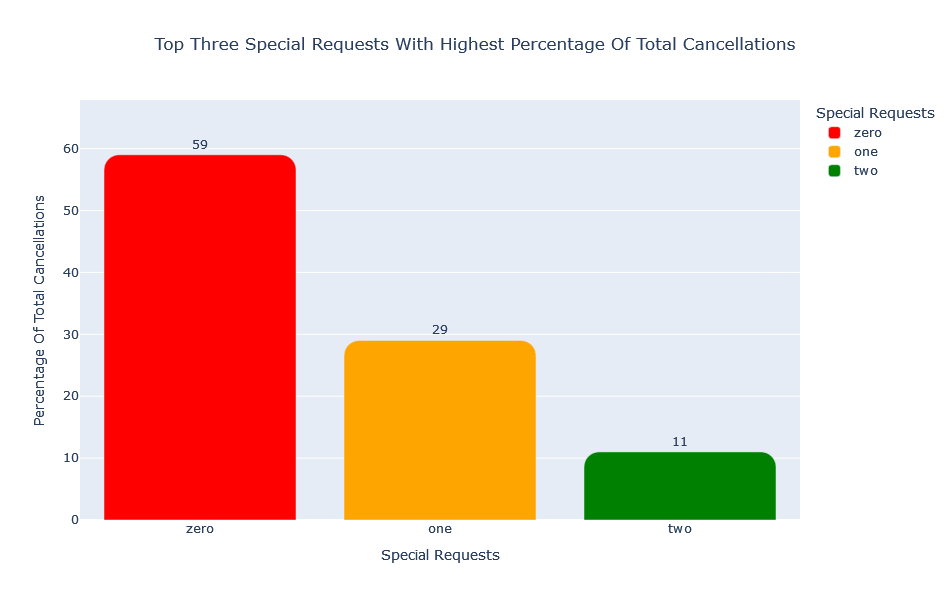

In [133]:
colors = ['red', 'orange', 'green']
top_total_of_special_requestss = pt_cancellations_with_total_of_special_requests.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_total_of_special_requestss_df = pd.DataFrame({'Special Requests': top_total_of_special_requestss.index, 'Percentage Of Total Cancellations': top_total_of_special_requestss['percentage of total cancellations']})

fig = px.bar(top_total_of_special_requestss_df, x='Special Requests', y='Percentage Of Total Cancellations',
         	labels={'x':'Special Requests', 'y':'Percentage Of Total Cancellations'}, color='Special Requests',
         	color_discrete_map=dict(zip(top_total_of_special_requestss_df['Special Requests'], colors)),
         	hover_data={'Special Requests': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Special Requests With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_total_of_special_requestss_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot indicates that the highest percentage of total cancellations are associated with 0 special requests (59%), followed by bookings with 1 special request (29%) and 2 special requests (11%), in descending order of frequency. Conversely, it is noteworthy that the highest percentage of total confirmations also corresponds to bookings with 0 special requests (41%), followed by those with 1 special request (38%) and 2 special requests (17%), in descending order of frequency. This data underscores the importance of special requests in guest satisfaction and booking reliability. To mitigate cancellations, consider enhancing communication about special request options during the booking process and ensuring that these requests are effectively managed. Moreover, capitalize on the high confirmation rates for bookings with 0 special requests by maintaining high service standards and leveraging positive guest experiences in marketing efforts.**

**Sensitivity Analysis**

In [134]:
xg4 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg4.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests']=='zero'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'total_of_special_requests'] = 'four'
	y_pred_test_for_sa = xg4.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Total Of Special Requests From Zero To Four")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Total Of Special Requests From Zero To Four
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Total Of Special Requests From Zero To Four
Accuracy On Test Data: 98.65%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9816    0.9994    0.9904      8363
           1     0.9986    0.9570    0.9773      3647

    accuracy                         0.9865     12010
   macro avg     0.9901    0.9782    0.9839     12010
weighted avg     0.9867    0.9865    0.9864     12010

Scenario: With 50% Changes In Total Of Special Requests From Zero T

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in total of special requests are relatively small. The model's response to changes in total of special requests may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between total_of_special_requests and market_segment, distribution_channel, agent, adults, babies, lead_time, customer_type, children, arrival_date_week_number, arrival_date_month, reserved_room_type, deposit_type, assigned_room_type, arrival_date_year, meal, country, stays_in_week_nights, required_car_parking_spaces, booking_changes, stays_in_weekend_nights, days_in_waiting_list, previous_bookings_not_canceled, arrival_date_day_of_month, is_repeated_guest, hotel, reservation_month, adr, & reservation_year. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of column and it's not feasible to make a pivot table of them.**

In [135]:
xg5 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg5.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'
    
    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg5.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Total Of Special Requests And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Total Of Special Requests And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Total Of Special Requests And Interrelated Columns
Accuracy On Test Data: 88.68%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8745    0.9778    0.9233      8363
           1     0.9301    0.6784    0.7845      3647

    accuracy                         0.8868     12010
   macro avg     0.9023    0.8281    0.8539     12010
weighted avg     0.8914    0.8868    0.8811     12010

Scenario: With 50% Changes In Total Of Special Reques

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between required car parking spaces and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [136]:
pt_cancellations_with_required_car_parking_spaces = df.groupby (['required_car_parking_spaces', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_required_car_parking_spaces['percentage of total cancellations'] = ((pt_cancellations_with_required_car_parking_spaces['yes']/pt_cancellations_with_required_car_parking_spaces['yes'].sum())*100).round(0)
pt_cancellations_with_required_car_parking_spaces['percentage of total confirmations'] = ((pt_cancellations_with_required_car_parking_spaces['no']/pt_cancellations_with_required_car_parking_spaces['no'].sum())*100).round(0)
pt_cancellations_with_required_car_parking_spaces.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
required_car_parking_spaces,,,,
zero,37556,17859,100.0,89.0
one,4632,0,0.0,11.0


**Plotting The Top Five Required Car Parking Spacess With Highest Percentage Of Total Cancellations**

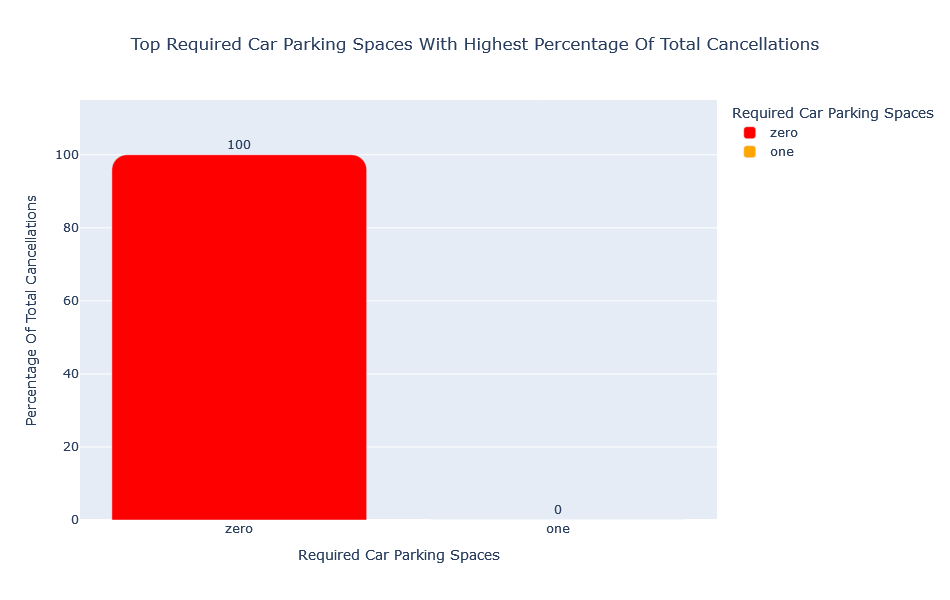

In [137]:
colors = ['red', 'orange']
top_required_car_parking_spacess = pt_cancellations_with_required_car_parking_spaces.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_required_car_parking_spacess_df = pd.DataFrame({'Required Car Parking Spaces': top_required_car_parking_spacess.index, 'Percentage Of Total Cancellations': top_required_car_parking_spacess['percentage of total cancellations']})

fig = px.bar(top_required_car_parking_spacess_df, x='Required Car Parking Spaces', y='Percentage Of Total Cancellations',
         	labels={'x':'Required Car Parking Spaces', 'y':'Percentage Of Total Cancellations'}, color='Required Car Parking Spaces',
         	color_discrete_map=dict(zip(top_required_car_parking_spacess_df['Required Car Parking Spaces'], colors)),
         	hover_data={'Required Car Parking Spaces': False}, text='Percentage Of Total Cancellations',
         	title='Top Required Car Parking Spaces With Highest Percentage Of Total Cancellations', width=950, height=600)
fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_required_car_parking_spacess_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot reveals that 100% of total cancellations are from guests who do not require any car parking spaces, whereas there are no cancellations from guests who require 1 car parking space. Conversely, it is notable that the highest percentage of total confirmations also originates from guests who do not require any car parking spaces (89%), followed by guests requiring 1 car parking space (11%). These findings underscore a significant correlation between car parking requirements and booking reliability. To reduce cancellations, consider enhancing communication and availability of parking options during the booking process. Furthermore, capitalize on the high confirmation rates for bookings with parking needs by ensuring adequate parking facilities and transparent communication about parking policies.**

**Sensitivity Analysis**

In [138]:
xg6 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg6.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces']=='zero'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'required_car_parking_spaces'] = 'one'
	y_pred_test_for_sa = xg6.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Required Car Parking Spaces From Zero To One")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Required Car Parking Spaces From Zero To One
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Required Car Parking Spaces From Zero To One
Accuracy On Test Data: 94.13%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9230    0.9990    0.9595      8363
           1     0.9973    0.8089    0.8933      3647

    accuracy                         0.9413     12010
   macro avg     0.9601    0.9040    0.9264     12010
weighted avg     0.9456    0.9413    0.9394     12010

Scenario: With 50% Changes In Required Car Parking Spaces From Ze

**The results of sensitivity analysis show a considerable change when the required car parking spaces are altered. This supports the observation made above that it is in fact a determining factor in booking cancellations.**

**Bivariate analysis between agent and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [139]:
pt_cancellations_with_agent = df.groupby (['agent', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_agent['percentage of total cancellations'] = ((pt_cancellations_with_agent['yes']/pt_cancellations_with_agent['yes'].sum())*100).round(0)
pt_cancellations_with_agent['percentage of total confirmations'] = ((pt_cancellations_with_agent['no']/pt_cancellations_with_agent['no'].sum())*100).round(0)
pt_cancellations_with_agent.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
agent,,,,
9,21348,11373,64.0,51.0
240,4625,3051,17.0,11.0
14,2522,514,3.0,6.0
250,1580,319,2.0,4.0
7,2152,335,2.0,5.0


**Plotting The Top Three Agents With Highest Percentage Of Total Cancellations**

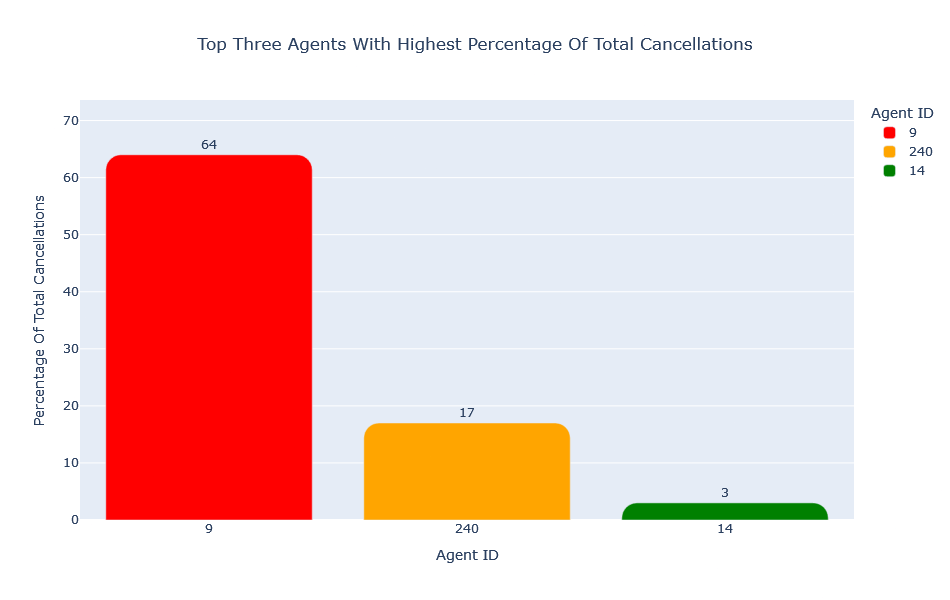

In [140]:
colors = ['red', 'orange', 'green']
top_agents = pt_cancellations_with_agent.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_agents_df = pd.DataFrame({'Agent ID': top_agents.index, 'Percentage Of Total Cancellations': top_agents['percentage of total cancellations']})

fig = px.bar(top_agents_df, x='Agent ID', y='Percentage Of Total Cancellations',
         	labels={'x':'Agent ID', 'y':'Percentage Of Total Cancellations'}, color='Agent ID',
         	color_discrete_map=dict(zip(top_agents_df['Agent ID'], colors)),
         	hover_data={'Agent ID': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Agents With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_agents_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot illustrates that the highest percentage of total cancellations originates from reservations made by agent ID 9 (64%), followed by ID 240 (17%), and ID 14 (3%), in descending order of frequency. Conversely, the highest percentage of total confirmations is observed with agent ID 9 (51%), followed by ID 240 (11%), and ID 14 (6%). While agent ID 9 shows significant influence in both cancellations and confirmations, it's crucial to consider the contributions of other agents. To optimize booking outcomes across all agents, explore strategies such as enhancing collaboration with top-performing agents, providing additional support and resources, and implementing performance metrics to foster a competitive yet cooperative booking environment.**

**Sensitivity Analysis**

In [141]:
xg7 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg7.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['agent']=='9'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'agent'] = '36'
	y_pred_test_for_sa = xg7.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Agent ID From 9 To 36")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Agent ID From 9 To 36
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Agent ID From 9 To 36
Accuracy On Test Data: 97.57%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9668    0.9994    0.9828      8363
           1     0.9985    0.9213    0.9584      3647

    accuracy                         0.9757     12010
   macro avg     0.9827    0.9604    0.9706     12010
weighted avg     0.9764    0.9757    0.9754     12010

Scenario: With 50% Changes In Agent ID From 9 To 36
Accuracy On Test Data: 96.89%
Classification Report Of Test

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the agent IDs are relatively small. The model's response to changes in agent IDs may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between agent and market_segment, arrival_date_week_number, distribution_channel, arrival_date_month, arrival_date_day_of_month, stays_in_week_nights, country, stays_in_weekend_nights, meal, adults, booking_changes, lead_time, deposit_type, hotel, assigned_room_type, reserved_room_type, arrival_date_year, children, babies, previous_cancellations, is_repeated_guest, required_car_parking_spaces, total_of_special_requests, days_in_waiting_list, customer_type, reservation_year, reservation_date, adr, reservation_month. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [142]:
xg8 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg8.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg8.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Agent And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Agent And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Agent And Interrelated Columns
Accuracy On Test Data: 88.84%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8896    0.9587    0.9229      8363
           1     0.8849    0.7272    0.7983      3647

    accuracy                         0.8884     12010
   macro avg     0.8872    0.8430    0.8606     12010
weighted avg     0.8882    0.8884    0.8851     12010

Scenario: With 50% Changes In Agent And Interrelated Columns
Accuracy On Test Data: 85.34%
Cl

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between market segment and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [143]:
pt_cancellations_with_market_segment = df.groupby (['market_segment', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_market_segment['percentage of total cancellations'] = ((pt_cancellations_with_market_segment['yes']/pt_cancellations_with_market_segment['yes'].sum())*100).round(0)
pt_cancellations_with_market_segment['percentage of total confirmations'] = ((pt_cancellations_with_market_segment['no']/pt_cancellations_with_market_segment['no'].sum())*100).round(0)
pt_cancellations_with_market_segment.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
market_segment,,,,
Online TA,26468,14884,83.0,63.0
Direct,7195,1273,7.0,17.0
Offline TA/TO,6078,1062,6.0,14.0
Groups,1234,376,2.0,3.0
Corporate,1065,230,1.0,3.0


**Plotting The Top Three Market Segments With Highest Percentage Of Total Cancellations**

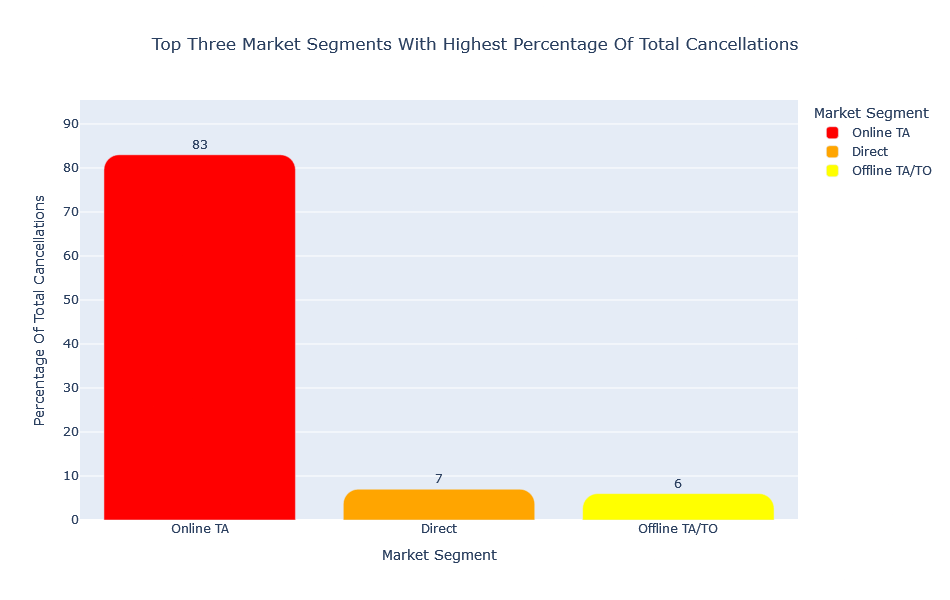

In [144]:
colors = ['red', 'orange', 'yellow']
top_market_segments = pt_cancellations_with_market_segment.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_market_segments_df = pd.DataFrame({'Market Segment': top_market_segments.index, 'Percentage Of Total Cancellations': top_market_segments['percentage of total cancellations']})

fig = px.bar(top_market_segments_df, x='Market Segment', y='Percentage Of Total Cancellations',
         	labels={'x':'Market Segment', 'y':'Percentage Of Total Cancellations'}, color='Market Segment',
         	color_discrete_map=dict(zip(top_market_segments_df['Market Segment'], colors)),
         	hover_data={'Market Segment': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Market Segments With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_market_segments_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot indicates that the highest percentage of total cancellations originates from reservations made by the market segment Online TA (83%), followed by Direct bookings (7%), and Offline TA/TO (6%), in descending order of frequency. Conversely, the highest percentage of total confirmations also comes from reservations made by Online TA (63%), with Direct bookings accounting for 17%, and Offline TA/TO at 14%. This disparity suggests Online TA has a substantial impact on both cancellations and confirmations, highlighting the segment's volatility. To mitigate cancellations, consider strategies like improving online booking experiences, enhancing customer support for online channels, and implementing flexible cancellation policies. Additionally, focus on nurturing Direct booking relationships and optimizing Offline TA/TO partnerships to diversify and stabilize booking sources effectively.**

**Sensitivity Analysis**

In [145]:
xg9 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg9.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment']=='Online TA'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'market_segment'] = 'Aviation'
	y_pred_test_for_sa = xg9.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Market Segment From Online TA To Aviation")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Market Segment From Online TA To Aviation
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Market Segment From Online TA To Aviation
Accuracy On Test Data: 98.83%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9842    0.9992    0.9916      8363
           1     0.9980    0.9633    0.9803      3647

    accuracy                         0.9883     12010
   macro avg     0.9911    0.9812    0.9860     12010
weighted avg     0.9884    0.9883    0.9882     12010

Scenario: With 50% Changes In Market Segment From Online TA To Aviation

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the market segment are relatively small. The model's response to changes in market segment may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between market_segment and arrival_date_week_number, stays_in_week_nights, adults, meal, stays_in_weekend_nights, country, lead_time, hotel, arrival_date_month, arrival_date_year, children, arrival_date_day_of_month, babies, customer_type, agent, deposit_type, total_of_special_requests, booking_changes, assigned_room_type, reserved_room_type, previous_bookings_not_canceled, is_repeated_guest, distribution_channel, adr, reservation_month, required_car_parking_spaces, reservation_year, days_in_waiting_list, reservation_date, previous_cancellations. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [146]:
xg10 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg10.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg10.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Market Segment And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Market Segment And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Market Segment And Interrelated Columns
Accuracy On Test Data: 88.55%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8848    0.9607    0.9212      8363
           1     0.8877    0.7132    0.7909      3647

    accuracy                         0.8855     12010
   macro avg     0.8863    0.8369    0.8561     12010
weighted avg     0.8857    0.8855    0.8816     12010

Scenario: With 50% Changes In Market Segment And Interrelated Columns
Accur

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between country and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [147]:
pt_cancellations_with_country = df.groupby (['country', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_country['percentage of total cancellations'] = ((pt_cancellations_with_country['yes']/pt_cancellations_with_country['yes'].sum())*100).round(0)
pt_cancellations_with_country['percentage of total confirmations'] = ((pt_cancellations_with_country['no']/pt_cancellations_with_country['no'].sum())*100).round(0)
pt_cancellations_with_country.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
country,,,,
Portugal,9352,5902,33.0,22.0
France,5670,1589,9.0,13.0
United Kingdom,4949,1586,9.0,12.0
Spain,3798,1560,9.0,9.0
Italy,1633,986,6.0,4.0


**Plotting The Top Five Countries With Highest Percentage Of Total Cancellations**

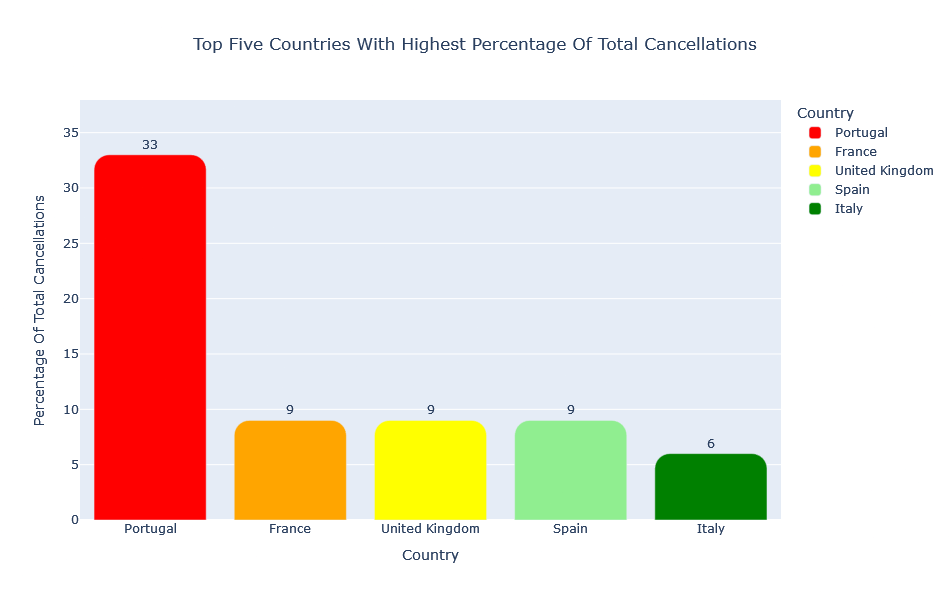

In [148]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_Country = pt_cancellations_with_country.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_Country_df = pd.DataFrame({'Country': top_Country.index, 'Percentage Of Total Cancellations': top_Country['percentage of total cancellations']})

fig = px.bar(top_Country_df, x='Country', y='Percentage Of Total Cancellations',
         	labels={'x':'Country', 'y':'Percentage Of Total Cancellations'}, color='Country',
         	color_discrete_map=dict(zip(top_Country_df['Country'], colors)),
         	hover_data={'Country': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Countries With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_Country_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from Portugal (33%), followed by France, UK, & Spain (each at 9%) & Italy (6%), in descending order of frequency. However, it should also be noted that the highest percentage of total confirmations are also mostly from these countries with the only exception being Germany i.e. Portugal (22%), followed by France (13%), UK (12%), Spain (9%) & Germany (8%). This highlights significant trends that necessitate tailored strategies for optimizing hotel occupancy and revenue. Portugal emerges as the leader in both cancellations (33%) and confirmations (22%), underscoring its pivotal role in the hotel's booking dynamics. Similarly, France, the UK, Spain, and Italy also show notable percentages in both cancellations and confirmations, indicating their substantial impact on booking volumes. To address these findings effectively, it is crucial to implement targeted communication strategies that address the specific needs and behaviors of guests from these countries. This includes offering flexible booking policies, personalized marketing campaigns highlighting local attractions, and enhancing guest engagement through tailored offers. Moreover, diversifying market reach to include growth opportunities in countries like Germany can further stabilize occupancy rates and revenue streams. Continuous monitoring of booking trends by country will be essential for adapting strategies in real-time, ensuring optimal performance and guest satisfaction across diverse international markets.**

**Sensitivity Analysis**

In [149]:
xg11 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg11.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['country']=='Portugal'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'country'] = 'Latvia'
	y_pred_test_for_sa = xg11.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Country From Portugal To Latvia")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Country From Portugal To Latvia
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Country From Portugal To Latvia
Accuracy On Test Data: 97.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9712    0.9992    0.9850      8363
           1     0.9979    0.9320    0.9638      3647

    accuracy                         0.9788     12010
   macro avg     0.9846    0.9656    0.9744     12010
weighted avg     0.9793    0.9788    0.9786     12010

Scenario: With 50% Changes In Country From Portugal To Latvia
Accuracy On Test Data: 97.48%

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in country are relatively small. The model's response to changes in country may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between total_of_special_requests and market_segment, distribution_channel, agent, adults, babies, lead_time, customer_type, children, arrival_date_week_number, arrival_date_month, reserved_room_type, deposit_type, assigned_room_type, arrival_date_year, meal, country, stays_in_week_nights, required_car_parking_spaces, booking_changes, stays_in_weekend_nights, days_in_waiting_list, previous_bookings_not_canceled, arrival_date_day_of_month, is_repeated_guest, hotel, reservation_month, adr, & reservation_year. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [150]:
xg12 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg12.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg12.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Country And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Country And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Country And Interrelated Columns
Accuracy On Test Data: 88.55%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8829    0.9633    0.9214      8363
           1     0.8936    0.7072    0.7895      3647

    accuracy                         0.8855     12010
   macro avg     0.8883    0.8352    0.8555     12010
weighted avg     0.8862    0.8855    0.8813     12010

Scenario: With 50% Changes In Country And Interrelated Columns
Accuracy On Test Data: 84.

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

In [151]:
pt_cancellations_with_previous_cancellations = df.groupby (['previous_cancellations', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_previous_cancellations['percentage of total cancellations'] = ((pt_cancellations_with_previous_cancellations['yes']/pt_cancellations_with_previous_cancellations['yes'].sum())*100).round(0)
pt_cancellations_with_previous_cancellations['percentage of total confirmations'] = ((pt_cancellations_with_previous_cancellations['no']/pt_cancellations_with_previous_cancellations['no'].sum())*100).round(0)
pt_cancellations_with_previous_cancellations.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
previous_cancellations,,,,
zero,42151,17287,97.0,100.0
one,37,572,3.0,0.0


**Plotting The Top Previous Cancellations With Highest Percentage Of Total Cancellations**

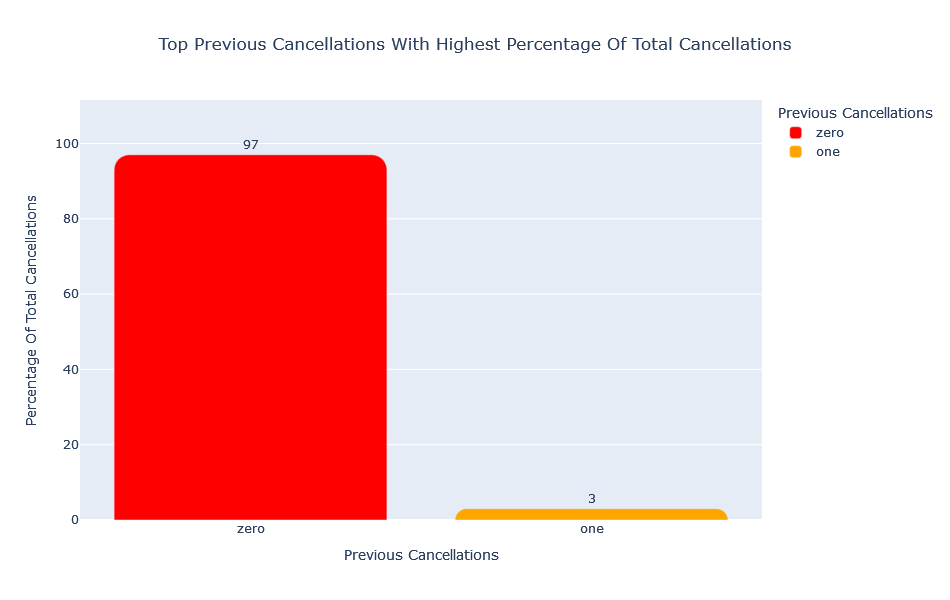

In [152]:
colors = colors = ['red', 'orange']
top_previous_cancellations = pt_cancellations_with_previous_cancellations.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_previous_cancellations_df = pd.DataFrame({'Previous Cancellations': top_previous_cancellations.index, 'Percentage Of Total Cancellations': top_previous_cancellations['percentage of total cancellations']})

fig = px.bar(top_previous_cancellations_df, x='Previous Cancellations', y='Percentage Of Total Cancellations',
         	labels={'x':'Previous Cancellations', 'y':'Percentage Of Total Cancellations'}, color='Previous Cancellations',
         	color_discrete_map=dict(zip(top_previous_cancellations_df['Previous Cancellations'], colors)),
         	hover_data={'Previous Cancellations': False}, text='Percentage Of Total Cancellations',
         	title='Top Previous Cancellations With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_previous_cancellations_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations is with 0 previous cancellations (97%), followed by 1 previous cancellation (3%), in descending order of frequency. It is noteworthy that 100% of the total confirmations also originate from guests with 0 previous cancellations, with no confirmations from guests with 1 previous cancellation. This stark contrast underscores a significant propensity for first-time cancellations. Conversely, all confirmations come from guests with no prior history of cancellations, highlighting their crucial role in successful bookings. To mitigate initial cancellations, strategies could focus on gathering feedback from guests who cancel, understanding and addressing the reasons behind these occurrences, including transparent cancellation policies and proactive guest communication. Additionally, leveraging insights from confirmed bookings to refine targeting strategies and enhance guest retention efforts can further bolster booking success and operational efficiency.**

**Sensitivity Analysis**

In [153]:
xg13 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg13.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]
for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations']=='zero'],
                                     	num, replace=True)
	modified_x_test_for_sa.loc[indices_to_change, 'previous_cancellations'] = 'one'
	y_pred_test_for_sa = xg13.predict(modified_x_test_for_sa)
	print(f"Scenario: With {scenario}% Changes In Previous Cancellations From Zero To One")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Previous Cancellations From Zero To One
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Previous Cancellations From Zero To One
Accuracy On Test Data: 98.66%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9875    0.9933    0.9904      8363
           1     0.9844    0.9712    0.9778      3647

    accuracy                         0.9866     12010
   macro avg     0.9860    0.9823    0.9841     12010
weighted avg     0.9866    0.9866    0.9866     12010

Scenario: With 50% Changes In Previous Cancellations From Zero To One
Accur

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in previous cancellations are relatively small. The model's response to changes in previous cancellations may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between previous_cancellations and arrival_date_year, country, is_repeated_guest, arrival_date_month, arrival_date_week_number, lead_time, meal, market_segment, stays_in_week_nights, distribution_channel, adults, arrival_date_day_of_month, children, stays_in_weekend_nights, reservation_year, customer_type, previous_bookings_not_canceled, reservation_month, deposit_type, agent, adr, reserved_room_type, required_car_parking_spaces, assigned_room_type, booking_changes, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [154]:
xg14 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg14.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg14.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Previous Cancellations And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Previous Cancellations And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Previous Cancellations And Interrelated Columns
Accuracy On Test Data: 88.36%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8839    0.9587    0.9198      8363
           1     0.8826    0.7113    0.7877      3647

    accuracy                         0.8836     12010
   macro avg     0.8833    0.8350    0.8538     12010
weighted avg     0.8835    0.8836    0.8797     12010

Scenario: With 50% Changes In Previous Cancellations And In

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between distribution channel and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [155]:
pt_cancellations_with_distribution_channel = df.groupby (['distribution_channel', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_distribution_channel['percentage of total cancellations'] = ((pt_cancellations_with_distribution_channel['yes']/pt_cancellations_with_distribution_channel['yes'].sum())*100).round(0)
pt_cancellations_with_distribution_channel['percentage of total confirmations'] = ((pt_cancellations_with_distribution_channel['no']/pt_cancellations_with_distribution_channel['no'].sum())*100).round(0)
pt_cancellations_with_distribution_channel.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
distribution_channel,,,,
TA/TO,33413,16228,91.0,79.0
Direct,7295,1309,7.0,17.0
Corporate,1344,291,2.0,3.0
GDS,136,31,0.0,0.0


**Plotting The Top Five Distribution Channels With Highest Percentage Of Total Cancellations**

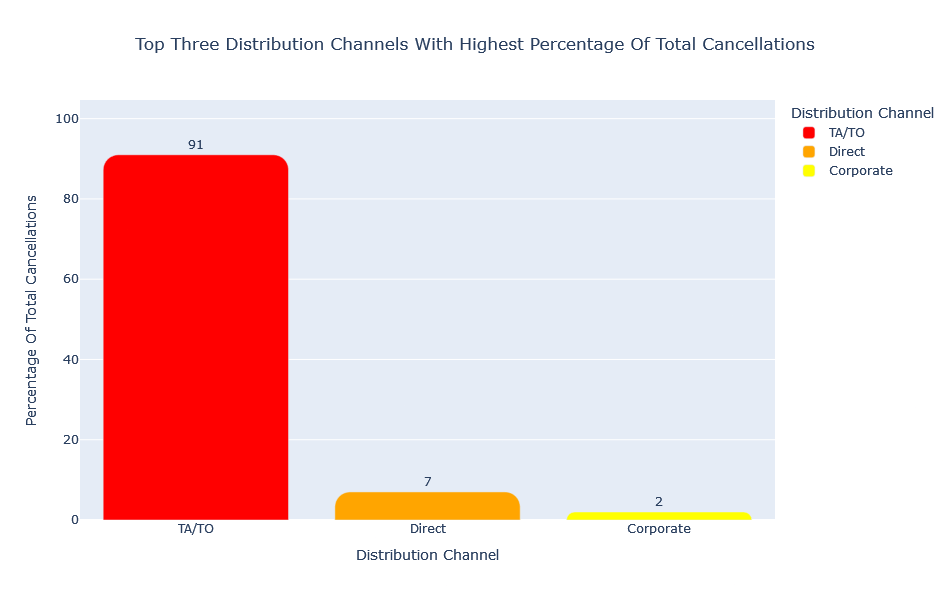

In [156]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_distribution_channels = pt_cancellations_with_distribution_channel.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_distribution_channels_df = pd.DataFrame({'Distribution Channel': top_distribution_channels.index, 'Percentage Of Total Cancellations': top_distribution_channels['percentage of total cancellations']})

fig = px.bar(top_distribution_channels_df, x='Distribution Channel', y='Percentage Of Total Cancellations',
         	labels={'x':'Distribution Channel', 'y':'Percentage Of Total Cancellations'}, color='Distribution Channel',
         	color_discrete_map=dict(zip(top_distribution_channels_df['Distribution Channel'], colors)),
         	hover_data={'Distribution Channel': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Distribution Channels With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_distribution_channels_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot illustrates that the highest percentage of total cancellations originates from reservations made through the distribution channel TA/TO (91%), followed by Direct bookings (7%), and Corporate channels (2%). Conversely, the highest percentage of total confirmations also derives from TA/TO reservations (79%), with Direct bookings accounting for 17%, and Corporate channels for 3%. This disparity highlights the dominance of TA/TO in both cancellations and confirmations. To optimize booking management, it is crucial to enhance monitoring and policies specific to TA/TO bookings, potentially including stricter confirmation procedures or tailored incentives for direct bookings. Additionally, fostering stronger relationships with corporate clients could mitigate cancellations and enhance booking stability through personalized service offerings.**

**Sensitivity Analysis**

In [157]:
xg15 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg15.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
    
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel']=='TA/TO'],
                                     	num, replace=True)
    
	modified_x_test_for_sa.loc[indices_to_change, 'distribution_channel'] = 'GDS'
	y_pred_test_for_sa = xg15.predict(modified_x_test_for_sa)
    
	print(f"Scenario: With {scenario}% Changes In Distribution Channel From TA/TO To GDS")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Distribution Channel From TA/TO To GDS
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Distribution Channel From TA/TO To GDS
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Distribution Channel From TA/TO To GDS
Accuracy

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in distribution channel are relatively small. The model's response to changes in distribution channel may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between distribution_channel & market_segment, adults, country, meal, lead_time, hotel, stays_in_week_nights, arrival_date_week_number, stays_in_weekend_nights, arrival_date_month, children, arrival_date_year, arrival_date_day_of_month, babies, is_repeated_guest, total_of_special_requests, agent, reserved_room_type, previous_bookings_not_canceled, assigned_room_type, customer_type, required_car_parking_spaces, booking_changes, adr, reservation_month, reservation_year, deposit_type, reservation_date, previous_cancellations, days_in_waiting_list. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [158]:
xg16 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg16.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg16.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Distribution Channel And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Distribution Channel And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Distribution Channel And Interrelated Columns
Accuracy On Test Data: 88.42%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8824    0.9619    0.9204      8363
           1     0.8898    0.7061    0.7873      3647

    accuracy                         0.8842     12010
   macro avg     0.8861    0.8340    0.8539     12010
weighted avg     0.8846    0.8842    0.8800     12010

Scenario: With 50% Changes In Distribution Channel And Interrel

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between customer type and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [159]:
pt_cancellations_with_customer_type = df.groupby (['customer_type', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_customer_type['percentage of total cancellations'] = ((pt_cancellations_with_customer_type['yes']/pt_cancellations_with_customer_type['yes'].sum())*100).round(0)
pt_cancellations_with_customer_type['percentage of total confirmations'] = ((pt_cancellations_with_customer_type['no']/pt_cancellations_with_customer_type['no'].sum())*100).round(0)
pt_cancellations_with_customer_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
customer_type,,,,
Transient,35141,16627,93.0,83.0
Transient-Party,5079,832,5.0,12.0
Contract,1727,375,2.0,4.0
Group,241,25,0.0,1.0


**Plotting The Top Three Customer Types With Highest Percentage Of Total Cancellations**

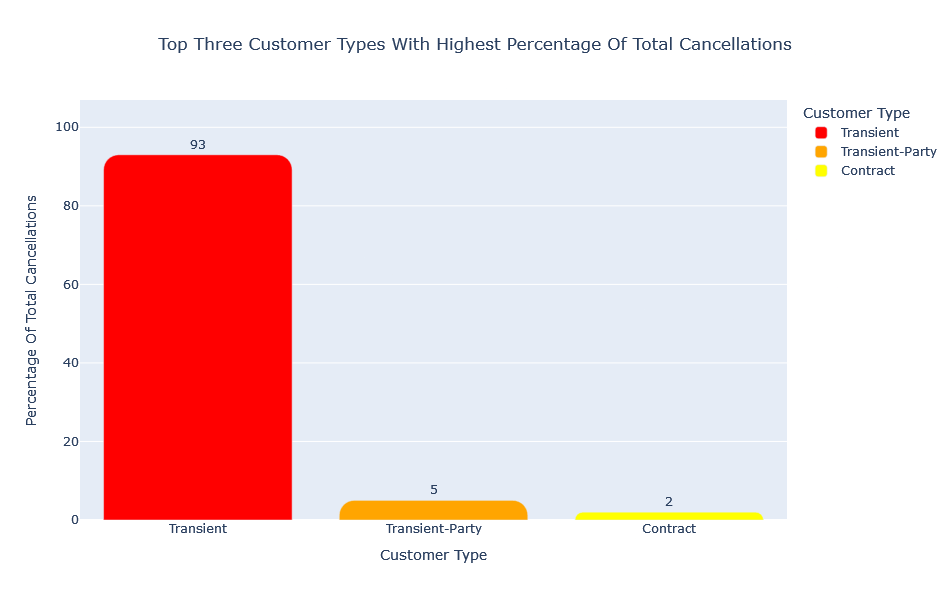

In [160]:
colors = ['red', 'orange', 'yellow']
top_customer_types = pt_cancellations_with_customer_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_customer_types_df = pd.DataFrame({'Customer Type': top_customer_types.index, 'Percentage Of Total Cancellations': top_customer_types['percentage of total cancellations']})

fig = px.bar(top_customer_types_df, x='Customer Type', y='Percentage Of Total Cancellations',
         	labels={'x':'Customer Type', 'y':'Percentage Of Total Cancellations'}, color='Customer Type',
         	color_discrete_map=dict(zip(top_customer_types_df['Customer Type'], colors)),
         	hover_data={'Customer Type': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Customer Types With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_customer_types_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot reveals that the highest percentage of total cancellations originates from reservations made by the customer type Transient (93%), followed by Transient-Party (5%), and Contract (2%). Conversely, the highest percentage of total confirmations also comes from Transient bookings (83%), with Transient-Party accounting for 12%, and Contract bookings for 4%. This disparity underscores the dominance of Transient bookings in both cancellations and confirmations. To mitigate cancellations and enhance booking stability, strategies could include offering flexible booking options tailored to Transient guests, improving communication of cancellation policies, and incentivizing direct bookings. Additionally, strengthening relationships with Transient-Party and Contract customers through personalized services and exclusive offers could help stabilize bookings and increase overall satisfaction.**

**Sensitivity Analysis**

In [161]:
xg17 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg17.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
    
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type']=='Transient'],
                                     	num, replace=True)
    
	modified_x_test_for_sa.loc[indices_to_change, 'customer_type'] = 'Group'
	y_pred_test_for_sa = xg17.predict(modified_x_test_for_sa)
    
	print(f"Scenario: With {scenario}% Changes In Customer Type From Transient To Group")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Customer Type From Transient To Group
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Customer Type From Transient To Group
Accuracy On Test Data: 98.57%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9803    0.9995    0.9898      8363
           1     0.9989    0.9539    0.9759      3647

    accuracy                         0.9857     12010
   macro avg     0.9896    0.9767    0.9828     12010
weighted avg     0.9859    0.9857    0.9856     12010

Scenario: With 50% Changes In Customer Type From Transient To Group
Accuracy On

**The results of sensitivity analysis show a considerable change when the customer type is altered. This supports the observation made above that customer type is in fact a determining factor in booking cancellations.**

**The results of statistical tests between independent features show that there is a strong relationship between customer_type & market_segment, arrival_date_week_number, arrival_date_month, stays_in_week_nights, adults, agent, booking_changes, arrival_date_year, distribution_channel, lead_time, meal, reserved_room_type, country, assigned_room_type, previous_cancellations, previous_bookings_not_canceled, stays_in_weekend_nights, is_repeated_guest, days_in_waiting_list, children, deposit_type, arrival_date_day_of_month, hotel, reservation_year, reservation_month, adr, total_of_special_requests, reservation_date, required_car_parking_spaces. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [162]:
xg18 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg18.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg18.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Customer Type And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Customer Type And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Customer Type And Interrelated Columns
Accuracy On Test Data: 88.35%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8845    0.9578    0.9197      8363
           1     0.8805    0.7132    0.7881      3647

    accuracy                         0.8835     12010
   macro avg     0.8825    0.8355    0.8539     12010
weighted avg     0.8833    0.8835    0.8797     12010

Scenario: With 50% Changes In Customer Type And Interrelated Columns
Accuracy

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between booking changes and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [163]:
pt_cancellations_with_booking_changes = df.groupby (['booking_changes', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_booking_changes['percentage of total cancellations'] = ((pt_cancellations_with_booking_changes['yes']/pt_cancellations_with_booking_changes['yes'].sum())*100).round(0)
pt_cancellations_with_booking_changes['percentage of total confirmations'] = ((pt_cancellations_with_booking_changes['no']/pt_cancellations_with_booking_changes['no'].sum())*100).round(0)
pt_cancellations_with_booking_changes.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
booking_changes,,,,
zero,33986,16153,90.0,81.0
one,5770,1004,6.0,14.0
two,1771,537,3.0,4.0
three,442,103,1.0,1.0
five,53,17,0.0,0.0


**Plotting The Top Three Booking Changes With Highest Percentage Of Total Cancellations**

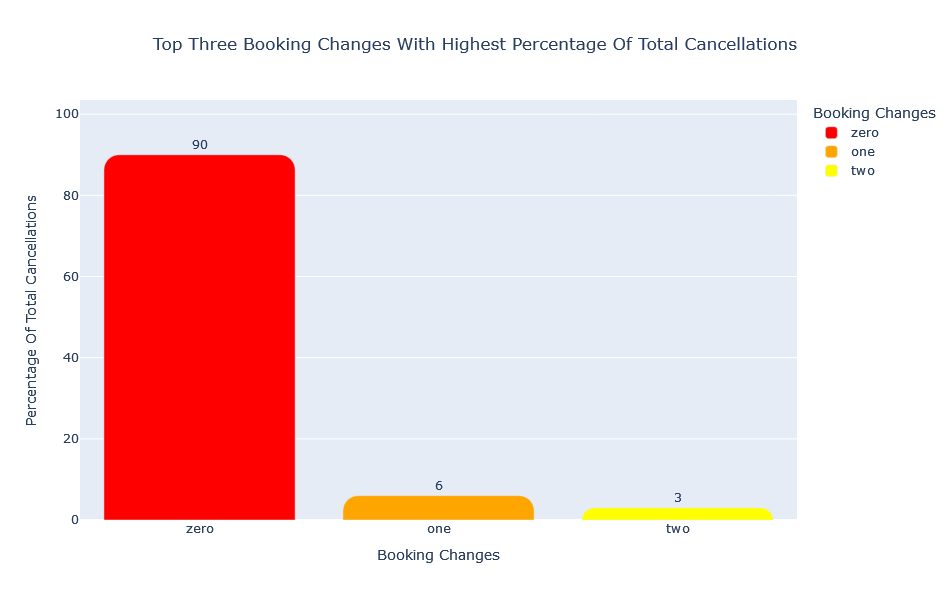

In [164]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_booking_changess = pt_cancellations_with_booking_changes.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_booking_changess_df = pd.DataFrame({'Booking Changes': top_booking_changess.index, 'Percentage Of Total Cancellations': top_booking_changess['percentage of total cancellations']})

fig = px.bar(top_booking_changess_df, x='Booking Changes', y='Percentage Of Total Cancellations',
         	labels={'x':'Booking Changes', 'y':'Percentage Of Total Cancellations'}, color='Booking Changes',
         	color_discrete_map=dict(zip(top_booking_changess_df['Booking Changes'], colors)),
         	hover_data={'Booking Changes': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Booking Changes With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_booking_changess_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot reveals that the highest percentage of total cancellations occurs with zero booking changes (90%), followed by one booking change (6%), and two booking changes (3%). Similarly, the highest percentage of total confirmations is also associated with zero booking changes (81%), followed by one booking change (14%), and two booking changes (4%). This consistency underscores the importance of booking stability in minimizing cancellations and optimizing confirmation rates. To mitigate cancellations, it's crucial to streamline the booking change process by implementing clear policies and user-friendly interfaces. Proactive communication with guests regarding booking changes can also enhance transparency and trust. Moreover, improving operational efficiency to swiftly accommodate booking changes can significantly impact guest satisfaction and reduce cancellation rates. Regular monitoring of booking change patterns and guest feedback can provide valuable insights for continuous improvement.**

**Sensitivity Analysis**

In [165]:
xg19 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg19.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))
    
	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes']=='zero'],
                                     	num, replace=True)
    
	modified_x_test_for_sa.loc[indices_to_change, 'booking_changes'] = 'five'
	y_pred_test_for_sa = xg19.predict(modified_x_test_for_sa)
    
	print(f"Scenario: With {scenario}% Changes In Booking Changes From Zero To Five")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Booking Changes From Zero To Five
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Booking Changes From Zero To Five
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9849    0.9992    0.9920      8363
           1     0.9980    0.9649    0.9812      3647

    accuracy                         0.9888     12010
   macro avg     0.9915    0.9820    0.9866     12010
weighted avg     0.9889    0.9888    0.9887     12010

Scenario: With 50% Changes In Booking Changes From Zero To Five
Accuracy On Test Data: 

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in booking changes are relatively small. The model's response to changes in booking changes may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between booking_changes and booking_changes, market_segment, meal, babies, distribution_channel, assigned_room_type, reserved_room_type, adults, lead_time, children, hotel, stays_in_week_nights, arrival_date_week_number, country, arrival_date_year, arrival_date_month, is_repeated_guest, arrival_date_day_of_month, previous_bookings_not_canceled, stays_in_weekend_nights, previous_cancellations, agent, customer_type, days_in_waiting_list, required_car_parking_spaces, total_of_special_requests, reservation_year, reservation_month, adr, reservation_date, deposit_type|. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [166]:
xg20 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg20.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg20.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Booking Changes And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Booking Changes And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Booking Changes And Interrelated Columns
Accuracy On Test Data: 88.38%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8832    0.9602    0.9201      8363
           1     0.8859    0.7088    0.7875      3647

    accuracy                         0.8838     12010
   macro avg     0.8845    0.8345    0.8538     12010
weighted avg     0.8840    0.8838    0.8798     12010

Scenario: With 50% Changes In Booking Changes And Interrelated Columns
Ac

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between deposit types and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [167]:
pt_cancellations_with_deposit_type = df.groupby (['deposit_type', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_deposit_type['percentage of total cancellations'] = ((pt_cancellations_with_deposit_type['yes']/pt_cancellations_with_deposit_type['yes'].sum())*100).round(0)
pt_cancellations_with_deposit_type['percentage of total confirmations'] = ((pt_cancellations_with_deposit_type['no']/pt_cancellations_with_deposit_type['no'].sum())*100).round(0)
pt_cancellations_with_deposit_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
deposit_type,,,,
No Deposit,42143,17572,98.0,100.0
Non Refund,21,270,2.0,0.0
Refundable,24,17,0.0,0.0


**Plotting The Top Five Deposit Types With Highest Percentage Of Total Cancellations**

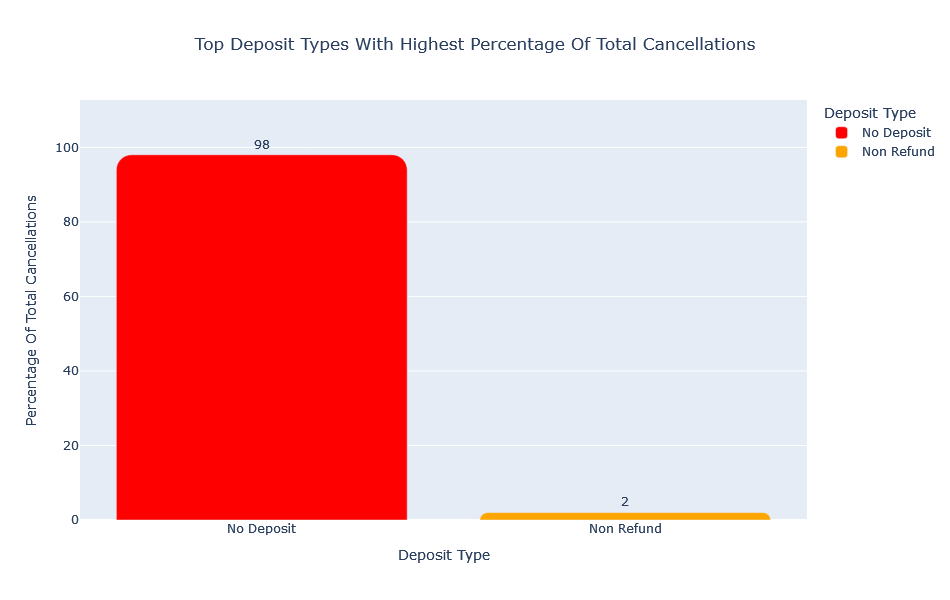

In [168]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_deposit_types = pt_cancellations_with_deposit_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(2)
top_deposit_types_df = pd.DataFrame({'Deposit Type': top_deposit_types.index, 'Percentage Of Total Cancellations': top_deposit_types['percentage of total cancellations']})

fig = px.bar(top_deposit_types_df, x='Deposit Type', y='Percentage Of Total Cancellations',
         	labels={'x':'Deposit Type', 'y':'Percentage Of Total Cancellations'}, color='Deposit Type',
         	color_discrete_map=dict(zip(top_deposit_types_df['Deposit Type'], colors)),
         	hover_data={'Deposit Type': False}, text='Percentage Of Total Cancellations',
         	title='Top Deposit Types With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_deposit_types_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot illustrates that the highest percentage of total cancellations originates from reservations made with no deposit (98%), followed by those with a non-refundable deposit (2%). Notably, all confirmations (100%) are derived from reservations made with no deposit, while there are no confirmations associated with non-refundable deposits. This stark contrast highlights the influence of deposit policies on booking behaviors, where reservations without financial commitments are more susceptible to cancellations. To address this, implementing flexible deposit policies that balance guest flexibility with revenue protection is essential. Providing incentives for guests to opt for refundable deposit options and enhancing transparency in deposit terms can mitigate cancellations and bolster confirmation rates. Regularly reviewing deposit policies in line with market dynamics and guest preferences can optimize revenue management strategies effectively.**

**Sensitivity Analysis**

In [169]:
xg21 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg21.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type']=='No Deposit'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'deposit_type'] = 'Refundable'
	y_pred_test_for_sa = xg21.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Deposit Type From No Deposit To Refundable")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Deposit Type From No Deposit To Refundable
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Deposit Type From No Deposit To Refundable
Accuracy On Test Data: 99.02%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9875    0.9986    0.9930      8363
           1     0.9966    0.9709    0.9836      3647

    accuracy                         0.9902     12010
   macro avg     0.9920    0.9848    0.9883     12010
weighted avg     0.9902    0.9902    0.9901     12010

Scenario: With 50% Changes In Deposit Type From No Deposit To Refunda

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the deposit type are relatively small. The model's response to changes in deposit type may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between deposit_type & market_segment, lead_time, country, previous_cancellations, arrival_date_week_number, assigned_room_type, distribution_channel, arrival_date_month, adults, reserved_room_type, meal, hotel, arrival_date_day_of_month, stays_in_week_nights, arrival_date_year, children, booking_changes, stays_in_weekend_nights, agent, total_of_special_requests, customer_type, reservation_month, reservation_date, required_car_parking_spaces, reservation_year, adr. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [170]:
xg22 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg22.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg22.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Deposit Type And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Deposit Type And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Deposit Type And Interrelated Columns
Accuracy On Test Data: 88.23%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8835    0.9573    0.9189      8363
           1     0.8789    0.7104    0.7857      3647

    accuracy                         0.8823     12010
   macro avg     0.8812    0.8339    0.8523     12010
weighted avg     0.8821    0.8823    0.8785     12010

Scenario: With 50% Changes In Deposit Type And Interrelated Columns
Accuracy On

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between stays in week nights and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [171]:
pt_cancellations_with_stays_in_week_nights = df.groupby (['stays_in_week_nights', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_stays_in_week_nights['percentage of total cancellations'] = ((pt_cancellations_with_stays_in_week_nights['yes']/pt_cancellations_with_stays_in_week_nights['yes'].sum())*100).round(0)
pt_cancellations_with_stays_in_week_nights['percentage of total confirmations'] = ((pt_cancellations_with_stays_in_week_nights['no']/pt_cancellations_with_stays_in_week_nights['no'].sum())*100).round(0)
pt_cancellations_with_stays_in_week_nights.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
stays_in_week_nights,,,,
two,10500,4571,26.0,25.0
three,8384,3849,22.0,20.0
one,11044,3620,20.0,26.0
five,4015,2071,12.0,10.0
four,3789,2034,11.0,9.0


**Plotting The Top Five Stays In Week Nights With Highest Percentage Of Total Cancellations**

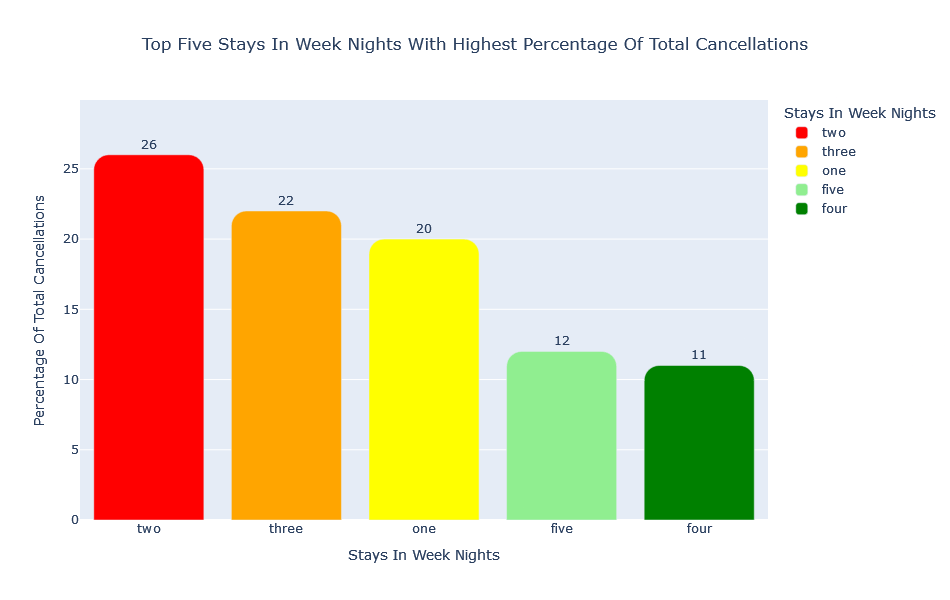

In [172]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_stays_in_week_nights = pt_cancellations_with_stays_in_week_nights.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_stays_in_week_nights_df = pd.DataFrame({'Stays In Week Nights': top_stays_in_week_nights.index, 'Percentage Of Total Cancellations': top_stays_in_week_nights['percentage of total cancellations']})

fig = px.bar(top_stays_in_week_nights_df, x='Stays In Week Nights', y='Percentage Of Total Cancellations',
         	labels={'x':'Stays In Week Nights', 'y':'Percentage Of Total Cancellations'}, color='Stays In Week Nights',
         	color_discrete_map=dict(zip(top_stays_in_week_nights_df['Stays In Week Nights'], colors)),
         	hover_data={'Stays In Week Nights': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Stays In Week Nights With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_stays_in_week_nights_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with two-night stays on weeknights (26%), followed by three-night stays (22%), single-night stays (20%), five-night stays (12%), and four-night stays (11%). However, it should also be noted that the highest percentage of total confirmations are with single-night stays (26%), followed by two-night stays (25%), three-night stays (20%), five-night stays (10%), and four-night stays (9%). These findings highlight a trend where shorter stays exhibit both higher cancellation and confirmation rates, indicating potential volatility in booking behaviors for shorter durations. To mitigate cancellations for shorter stays, consider implementing enhanced cancellation policies that provide guests with more flexibility, potentially reducing cancellation penalties for shorter booking durations. Moreover, focus on improving the booking experience and ensuring transparent communication about cancellation terms during the reservation process. For longer stays, continue to emphasize value-added services and incentives to secure bookings early, such as discounted rates for extended stays or exclusive amenities. By tailoring strategies to different stay durations, hotels can better manage booking volatility and optimize revenue.**

**Sensitivity Analysis**

In [173]:
xg23 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg23.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights']=='two'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'stays_in_week_nights'] = 'nine'
	y_pred_test_for_sa = xg23.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Stays In Week Nights From Two To Nine")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Stays In Week Nights From Two To Nine
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Stays In Week Nights From Two To Nine
Accuracy On Test Data: 98.68%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9824    0.9990    0.9906      8363
           1     0.9977    0.9589    0.9779      3647

    accuracy                         0.9868     12010
   macro avg     0.9900    0.9790    0.9843     12010
weighted avg     0.9870    0.9868    0.9868     12010

Scenario: With 50% Changes In Stays In Week Nights From Two To Nine
Accuracy On

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in stays in week nights are relatively small. The model's response to changes in stays in week nights may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between stays_in_week_nights andarrival_date_month, arrival_date_week_number, stays_in_weekend_nights, lead_time, hotel, arrival_date_day_of_month, arrival_date_year, country, market_segment, reserved_room_type, agent, meal, customer_type, adults, assigned_room_type, distribution_channel, reservation_month, is_repeated_guest, reservation_year, previous_bookings_not_canceled, reservation_date, total_of_special_requests, booking_changes, adr, babies, required_car_parking_spaces, children, deposit_type, previous_cancellations, days_in_waiting_list. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [174]:
xg24 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg24.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg24.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Stays In Week Nights And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Stays In Week Nights And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Stays In Week Nights And Interrelated Columns
Accuracy On Test Data: 88.28%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8807    0.9620    0.9195      8363
           1     0.8894    0.7011    0.7841      3647

    accuracy                         0.8828     12010
   macro avg     0.8850    0.8315    0.8518     12010
weighted avg     0.8833    0.8828    0.8784     12010

Scenario: With 50% Changes In Stays In Week Nights And Interrel

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between average daily rate and cancellations.**

**Our adr column exhibits a non-normal distribution. Using pd.qcut, we segment the capped adr data into quantile-based bins. This method ensures each bin contains a similar number of observations, effectively addressing the skewed distribution of adr. By employing these balanced bins, we achieve a clearer analysis of the relationship between adr and cancellations**

In [175]:
df1['bins'] = pd.qcut(df['adr'], q=5, duplicates='drop')
df1['bins'].value_counts()

bins
(102.708, 123.33]    12019
(69.289, 86.712]     12010
(86.712, 102.708]    12009
(151.2, 231.67]      12008
(123.33, 151.2]      12001
Name: count, dtype: int64

**Making a new column 'adr_bins' and assigning appropriate values**

In [176]:
df['adr_bins'] = ''

for index, row in df.iterrows():
    if row['adr'] > 69.289 and row['adr'] <= 86.712:
        df.loc[index, 'adr_bins'] = '69.29-86.712'
    elif row['adr'] > 86.712 and row['adr'] <= 102.708:
        df.loc[index, 'adr_bins'] = '86.72-102.708'
    elif row['adr'] > 102.708 and row['adr'] <= 123.33:
        df.loc[index, 'adr_bins'] = '102.72-123.33'
    elif row['adr'] > 123.33 and row['adr'] <= 151.2:
        df.loc[index, 'adr_bins'] = '123.4-151.2'
    elif row['adr'] > 151.2 and row['adr'] <= 231.67:
        df.loc[index, 'adr_bins'] = '151.23-231.67'

**Making pivot table and expressing the results in percentages to make the interpretation of results easier.**

In [177]:
pt_cancellations_with_adr = df.groupby(['adr_bins', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_adr['total'] = pt_cancellations_with_adr['no'] + pt_cancellations_with_adr['yes']
pt_cancellations_with_adr['percentage of total cancellations'] = ((pt_cancellations_with_adr['yes']/pt_cancellations_with_adr['yes'].sum())*100).round(0)
pt_cancellations_with_adr['percentage of total confirmations'] = ((pt_cancellations_with_adr['no']/pt_cancellations_with_adr['no'].sum())*100).round(0)
pt_cancellations_with_adr.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,total,percentage of total cancellations,percentage of total confirmations
adr_bins,,,,,
151.23-231.67,7915,4093,12008,23.0,19.0
123.4-151.2,8042,3959,12001,22.0,19.0
102.72-123.33,8378,3641,12019,20.0,20.0
86.72-102.708,8736,3273,12009,18.0,21.0
69.29-86.712,9117,2893,12010,16.0,22.0


**Plotting The Top Five Average Daily Rate Bins With Highest Percentage Of Total Cancellations**

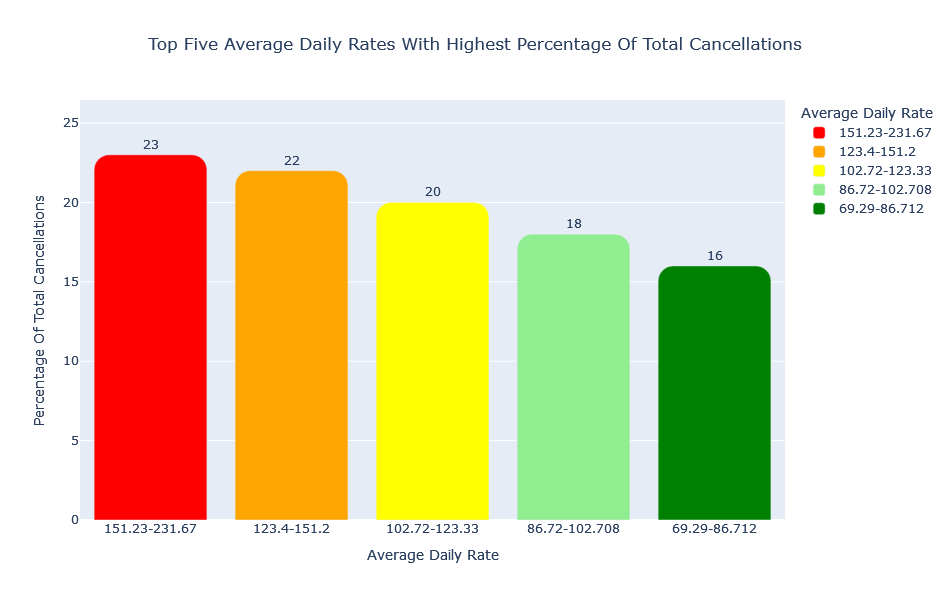

In [178]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_adr = pt_cancellations_with_adr.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_adr_df = pd.DataFrame({'Average Daily Rate': top_adr.index, 'Percentage Of Total Cancellations': top_adr['percentage of total cancellations']})

fig = px.bar(top_adr_df, x='Average Daily Rate', y='Percentage Of Total Cancellations',
         	labels={'x':'Average Daily Rate', 'y':'Percentage Of Total Cancellations'}, color='Average Daily Rate',
         	color_discrete_map=dict(zip(top_adr_df['Average Daily Rate'], colors)),
         	hover_data={'Average Daily Rate': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Average Daily Rates With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_adr_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot indicates that the highest percentage of total cancellations are associated with reservations made at average daily rates between 151.23 and 231.67 (23%), followed closely by rates between 123.4 and 151.2 (22%), 102.72 to 123.33 (20%), 86.72 to 102.708 (18%), and 69.29 to 86.712 (16%). Conversely, the highest percentage of total confirmations align with average daily rates between 69.29 and 86.712 (22%), followed by rates between 86.72 and 102.708 (21%), 102.72 to 123.33 (20%), and 123.4 to 151.2 and 151.23 to 231.67 (19% each). To mitigate cancellations associated with higher daily rates, consider offering flexible rate options or packages that include added value to justify the higher cost, such as complimentary services or upgrades. For bookings at lower rates, focus on maintaining competitive pricing while emphasizing the unique benefits of staying at your property. Additionally, monitor pricing trends closely and adjust strategies accordingly to attract and retain bookings across different rate categories, ensuring a balanced occupancy and revenue management approach.**

**Sensitivity Analysis**

In [179]:
xg25 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg25.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'adr'] = 231.670000
	y_pred_test_for_sa = xg25.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Average Daily Rate From 69.29-90 To 231.67")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Average Daily Rate From 69.29-90 To 231.67
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Average Daily Rate From 69.29-90 To 231.67
Accuracy On Test Data: 98.92%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9856    0.9990    0.9923      8363
           1     0.9977    0.9665    0.9819      3647

    accuracy                         0.9892     12010
   macro avg     0.9917    0.9828    0.9871     12010
weighted avg     0.9893    0.9892    0.9891     12010

Scenario: With 50% Changes In Average Daily Rate From 69.29-90 To 231

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the average daily rates are relatively small. The model's response to changes in average daily rates may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between adr and assigned_room_type, reserved_room_type, arrival_date_month, arrival_date_week_number, reservation_month, market_segment, children, adults, meal, agent, reservation_year, arrival_date_year, customer_type, total_of_special_requests, distribution_channel, country, hotel, lead_time, required_car_parking_spaces, arrival_date_day_of_month, stays_in_week_nights, days_in_waiting_list, is_repeated_guest, previous_bookings_not_canceled, previous_cancellations, booking_changes, deposit_type, babies, reservation_date, stays_in_weekend_nights. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [180]:
xg26 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg26.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg26.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Average Daily Rate And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Average Daily Rate And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Average Daily Rate And Interrelated Columns
Accuracy On Test Data: 88.20%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8812    0.9599    0.9189      8363
           1     0.8845    0.7033    0.7836      3647

    accuracy                         0.8820     12010
   macro avg     0.8829    0.8316    0.8512     12010
weighted avg     0.8822    0.8820    0.8778     12010

Scenario: With 50% Changes In Average Daily Rate And Interrelated C

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between arrival date year and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [181]:
pt_cancellations_with_arrival_date_year = df.groupby (['arrival_date_year', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_arrival_date_year['percentage of total cancellations'] = ((pt_cancellations_with_arrival_date_year['yes']/pt_cancellations_with_arrival_date_year['yes'].sum())*100).round(0)
pt_cancellations_with_arrival_date_year['percentage of total confirmations'] = ((pt_cancellations_with_arrival_date_year['no']/pt_cancellations_with_arrival_date_year['no'].sum())*100).round(0)
pt_cancellations_with_arrival_date_year.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
arrival_date_year,,,,
2016,20719,8562,48.0,49.0
2017,15210,7588,42.0,36.0
2015,6259,1709,10.0,15.0


**Plotting The Top Three Arrival Date Years With Highest Percentage Of Total Cancellations**

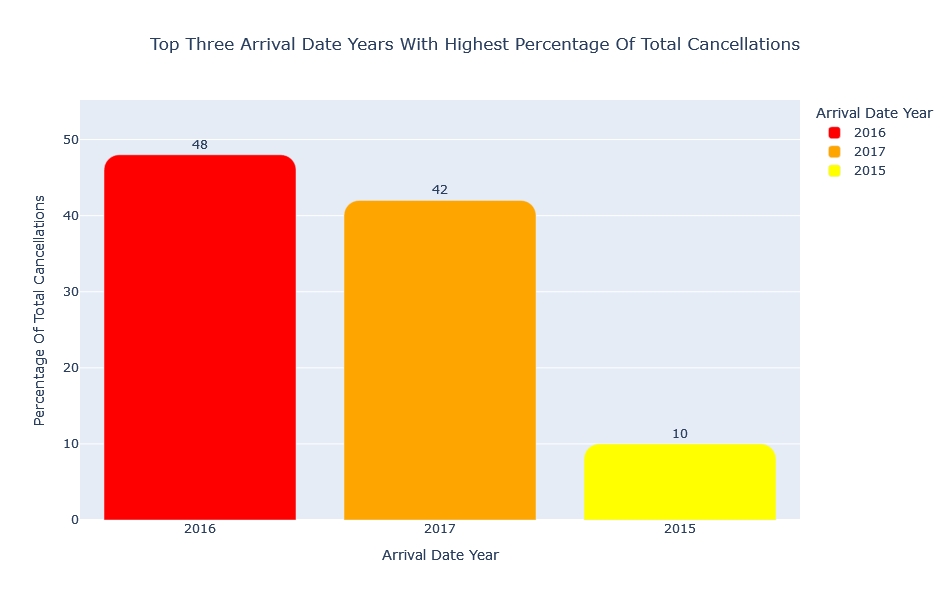

In [182]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_arrival_date_year = pt_cancellations_with_arrival_date_year.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_arrival_date_year_df = pd.DataFrame({'Arrival Date Year': top_arrival_date_year.index, 'Percentage Of Total Cancellations': top_arrival_date_year['percentage of total cancellations']})

fig = px.bar(top_arrival_date_year_df, x='Arrival Date Year', y='Percentage Of Total Cancellations',
         	labels={'x':'Arrival Date Year', 'y':'Percentage Of Total Cancellations'}, color='Arrival Date Year',
         	color_discrete_map=dict(zip(top_arrival_date_year_df['Arrival Date Year'], colors)),
         	hover_data={'Arrival Date Year': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Arrival Date Years With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_arrival_date_year_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot reveals that the highest percentage of total cancellations occurs for reservations with arrival dates in 2016 (48%), followed by 2017 (42%), and 2015 (10%). Similarly, the highest percentage of total confirmations aligns with reservations from 2016 (49%), followed by 2017 (36%), and 2015 (15%). To capitalize on these insights, consider implementing dynamic pricing models that adjust rates based on historical demand patterns from 2016 and 2017. Enhance marketing efforts by targeting promotions during periods with historically high confirmation rates, such as the peaks observed in 2016. Improve booking stability by revising cancellation policies to incentivize early bookings and reduce last-minute cancellations. Furthermore, invest in guest engagement strategies that personalize experiences based on historical booking preferences, thereby fostering loyalty and repeat bookings.**

**Sensitivity Analysis**

In [183]:
xg27 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg27.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year']=='2016'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'arrival_date_year'] = '2015'
	y_pred_test_for_sa = xg27.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Arrival Date Year From 2016 To 2015")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Arrival Date Year From 2016 To 2015
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Date Year From 2016 To 2015
Accuracy On Test Data: 98.81%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9840    0.9992    0.9915      8363
           1     0.9980    0.9627    0.9800      3647

    accuracy                         0.9881     12010
   macro avg     0.9910    0.9809    0.9858     12010
weighted avg     0.9882    0.9881    0.9880     12010

Scenario: With 50% Changes In Arrival Date Year From 2016 To 2015
Accuracy On Test 

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the arrival date year are relatively small. The model's response to changes in arrival date year may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between arrival_date_year & lead_time, hotel, reservation_month, reservation_year, arrival_date_month, arrival_date_week_number, previous_cancellations, country, agent, customer_type, meal, adr, market_segment, assigned_room_type, reserved_room_type, stays_in_week_nights, distribution_channel, adults, required_car_parking_spaces, total_of_special_requests, arrival_date_day_of_month, stays_in_weekend_nights, reservation_date, booking_changes, is_repeated_guest, babies, previous_bookings_not_canceled, children, days_in_waiting_list, deposit_type. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [184]:
xg28 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg28.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg28.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Arrival Date Year And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Arrival Date Year And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Date Year And Interrelated Columns
Accuracy On Test Data: 87.96%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8798    0.9579    0.9172      8363
           1     0.8788    0.7000    0.7793      3647

    accuracy                         0.8796     12010
   macro avg     0.8793    0.8290    0.8483     12010
weighted avg     0.8795    0.8796    0.8753     12010

Scenario: With 50% Changes In Arrival Date Year And Interrelated Colu

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between assigned room type and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [185]:
pt_cancellations_with_assigned_room_type = df.groupby (['assigned_room_type', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_assigned_room_type['percentage of total cancellations'] = ((pt_cancellations_with_assigned_room_type['yes']/pt_cancellations_with_assigned_room_type['yes'].sum())*100).round(0)
pt_cancellations_with_assigned_room_type['percentage of total confirmations'] = ((pt_cancellations_with_assigned_room_type['no']/pt_cancellations_with_assigned_room_type['no'].sum())*100).round(0)
pt_cancellations_with_assigned_room_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
assigned_room_type,,,,
A,21919,10289,58.0,52.0
D,11076,4511,25.0,26.0
E,3599,1226,7.0,9.0
F,1970,682,4.0,5.0
G,1164,452,3.0,3.0


**Plotting The Top Assigned Room Types With Highest Percentage Of Total Cancellations**

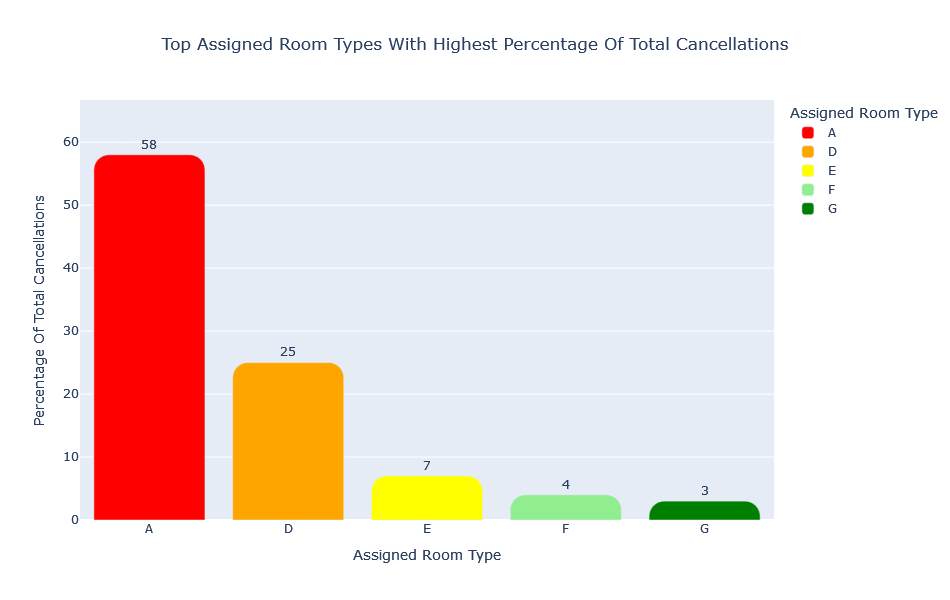

In [186]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_assigned_room_type = pt_cancellations_with_assigned_room_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_assigned_room_type_df = pd.DataFrame({'Assigned Room Type': top_assigned_room_type.index, 'Percentage Of Total Cancellations': top_assigned_room_type['percentage of total cancellations']})

fig = px.bar(top_assigned_room_type_df, x='Assigned Room Type', y='Percentage Of Total Cancellations',
         	labels={'x':'Assigned Room Type', 'y':'Percentage Of Total Cancellations'}, color='Assigned Room Type',
         	color_discrete_map=dict(zip(top_assigned_room_type_df['Assigned Room Type'], colors)),
         	hover_data={'Assigned Room Type': False}, text='Percentage Of Total Cancellations',
         	title='Top Assigned Room Types With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_assigned_room_type_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the assigned room type A (58%), followed by the assigned room type D (25%), E (7%), F (4%), and G (3%). Similarly, the highest percentage of total confirmations are also with the assigned room type A (52%), followed by the assigned room type D (26%), E (9%), F (5%), and G (3%). This indicates that room types A and D are the most frequently assigned and thus see the highest numbers of both cancellations and confirmations. To mitigate cancellations for these room types, consider analyzing whether the assignments meet guest expectations and preferences. Enhancing the allocation process by incorporating guest preferences more effectively or offering upgrades and special incentives for other room types (E, F, and G) might balance the distribution and reduce cancellations. Additionally, improving the overall guest experience for these frequently assigned room types through better amenities or personalized services could lead to higher satisfaction and fewer cancellations.**

**Sensitivity Analysis**

In [187]:
xg29 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg29.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type']=='A'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'assigned_room_type'] = 'I'
	y_pred_test_for_sa = xg29.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Assigned Room Type From A To I")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Assigned Room Type From A To I
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Assigned Room Type From A To I
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Assigned Room Type From A To I
Accuracy On Test Data: 98.88%
Cl

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the assigned room type are absent altogether. The model's response to changes in assigned room type may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between assigned_room_type and assigned_room_type, market_segment, distribution_channel, children, adults, meal, hotel, reserved_room_type, stays_in_week_nights, country, arrival_date_month, arrival_date_year, stays_in_weekend_nights, arrival_date_week_number, babies, lead_time, previous_bookings_not_canceled, arrival_date_day_of_month, is_repeated_guest, previous_cancellations, adr, required_car_parking_spaces, agent, customer_type, booking_changes, reservation_year, reservation_month, total_of_special_requests, deposit_type, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [188]:
xg30 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg30.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg30.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Assigned Room Type And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Assigned Room Type And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Assigned Room Type And Interrelated Columns
Accuracy On Test Data: 88.79%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8877    0.9605    0.9227      8363
           1     0.8886    0.7214    0.7963      3647

    accuracy                         0.8879     12010
   macro avg     0.8881    0.8410    0.8595     12010
weighted avg     0.8880    0.8879    0.8843     12010

Scenario: With 50% Changes In Assigned Room Type And Interrelated C

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between previous_bookings_not_canceled and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [189]:
pt_cancellations_with_previous_bookings_not_canceled = df.groupby (['previous_bookings_not_canceled', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_previous_bookings_not_canceled['percentage of total cancellations'] = ((pt_cancellations_with_previous_bookings_not_canceled['yes']/pt_cancellations_with_previous_bookings_not_canceled['yes'].sum())*100).round(0)
pt_cancellations_with_previous_bookings_not_canceled['percentage of total confirmations'] = ((pt_cancellations_with_previous_bookings_not_canceled['no']/pt_cancellations_with_previous_bookings_not_canceled['no'].sum())*100).round(0)
pt_cancellations_with_previous_bookings_not_canceled.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
previous_bookings_not_canceled,,,,
zero,41312,17807,100.0,98.0
five,38,4,0.0,0.0
four,62,3,0.0,0.0
one,515,28,0.0,1.0
three,88,4,0.0,0.0


**Plotting The Top Previous Bookings Not Canceled With Highest Percentage Of Total Cancellations**

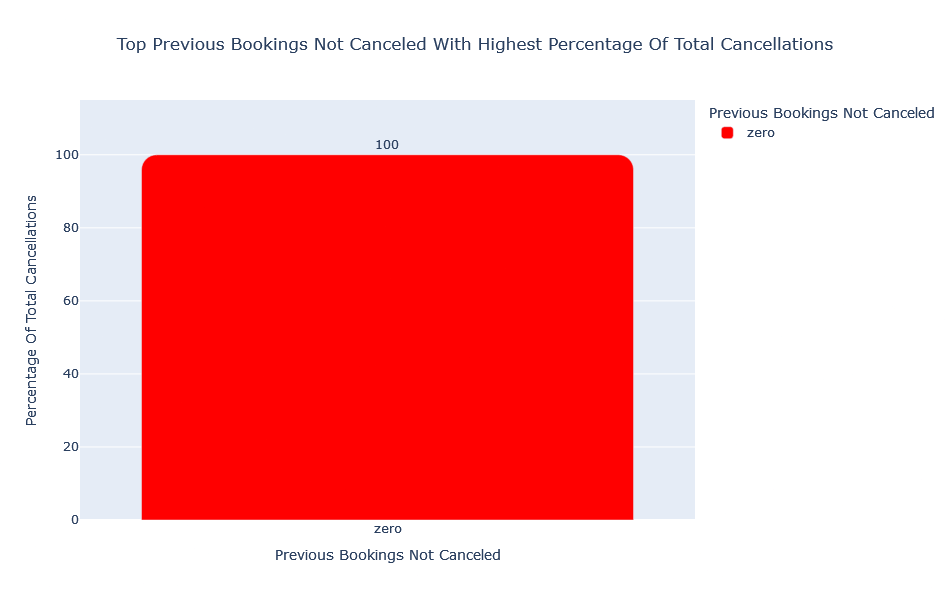

In [190]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_previous_bookings_not_canceled = pt_cancellations_with_previous_bookings_not_canceled.sort_values(by = 'percentage of total cancellations', ascending = False).head(1)
top_previous_bookings_not_canceled_df = pd.DataFrame({'Previous Bookings Not Canceled': top_previous_bookings_not_canceled.index, 'Percentage Of Total Cancellations': top_previous_bookings_not_canceled['percentage of total cancellations']})

fig = px.bar(top_previous_bookings_not_canceled_df, x='Previous Bookings Not Canceled', y='Percentage Of Total Cancellations',
         	labels={'x':'Previous Bookings Not Canceled', 'y':'Percentage Of Total Cancellations'}, color='Previous Bookings Not Canceled',
         	color_discrete_map=dict(zip(top_previous_bookings_not_canceled_df['Previous Bookings Not Canceled'], colors)),
         	hover_data={'Previous Bookings Not Canceled': False}, text='Percentage Of Total Cancellations',
         	title='Top Previous Bookings Not Canceled With Highest Percentage Of Total Cancellations', width=800, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_previous_bookings_not_canceled_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that 100% of total cancellations occur with zero previous bookings not canceled. Similarly, the highest percentage of total confirmations also occur with zero previous bookings not canceled (98%), followed by one previous booking not canceled (1%). This indicates that guests with no prior bookings or a history of not canceling are most likely to both cancel and confirm their reservations. To address this, it's essential to focus on maintaining and improving the satisfaction of first-time bookers. Implementing measures such as personalized communication, special offers, and flexible policies can enhance their experience and encourage loyalty. Additionally, analyzing feedback from these guests to understand and address their needs and concerns can help reduce cancellations and increase confirmations.**

**Sensitivity Analysis**

In [191]:
xg31 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg31.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled']=='zero'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'previous_bookings_not_canceled'] = 'five'
	y_pred_test_for_sa = xg31.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Previous Bookings Not Canceled From Zero To Five")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Previous Bookings Not Canceled From Zero To Five
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Previous Bookings Not Canceled From Zero To Five
Accuracy On Test Data: 98.76%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9834    0.9990    0.9912      8363
           1     0.9977    0.9613    0.9792      3647

    accuracy                         0.9876     12010
   macro avg     0.9906    0.9802    0.9852     12010
weighted avg     0.9878    0.9876    0.9875     12010

Scenario: With 50% Changes In Previous Bookings Not Cance

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the previous_bookings_not_canceled are relatively small. The model's response to changes in previous_bookings_not_canceled may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between previous_bookings_not_canceled & market_segment, is_repeated_guest, distribution_channel, adults, previous_cancellations, country, stays_in_week_nights, hotel, stays_in_weekend_nights, meal, arrival_date_year, arrival_date_week_number, arrival_date_month, lead_time, children, customer_type, required_car_parking_spaces, adr, reservation_year, assigned_room_type, total_of_special_requests, reservation_month, booking_changes, reserved_room_type, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [192]:
xg32 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg32.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg32.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Previous Bookings Not Canceled And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Previous Bookings Not Canceled And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Previous Bookings Not Canceled And Interrelated Columns
Accuracy On Test Data: 88.94%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8877    0.9631    0.9238      8363
           1     0.8948    0.7206    0.7983      3647

    accuracy                         0.8894     12010
   macro avg     0.8912    0.8418    0.8611     12010
weighted avg     0.8898    0.8894    0.8857     12010

Scenario: With 50% Changes In Previous Book

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between adults and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [193]:
pt_cancellations_with_adults = df.groupby (['adults', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_adults['percentage of total cancellations'] = ((pt_cancellations_with_adults['yes']/pt_cancellations_with_adults['yes'].sum())*100).round(0)
pt_cancellations_with_adults['percentage of total confirmations'] = ((pt_cancellations_with_adults['no']/pt_cancellations_with_adults['no'].sum())*100).round(0)
pt_cancellations_with_adults.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
adults,,,,
two,32492,14174,79.0,77.0
one,6239,1870,10.0,15.0
three,3323,1747,10.0,8.0
four,27,7,0.0,0.0
zero,107,61,0.0,0.0


**Plotting The Top Three Number Of Adults With Highest Percentage Of Total Cancellations**

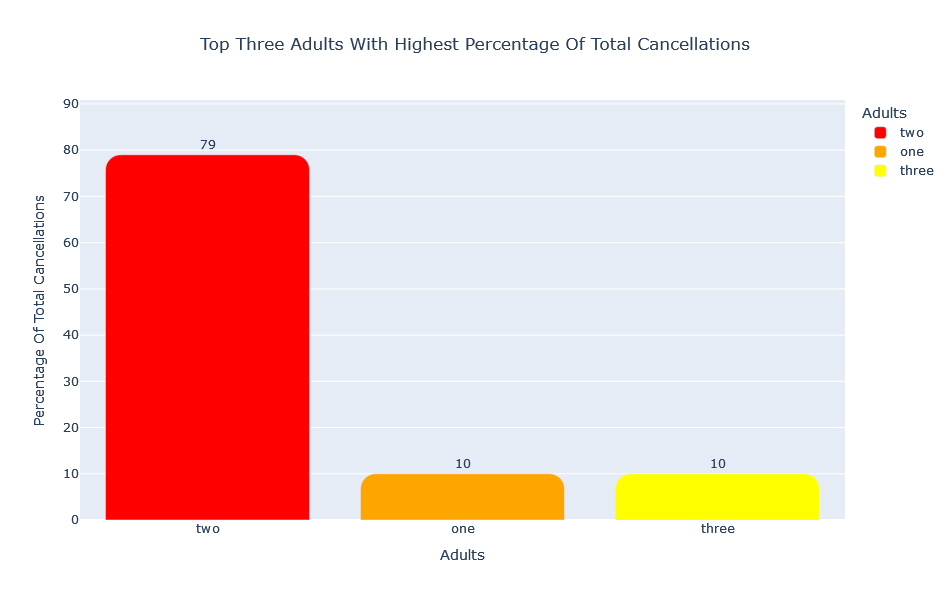

In [194]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_adults = pt_cancellations_with_adults.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_adults_df = pd.DataFrame({'Adults': top_adults.index, 'Percentage Of Total Cancellations': top_adults['percentage of total cancellations']})

fig = px.bar(top_adults_df, x='Adults', y='Percentage Of Total Cancellations',
         	labels={'x':'Adults', 'y':'Percentage Of Total Cancellations'}, color='Adults',
         	color_discrete_map=dict(zip(top_adults_df['Adults'], colors)),
         	hover_data={'Adults': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Adults With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_adults_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with two adults (79%), followed by one and three adults (10% each). Similarly, the highest percentage of total confirmations are also with two adults (77%), followed by one adult (15%) and three adults (8%). This indicates that bookings involving two adults are the most common and also have the highest cancellation rates. To address this, consider implementing targeted strategies for couples, such as offering special packages or incentives for maintaining their bookings. Enhanced communication and personalized offers for one and three-adult reservations could also help in reducing cancellations and increasing the likelihood of confirmations.**

**Sensitivity Analysis**

In [195]:
xg33 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg33.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['adults']=='two'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'adults'] = 'four'
	y_pred_test_for_sa = xg33.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Adults From Two To Four")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Adults From Two To Four
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Adults From Two To Four
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Adults From Two To Four
Accuracy On Test Data: 98.88%
Classification Report O

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the number of adults are relatively small. The model's response to changes in number of adults may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between adults & stays_in_week_nights, lead_time, arrival_date_week_number, hotel, arrival_date_month, stays_in_weekend_nights, arrival_date_year, arrival_date_day_of_month, children, customer_type, market_segment, distribution_channel, reserved_room_type, assigned_room_type, adr, agent, total_of_special_requests, meal, previous_bookings_not_canceled, country, is_repeated_guest, reservation_month, booking_changes, days_in_waiting_list, reservation_year, required_car_parking_spaces, babies, deposit_type, previous_cancellations, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [196]:
xg34 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg34.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg34.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Adults And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Adults And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Adults And Interrelated Columns
Accuracy On Test Data: 88.63%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8859    0.9603    0.9216      8363
           1     0.8873    0.7165    0.7928      3647

    accuracy                         0.8863     12010
   macro avg     0.8866    0.8384    0.8572     12010
weighted avg     0.8863    0.8863    0.8825     12010

Scenario: With 50% Changes In Adults And Interrelated Columns
Accuracy On Test Data: 85.08%

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between reservation year and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [197]:
pt_cancellations_with_reservation_year = df.groupby (['reservation_year', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_reservation_year['percentage of total cancellations'] = ((pt_cancellations_with_reservation_year['yes']/pt_cancellations_with_reservation_year['yes'].sum())*100).round(0)
pt_cancellations_with_reservation_year['percentage of total confirmations'] = ((pt_cancellations_with_reservation_year['no']/pt_cancellations_with_reservation_year['no'].sum())*100).round(0)
pt_cancellations_with_reservation_year.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
reservation_year,,,,
2016,20689,9669,54.0,49.0
2017,15445,6290,35.0,37.0
2015,6054,1900,11.0,14.0


**Plotting The Top Three Reservation Years With Highest Percentage Of Total Cancellations**

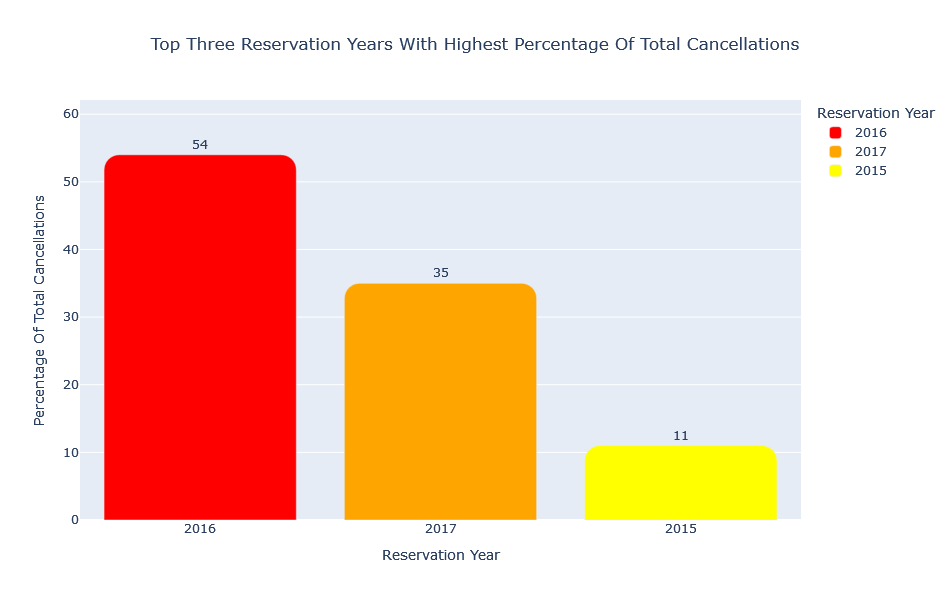

In [198]:
colors = ['red', 'orange', 'yellow']
top_reservation_year = pt_cancellations_with_reservation_year.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_reservation_year_df = pd.DataFrame({'Reservation Year': top_reservation_year.index, 'Percentage Of Total Cancellations': top_reservation_year['percentage of total cancellations']})

fig = px.bar(top_reservation_year_df, x='Reservation Year', y='Percentage Of Total Cancellations',
         	labels={'x':'Reservation Year', 'y':'Percentage Of Total Cancellations'}, color='Reservation Year',
         	color_discrete_map=dict(zip(top_reservation_year_df['Reservation Year'], colors)),
         	hover_data={'Reservation Year': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Reservation Years With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_reservation_year_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the reservation year 2016 (54%), followed by 2017 (35%), and 2015 (11%). Similarly, the highest percentage of total confirmations are also from the reservation year 2016 (49%), followed by 2017 (37%), and 2015 (14%). Given these results, it is crucial to examine the specific conditions and events of 2016 that led to high cancellation and confirmation rates. Strategies to reduce cancellations could include reviewing and possibly revising booking policies or offering incentives for retaining bookings. Additionally, capitalizing on successful aspects of 2016 that drove high confirmations, such as popular promotions or successful customer engagement practices, could help improve booking stability and increase future confirmations.**

**Sensitivity Analysis**

In [199]:
xg35 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg35.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year']=='2016'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'reservation_year'] = '2015'
	y_pred_test_for_sa = xg35.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Reservation Year From 2016 To 2015")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Reservation Year From 2016 To 2015
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reservation Year From 2016 To 2015
Accuracy On Test Data: 98.84%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9846    0.9990    0.9918      8363
           1     0.9977    0.9641    0.9806      3647

    accuracy                         0.9884     12010
   macro avg     0.9911    0.9816    0.9862     12010
weighted avg     0.9886    0.9884    0.9884     12010

Scenario: With 50% Changes In Reservation Year From 2016 To 2015
Accuracy On Test Dat

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the reservation year are relatively small. The model's response to changes in the reservation year may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between reservation_year & arrival_date_month, arrival_date_week_number, country, arrival_date_year, previous_cancellations, customer_type, hotel, agent, meal, lead_time, market_segment, assigned_room_type, reserved_room_type, stays_in_week_nights, adults, total_of_special_requests, distribution_channel, arrival_date_day_of_month, required_car_parking_spaces, stays_in_weekend_nights, is_repeated_guest, previous_bookings_not_canceled, booking_changes, children, babies, deposit_type, days_in_waiting_list, reservation_month, adr, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [200]:
xg36 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg36.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg36.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Reservation Year And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Reservation Year And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reservation Year And Interrelated Columns
Accuracy On Test Data: 88.30%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8832    0.9587    0.9194      8363
           1     0.8823    0.7094    0.7864      3647

    accuracy                         0.8830     12010
   macro avg     0.8828    0.8340    0.8529     12010
weighted avg     0.8830    0.8830    0.8791     12010

Scenario: With 50% Changes In Reservation Year And Interrelated Columns

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between meal and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [201]:
pt_cancellations_with_meal = df.groupby (['meal', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_meal['percentage of total cancellations'] = ((pt_cancellations_with_meal['yes']/pt_cancellations_with_meal['yes'].sum())*100).round(0)
pt_cancellations_with_meal['percentage of total confirmations'] = ((pt_cancellations_with_meal['no']/pt_cancellations_with_meal['no'].sum())*100).round(0)
pt_cancellations_with_meal.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
meal,,,,
BB,32353,13138,74.0,77.0
SC,5197,2964,17.0,12.0
HB,4347,1678,9.0,10.0
FB,148,45,0.0,0.0
Undefined,143,34,0.0,0.0


**Plotting The Top Three Meals With Highest Percentage Of Total Cancellations**

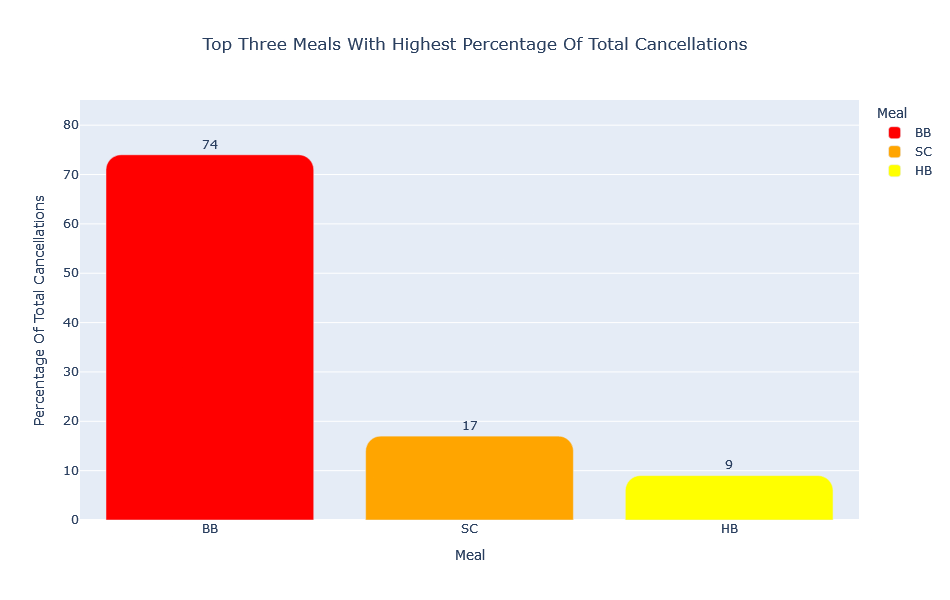

In [202]:
colors = ['red', 'orange', 'yellow']
top_meal = pt_cancellations_with_meal.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_meal_df = pd.DataFrame({'Meal': top_meal.index, 'Percentage Of Total Cancellations': top_meal['percentage of total cancellations']})

fig = px.bar(top_meal_df, x='Meal', y='Percentage Of Total Cancellations',
         	labels={'x':'Meal', 'y':'Percentage Of Total Cancellations'}, color='Meal',
         	color_discrete_map=dict(zip(top_meal_df['Meal'], colors)),
         	hover_data={'Meal': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Meals With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_meal_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the booked meal type BB (74%), followed by SC (17%), and HB (9%). However, it should also be noted that the highest percentage of total confirmations are also with the booked meal type BB (77%), followed by SC (12%), and HB (10%). To address this, for BB bookings, focus on improving clarity around the breakfast service by providing detailed descriptions and proactive communication. For SC bookings, emphasize the flexibility and independence self-catering offers, highlighting kitchen facilities and local dining recommendations. For HB (Half Board) bookings, ensure transparency about dining times, menus, and restrictions, and provide previews of sample menus to entice guests to confirm their bookings. Tailoring these recommendations to each meal type can help reduce cancellations and enhance the overall guest experience.**

**Sensitivity Analysis**

In [203]:
xg37 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg37.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['meal']=='BB'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'meal'] = 'Undefined'
	y_pred_test_for_sa = xg37.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Meal From BB To Undefined")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Meal From BB To Undefined
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Meal From BB To Undefined
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Meal From BB To Undefined
Accuracy On Test Data: 98.88%
Classification Re

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the meal are relatively small. The model's response to changes in meal may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between meal & stays_in_week_nights, stays_in_weekend_nights, lead_time, hotel, arrival_date_year, adults, children, arrival_date_week_number, arrival_date_month, babies, arrival_date_day_of_month, country, market_segment, agent, assigned_room_type, reserved_room_type, distribution_channel, adr, booking_changes, customer_type, reservation_year, required_car_parking_spaces, total_of_special_requests, reservation_month, deposit_type, is_repeated_guest, previous_bookings_not_canceled, reservation_date, previous_cancellations, days_in_waiting_list. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [204]:
xg38 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg38.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg38.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Meal And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Meal And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Meal And Interrelated Columns
Accuracy On Test Data: 88.42%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8848    0.9585    0.9202      8363
           1     0.8824    0.7137    0.7891      3647

    accuracy                         0.8842     12010
   macro avg     0.8836    0.8361    0.8547     12010
weighted avg     0.8840    0.8842    0.8804     12010

Scenario: With 50% Changes In Meal And Interrelated Columns
Accuracy On Test Data: 84.78%
Class

**Bivariate analysis between is_repeated_guest and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [205]:
pt_cancellations_with_is_repeated_guest = df.groupby (['is_repeated_guest', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_is_repeated_guest['percentage of total cancellations'] = ((pt_cancellations_with_is_repeated_guest['yes']/pt_cancellations_with_is_repeated_guest['yes'].sum())*100).round(0)
pt_cancellations_with_is_repeated_guest['percentage of total confirmations'] = ((pt_cancellations_with_is_repeated_guest['no']/pt_cancellations_with_is_repeated_guest['no'].sum())*100).round(0)
pt_cancellations_with_is_repeated_guest.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
is_repeated_guest,,,,
no,41393,17770,100.0,98.0
yes,795,89,0.0,2.0


**Plotting The Top Values For Is Repeated Guest With Highest Percentage Of Total Cancellations**

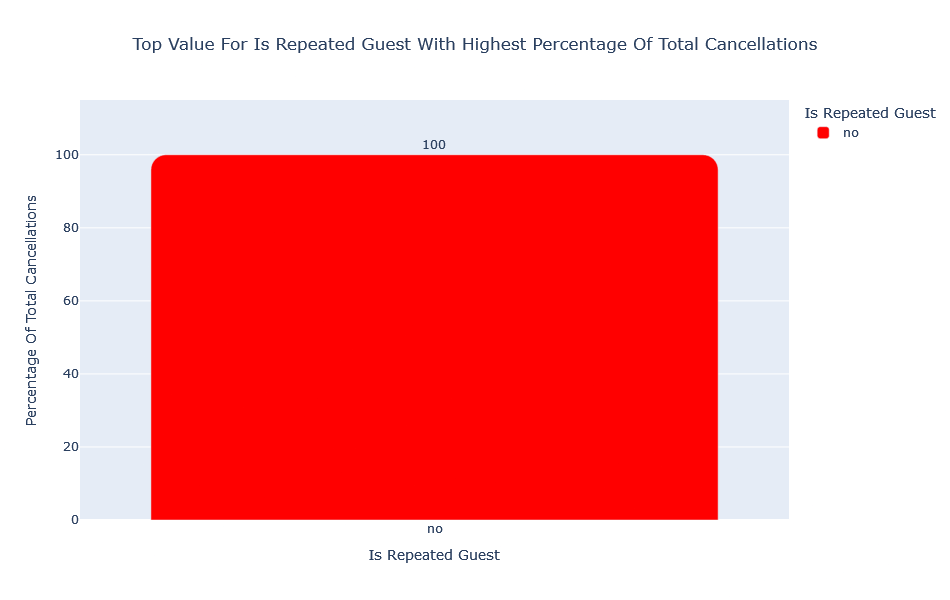

In [206]:
colors = ['red']
top_is_repeated_guest = pt_cancellations_with_is_repeated_guest.sort_values(by = 'percentage of total cancellations', ascending = False).head(1)
top_is_repeated_guest_df = pd.DataFrame({'Is Repeated Guest': top_is_repeated_guest.index, 'Percentage Of Total Cancellations': top_is_repeated_guest['percentage of total cancellations']})

fig = px.bar(top_is_repeated_guest_df, x='Is Repeated Guest', y='Percentage Of Total Cancellations',
         	labels={'x':'Is Repeated Guest', 'y':'Percentage Of Total Cancellations'}, color='Is Repeated Guest',
         	color_discrete_map=dict(zip(top_is_repeated_guest_df['Is Repeated Guest'], colors)),
         	hover_data={'Is Repeated Guest': False}, text='Percentage Of Total Cancellations',
         	title='Top Value For Is Repeated Guest With Highest Percentage Of Total Cancellations', width=750, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_is_repeated_guest_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that 100% of total cancellations are from the people who are not repeated guests (100%). However, it ahould also be noted that the highest percentage of total confirmations are also from the people who are not repeated guests (98%), followed by those who are repeated guests (2%). This indicates a notable trend and suggests an opportunity to focus on enhancing the first-time guest experience to reduce cancellations. Strategies could include personalized welcome messages, clear and engaging booking confirmations, and proactive communication to manage expectations effectively. Encouraging repeat visits could involve loyalty programs, exclusive offers, or personalized incentives to foster guest loyalty and increase repeat bookings.**

**Sensitivity Analysis**

In [207]:
xg39 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg39.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest']=='no'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'is_repeated_guest'] = 'yes'
	y_pred_test_for_sa = xg39.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Is Repeated Guest From No To Yes")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Is Repeated Guest From No To Yes
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Is Repeated Guest From No To Yes
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Is Repeated Guest From No To Yes
Accuracy On Test Data: 98.

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in is_repeated_guest are relatively small. The model's response to changes in is_repeated_guest may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between is_repeated_guest & market_segment, distribution_channel, lead_time, adults, country, stays_in_week_nights, stays_in_weekend_nights, hotel, arrival_date_month, arrival_date_week_number, meal, arrival_date_year, children, previous_bookings_not_canceled, customer_type, previous_cancellations, required_car_parking_spaces, adr, reservation_year, reservation_month, agent, assigned_room_type, booking_changes, reserved_room_type, total_of_special_requests. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [208]:
xg40 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg40.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg40.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Is Repeated Guest And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Is Repeated Guest And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Is Repeated Guest And Interrelated Columns
Accuracy On Test Data: 88.86%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8839    0.9670    0.9236      8363
           1     0.9035    0.7088    0.7944      3647

    accuracy                         0.8886     12010
   macro avg     0.8937    0.8379    0.8590     12010
weighted avg     0.8899    0.8886    0.8844     12010

Scenario: With 50% Changes In Is Repeated Guest And Interrelated Colu

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between children and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [209]:
pt_cancellations_with_children = df.groupby (['children', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_children['percentage of total cancellations'] = ((pt_cancellations_with_children['yes']/pt_cancellations_with_children['yes'].sum())*100).round(0)
pt_cancellations_with_children['percentage of total confirmations'] = ((pt_cancellations_with_children['no']/pt_cancellations_with_children['no'].sum())*100).round(0)
pt_cancellations_with_children.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
children,,,,
zero,38014,15602,87.0,90.0
one,2616,1180,7.0,6.0
two,1533,1068,6.0,4.0
three,25,9,0.0,0.0


**Plotting The Top Three Number Of Children With Highest Percentage Of Total Cancellations**

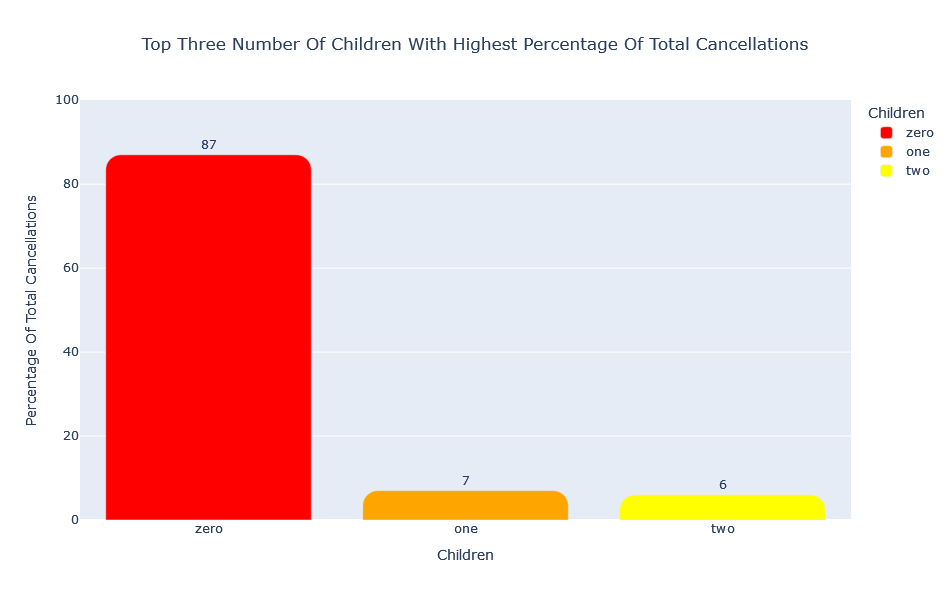

In [210]:
colors = ['red', 'orange', 'yellow']
top_children = pt_cancellations_with_children.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_children_df = pd.DataFrame({'Children': top_children.index, 'Percentage Of Total Cancellations': top_children['percentage of total cancellations']})

fig = px.bar(top_children_df, x='Children', y='Percentage Of Total Cancellations',
         	labels={'x':'Children', 'y':'Percentage Of Total Cancellations'}, color='Children',
         	color_discrete_map=dict(zip(top_children_df['Children'], colors)),
         	hover_data={'Children': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Number Of Children With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_children_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the bookings with no children (87%), followed by one (7%) & two children (6%). However it should also be noted that the highest percentage of total confirmations are from the bookings with no children (90%), followed by one (6%) & two children (4%). To effectively address the high percentage of cancellations from bookings without children, hotels can implement strategic measures. Firstly, for bookings without children, introducing flexible cancellation policies tailored to accommodate last-minute changes can mitigate cancellations and enhance booking confidence. Proactive communication about amenities and services appealing to all guests, including those without children, helps in emphasizing the hotel's comprehensive offerings. Moreover, soliciting and analyzing guest feedback can provide valuable insights into cancellation reasons, enabling adjustments in policies or services to improve retention. Simultaneously, to attract more bookings from families, hotels should develop enticing family-friendly packages and enhance amenities like family suites, children's activities, and specialized dining options. Targeted marketing efforts aimed at family-oriented demographics and collaborations with family-focused travel channels can effectively broaden the hotel's appeal and capture a larger share of the family travel market. These strategies collectively support guest satisfaction, occupancy rates, and overall business growth.**

**Sensitivity Analysis**

In [211]:
xg41 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg41.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['children']=='zero'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'children'] = 'three'
	y_pred_test_for_sa = xg41.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Number Of Children From Zero To Three")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Number Of Children From Zero To Three
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Number Of Children From Zero To Three
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9989    0.9920      8363
           1     0.9975    0.9655    0.9812      3647

    accuracy                         0.9888     12010
   macro avg     0.9913    0.9822    0.9866     12010
weighted avg     0.9889    0.9888    0.9887     12010

Scenario: With 50% Changes In Number Of Children From Zero To Three
Accuracy On

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the number of children are relatively small. The model's response to changes in number of children may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between children & adults, arrival_date_week_number, arrival_date_month, hotel, stays_in_week_nights, arrival_date_year, stays_in_weekend_nights, lead_time, arrival_date_day_of_month, assigned_room_type, reserved_room_type, adr, agent, meal, market_segment, total_of_special_requests, reservation_month, distribution_channel, booking_changes, customer_type, country, required_car_parking_spaces, babies, reservation_year, is_repeated_guest, deposit_type, previous_bookings_not_canceled, previous_cancellations. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [212]:
xg42 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg42.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg42.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Children And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Children And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Children And Interrelated Columns
Accuracy On Test Data: 89.03%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8877    0.9644    0.9245      8363
           1     0.8981    0.7203    0.7995      3647

    accuracy                         0.8903     12010
   macro avg     0.8929    0.8423    0.8620     12010
weighted avg     0.8909    0.8903    0.8865     12010

Scenario: With 50% Changes In Children And Interrelated Columns
Accuracy On Test Data: 

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between arrival_date_month and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [213]:
pt_cancellations_with_arrival_date_month = df.groupby (['arrival_date_month', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_arrival_date_month['percentage of total cancellations'] = ((pt_cancellations_with_arrival_date_month['yes']/pt_cancellations_with_arrival_date_month['yes'].sum())*100).round(0)
pt_cancellations_with_arrival_date_month['percentage of total confirmations'] = ((pt_cancellations_with_arrival_date_month['no']/pt_cancellations_with_arrival_date_month['no'].sum())*100).round(0)
pt_cancellations_with_arrival_date_month.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
arrival_date_month,,,,
August,6112,2806,16.0,14.0
July,5734,2551,14.0,14.0
April,3979,1934,11.0,9.0
June,4440,1929,11.0,11.0
May,4270,1917,11.0,10.0


**Plotting The Top Five Arrival Months With Highest Percentage Of Total Cancellations**

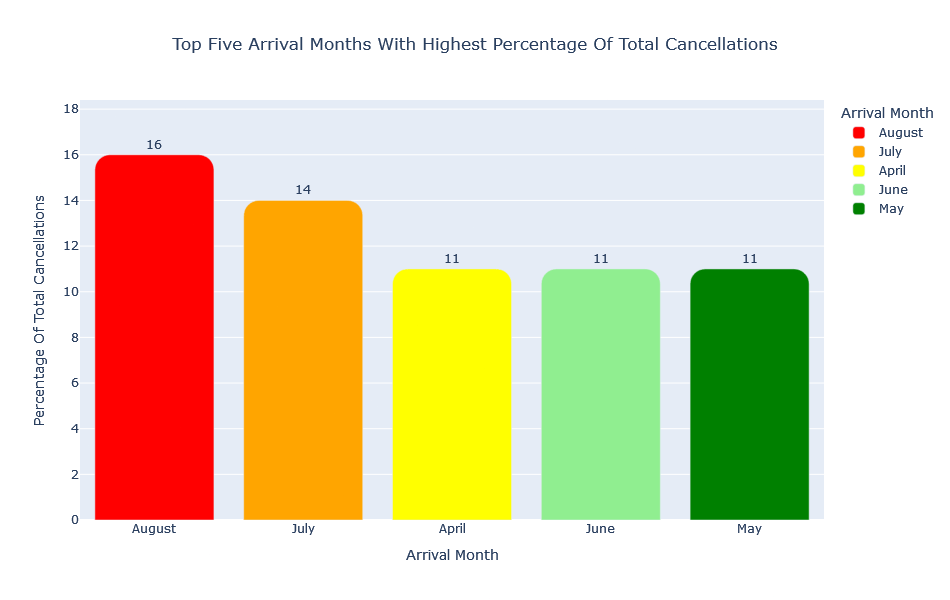

In [214]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_arrival_date_month = pt_cancellations_with_arrival_date_month.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_arrival_date_month_df = pd.DataFrame({'Arrival Month': top_arrival_date_month.index, 'Percentage Of Total Cancellations': top_arrival_date_month['percentage of total cancellations']})

fig = px.bar(top_arrival_date_month_df, x='Arrival Month', y='Percentage Of Total Cancellations',
         	labels={'x':'Arrival Month', 'y':'Percentage Of Total Cancellations'}, color='Arrival Month',
         	color_discrete_map=dict(zip(top_arrival_date_month_df['Arrival Month'], colors)),
         	hover_data={'Arrival Month': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Arrival Months With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_arrival_date_month_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the reservations with arrival month August (16%), followed by July (14%), April, June & May (each at 11%). However, it should also be noted that the highest percentage of total confirmations are from the reservations with arrival months August & July (each at 14%), followed by June (11%), May (10%), & April (9%). Implementing flexible booking policies during peak cancellation months can alleviate guest concerns and encourage more secure bookings. Additionally, proactive communication with guests about the benefits of booking early and the hotel's cancellation policies can help minimize last-minute cancellations. On the other hand, for the arrival months with high confirmation rates, hotels should capitalize on these periods by offering exclusive promotions, enhancing guest experiences, and optimizing room availability to maximize occupancy and revenue. Monitoring booking trends closely and adjusting marketing and operational strategies accordingly will be crucial to maintaining stability and profitability throughout these critical months.**

**Sensitivity Analysis**

In [215]:
xg43 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg43.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month']=='August'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'arrival_date_month'] = 'January'
	y_pred_test_for_sa = xg43.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Arrival Month From August To January")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Arrival Month From August To January
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Month From August To January
Accuracy On Test Data: 98.74%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9849    0.9972    0.9910      8363
           1     0.9935    0.9649    0.9790      3647

    accuracy                         0.9874     12010
   macro avg     0.9892    0.9811    0.9850     12010
weighted avg     0.9875    0.9874    0.9874     12010

Scenario: With 50% Changes In Arrival Month From August To January
Accuracy On Te

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the arrival month are relatively small. The model's response to changes in arrival month may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between arrival_date_month & arrival_date_year, lead_time, hotel, reservation_year, arrival_date_week_number, arrival_date_day_of_month, stays_in_week_nights, country, agent, customer_type, reservation_month, adr, market_segment, adults, stays_in_weekend_nights, reservation_date, days_in_waiting_list, reserved_room_type, assigned_room_type, children, previous_cancellations, distribution_channel, meal, total_of_special_requests, deposit_type, is_repeated_guest, booking_changes, babies, previous_bookings_not_canceled, required_car_parking_spaces. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [216]:
xg44 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg44.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg44.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Arrival Month And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Arrival Month And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Month And Interrelated Columns
Accuracy On Test Data: 88.68%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8849    0.9627    0.9222      8363
           1     0.8929    0.7129    0.7928      3647

    accuracy                         0.8868     12010
   macro avg     0.8889    0.8378    0.8575     12010
weighted avg     0.8873    0.8868    0.8829     12010

Scenario: With 50% Changes In Arrival Month And Interrelated Columns
Accuracy

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between arrival_date_week_number and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [217]:
pt_cancellations_with_arrival_date_week_number = df.groupby (['arrival_date_week_number', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_arrival_date_week_number['percentage of total cancellations'] = ((pt_cancellations_with_arrival_date_week_number['yes']/pt_cancellations_with_arrival_date_week_number['yes'].sum())*100).round(0)
pt_cancellations_with_arrival_date_week_number['percentage of total confirmations'] = ((pt_cancellations_with_arrival_date_week_number['no']/pt_cancellations_with_arrival_date_week_number['no'].sum())*100).round(0)
pt_cancellations_with_arrival_date_week_number.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
arrival_date_week_number,,,,
33,1492,706,4.0,4.0
21,1034,468,3.0,2.0
35,1205,542,3.0,3.0
34,1366,607,3.0,3.0
32,1309,581,3.0,3.0


**Plotting The Top Five Arrival Week Numbers With Highest Percentage Of Total Cancellations**

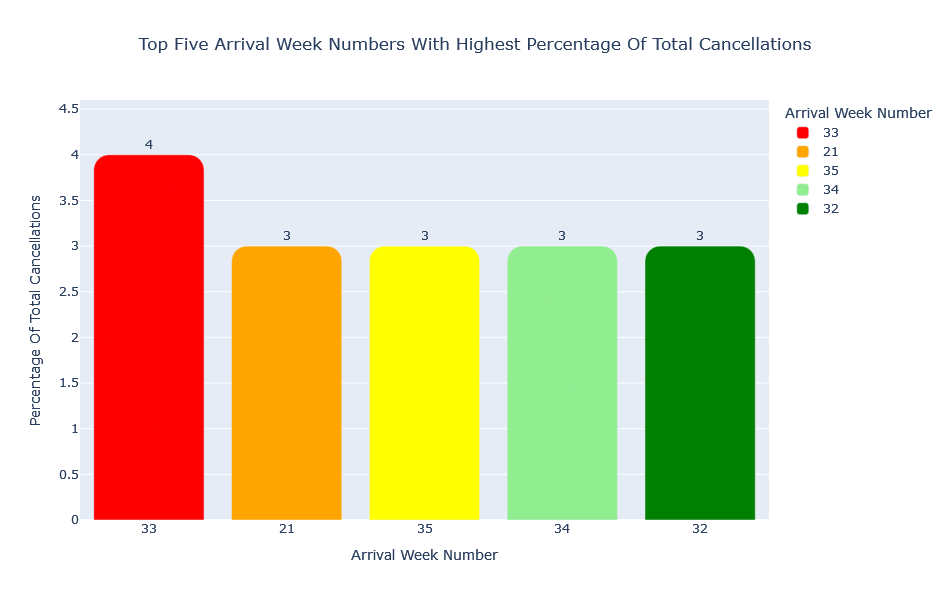

In [218]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_arrival_date_week_number = pt_cancellations_with_arrival_date_week_number.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_arrival_date_week_number_df = pd.DataFrame({'Arrival Week Number': top_arrival_date_week_number.index, 'Percentage Of Total Cancellations': top_arrival_date_week_number['percentage of total cancellations']})

fig = px.bar(top_arrival_date_week_number_df, x='Arrival Week Number', y='Percentage Of Total Cancellations',
         	labels={'x':'Arrival Week Number', 'y':'Percentage Of Total Cancellations'}, color='Arrival Week Number',
         	color_discrete_map=dict(zip(top_arrival_date_week_number_df['Arrival Week Number'], colors)),
         	hover_data={'Arrival Week Number': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Arrival Week Numbers With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_arrival_date_week_number_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the arrival week number 33 (4%), followed by 21, 35, 34 & 32 (3% each). However it should also be noted that the highest percentage of total confirmations are from the reservations with arrival week number 33 (4%), followed by the arrival week number 28, 29, 30 & 31 (3% each). Based on the analysis, the arrival week number 33 stands out with the highest percentage of total cancellations (4%), closely followed by weeks 21, 35, 34, and 32 (3% each). To mitigate cancellations during these peak weeks, hotels can focus on enhancing booking flexibility, such as offering attractive package deals or flexible cancellation policies to accommodate changing guest plans. Moreover, proactive communication about the benefits of booking during less crowded weeks or offering incentives for early bookings can help stabilize occupancy rates. Conversely, arrival week number 33 also leads in total confirmations (4%), with weeks 28, 29, 30, and 31 following closely (3% each). This pattern suggests a strong demand during these periods, presenting an opportunity for hotels to optimize revenue by strategically adjusting pricing strategies or introducing special promotions tailored to these popular weeks. By leveraging data-driven insights and closely monitoring booking patterns, hotels can effectively manage demand fluctuations and optimize revenue across different arrival weeks.**

**Sensitivity Analysis**

In [219]:
xg45 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg45.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number']=='33'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'arrival_date_week_number'] = '51'
	y_pred_test_for_sa = xg45.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Arrival Week Number From 33 To 51")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Arrival Week Number From 33 To 51
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Week Number From 33 To 51
Accuracy On Test Data: 98.14%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9853    0.9880    0.9867      8363
           1     0.9724    0.9663    0.9693      3647

    accuracy                         0.9814     12010
   macro avg     0.9789    0.9772    0.9780     12010
weighted avg     0.9814    0.9814    0.9814     12010

Scenario: With 50% Changes In Arrival Week Number From 33 To 51
Accuracy On Test Data: 

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the arrival week number are relatively small. The model's response to changes in arrival week number may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between arrival_date_week_number &, arrival_date_month, arrival_date_year, lead_time, hotel, agent, days_in_waiting_list, customer_type, reservation_month, reservation_date, reservation_year, market_segment, country, arrival_date_day_of_month, stays_in_week_nights, adr, adults, stays_in_weekend_nights, distribution_channel, reserved_room_type, meal, assigned_room_type, children, previous_cancellations, total_of_special_requests, deposit_type, booking_changes, is_repeated_guest, babies, previous_bookings_not_canceled, required_car_parking_spaces. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [220]:
xg46 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg46.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg46.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Arrival Week Number And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Arrival Week Number And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Week Number And Interrelated Columns
Accuracy On Test Data: 88.75%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8855    0.9629    0.9226      8363
           1     0.8937    0.7146    0.7941      3647

    accuracy                         0.8875     12010
   macro avg     0.8896    0.8387    0.8584     12010
weighted avg     0.8880    0.8875    0.8836     12010

Scenario: With 50% Changes In Arrival Week Number And Interrelate

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between stays_in_weekend_nights and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [221]:
pt_cancellations_with_stays_in_weekend_nights = df.groupby (['stays_in_weekend_nights', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_stays_in_weekend_nights['percentage of total cancellations'] = ((pt_cancellations_with_stays_in_weekend_nights['yes']/pt_cancellations_with_stays_in_weekend_nights['yes'].sum())*100).round(0)
pt_cancellations_with_stays_in_weekend_nights['percentage of total confirmations'] = ((pt_cancellations_with_stays_in_weekend_nights['no']/pt_cancellations_with_stays_in_weekend_nights['no'].sum())*100).round(0)
pt_cancellations_with_stays_in_weekend_nights.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
stays_in_weekend_nights,,,,
zero,16899,6459,36.0,40.0
two,12637,5957,33.0,30.0
one,11566,4882,27.0,27.0
four,620,304,2.0,1.0
three,466,257,1.0,1.0


**Plotting The Top Three Number Of Stays In Weekend Nights With Highest Percentage Of Total Cancellations**

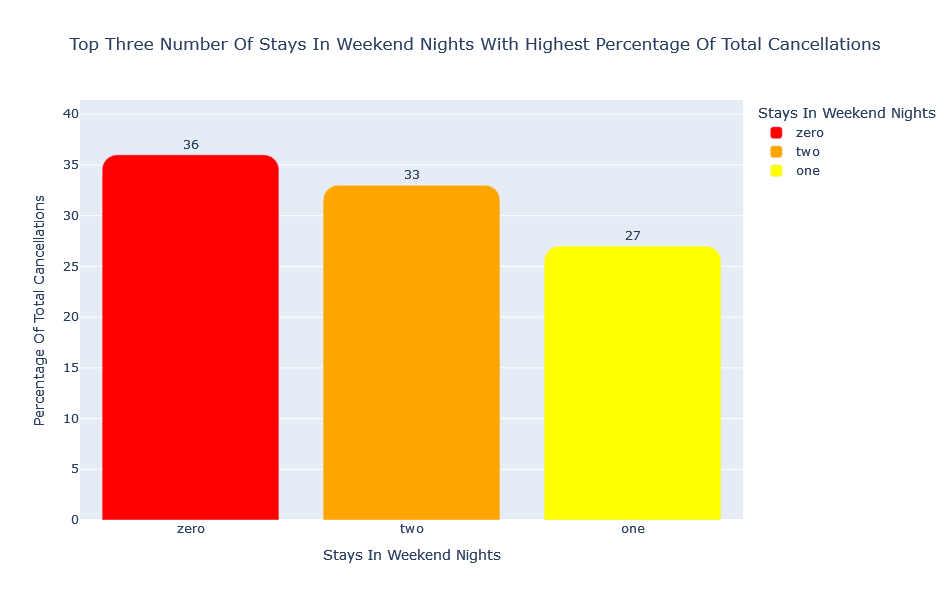

In [222]:
colors = ['red', 'orange', 'yellow']
top_stays_in_weekend_nights = pt_cancellations_with_stays_in_weekend_nights.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_stays_in_weekend_nights_df = pd.DataFrame({'Stays In Weekend Nights': top_stays_in_weekend_nights.index, 'Percentage Of Total Cancellations': top_stays_in_weekend_nights['percentage of total cancellations']})

fig = px.bar(top_stays_in_weekend_nights_df, x='Stays In Weekend Nights', y='Percentage Of Total Cancellations',
         	labels={'x':'Stays In Weekend Nights', 'y':'Percentage Of Total Cancellations'}, color='Stays In Weekend Nights',
         	color_discrete_map=dict(zip(top_stays_in_weekend_nights_df['Stays In Weekend Nights'], colors)),
         	hover_data={'Stays In Weekend Nights': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Number Of Stays In Weekend Nights With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_stays_in_weekend_nights_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with zero stays in weekend nights (36%), followed by two (33%) and one stay in weekend nights (27%). However, it should also be noted that the highest percentage of total confirmations are also with zero stays in weekend nights (40%), followed by two (30%) and one stay in weekend nights (27%). To minimize cancellations associated with these patterns, hotels could consider implementing targeted marketing strategies aimed at encouraging longer weekend stays or offering special packages that incentivize extended bookings. Additionally, enhancing guest experiences during these stays through personalized services and amenities could contribute to higher guest satisfaction and reduced cancellation rates. Conversely, the highest percentage of total confirmations also aligns with zero stays in weekend nights (40%), reinforcing the popularity of this booking pattern. Hotels can capitalize on this trend by promoting weekend getaway packages or exclusive weekend deals to attract more guests. By leveraging predictive analytics and historical booking data, hotels can further optimize room availability and pricing strategies to maximize occupancy during weekends with high confirmation rates.**

**Sensitivity Analysis**

In [223]:
xg47 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg47.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights']=='zero'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'stays_in_weekend_nights'] = 'three'
	y_pred_test_for_sa = xg47.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Stays In Weekend Nights From 0 To 3")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Stays In Weekend Nights From 0 To 3
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Stays In Weekend Nights From 0 To 3
Accuracy On Test Data: 98.87%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9849    0.9990    0.9919      8363
           1     0.9977    0.9649    0.9810      3647

    accuracy                         0.9887     12010
   macro avg     0.9913    0.9820    0.9865     12010
weighted avg     0.9888    0.9887    0.9886     12010

Scenario: With 50% Changes In Stays In Weekend Nights From 0 To 3
Accuracy On Test 

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the lead times are relatively small. The model's response to changes in lead times may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between stays_in_weekend_nights & lead_time, hotel, arrival_date_week_number, arrival_date_month, arrival_date_day_of_month, arrival_date_year, stays_in_week_nights, meal, country, market_segment, agent, reserved_room_type, customer_type, adults, assigned_room_type, distribution_channel, reservation_month, is_repeated_guest, previous_bookings_not_canceled, reservation_year, reservation_date, total_of_special_requests, children, days_in_waiting_list, required_car_parking_spaces, booking_changes, babies, adr, deposit_type, previous_cancellations. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [224]:
xg48 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg48.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg48.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Stays In Weekend Nights And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Stays In Weekend Nights And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Stays In Weekend Nights And Interrelated Columns
Accuracy On Test Data: 88.58%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8826    0.9642    0.9216      8363
           1     0.8959    0.7058    0.7896      3647

    accuracy                         0.8858     12010
   macro avg     0.8892    0.8350    0.8556     12010
weighted avg     0.8866    0.8858    0.8815     12010

Scenario: With 50% Changes In Stays In Weekend Nights And

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between reserved_room_type and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [225]:
pt_cancellations_with_reserved_room_type = df.groupby (['reserved_room_type', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_reserved_room_type['percentage of total cancellations'] = ((pt_cancellations_with_reserved_room_type['yes']/pt_cancellations_with_reserved_room_type['yes'].sum())*100).round(0)
pt_cancellations_with_reserved_room_type['percentage of total confirmations'] = ((pt_cancellations_with_reserved_room_type['no']/pt_cancellations_with_reserved_room_type['no'].sum())*100).round(0)
pt_cancellations_with_reserved_room_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
reserved_room_type,,,,
A,26393,10532,59.0,63.0
D,9243,4436,25.0,22.0
E,3013,1197,7.0,7.0
F,1495,654,4.0,4.0
G,857,440,2.0,2.0


**Plotting The Top Three Reserved Room Types With Highest Percentage Of Total Cancellations**

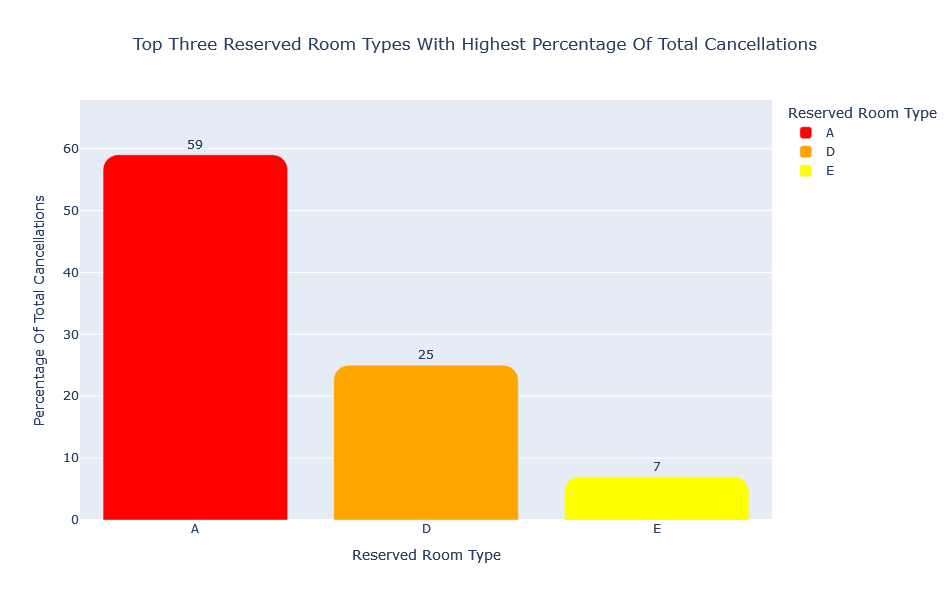

In [226]:
colors = ['red', 'orange', 'yellow']
top_reserved_room_type = pt_cancellations_with_reserved_room_type.sort_values(by = 'percentage of total cancellations', ascending = False).head(3)
top_reserved_room_type_df = pd.DataFrame({'Reserved Room Type': top_reserved_room_type.index, 'Percentage Of Total Cancellations': top_reserved_room_type['percentage of total cancellations']})

fig = px.bar(top_reserved_room_type_df, x='Reserved Room Type', y='Percentage Of Total Cancellations',
         	labels={'x':'Reserved Room Type', 'y':'Percentage Of Total Cancellations'}, color='Reserved Room Type',
         	color_discrete_map=dict(zip(top_reserved_room_type_df['Reserved Room Type'], colors)),
         	hover_data={'Reserved Room Type': False}, text='Percentage Of Total Cancellations',
         	title='Top Three Reserved Room Types With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_reserved_room_type_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the reserved room type A (59%), followed by the reserved room type D (25%), & E (7%). However it should also be noted that the highest percentage of total confirmations are also with the reserved room type A (63%), followed by the reserved room type D (22%), & E (7%). To mitigate cancellations linked to these room types, focus on improving the attractiveness and appeal of these specific accommodations through targeted marketing efforts that highlight their unique features or benefits. Additionally, offering flexible booking policies or incentives tailored to these room types may help in retaining more bookings. Conversely, the highest percentage of total confirmations is also with the reserved room type A (63%), indicating its popularity among guests. Hotels can leverage this insight by ensuring availability of room type A through effective inventory management practices and promoting it prominently in booking channels. Enhancing guest satisfaction through personalized experiences and maintaining consistent standards across all room types can further bolster confirmation rates and overall guest retention.**

**Sensitivity Analysis**

In [227]:
xg49 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg49.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type']=='A'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'reserved_room_type'] = 'H'
	y_pred_test_for_sa = xg49.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Reserved Room Type From A TO H")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Reserved Room Type From A TO H
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reserved Room Type From A TO H
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Reserved Room Type From A TO H
Accuracy On Test Data: 98.89%
Cl

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the reserved room type are relatively small. The model's response to changes in reserved room type may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between reserved_room_type & market_segment, distribution_channel, stays_in_week_nights, children, adults, meal, hotel, stays_in_weekend_nights, country, arrival_date_month, arrival_date_week_number, arrival_date_year, lead_time, babies, previous_cancellations, arrival_date_day_of_month, is_repeated_guest, previous_bookings_not_canceled, adr, agent, assigned_room_type, required_car_parking_spaces, customer_type, booking_changes, reservation_year, reservation_month, total_of_special_requests, deposit_type, days_in_waiting_list, reservation_date. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [228]:
xg50 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg50.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg50.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Reserved Room Type And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Reserved Room Type And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reserved Room Type And Interrelated Columns
Accuracy On Test Data: 88.14%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8814    0.9587    0.9184      8363
           1     0.8816    0.7041    0.7829      3647

    accuracy                         0.8814     12010
   macro avg     0.8815    0.8314    0.8507     12010
weighted avg     0.8814    0.8814    0.8773     12010

Scenario: With 50% Changes In Reserved Room Type And Interrelated C

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between hotel and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [229]:
pt_cancellations_with_hotel = df.groupby (['hotel', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_hotel['percentage of total cancellations'] = ((pt_cancellations_with_hotel['yes']/pt_cancellations_with_hotel['yes'].sum())*100).round(0)
pt_cancellations_with_hotel['percentage of total confirmations'] = ((pt_cancellations_with_hotel['no']/pt_cancellations_with_hotel['no'].sum())*100).round(0)
pt_cancellations_with_hotel.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
hotel,,,,
City Hotel,30352,13380,75.0,72.0
Resort Hotel,11836,4479,25.0,28.0


**Plotting The Top Hotels With Highest Percentage Of Total Cancellations**

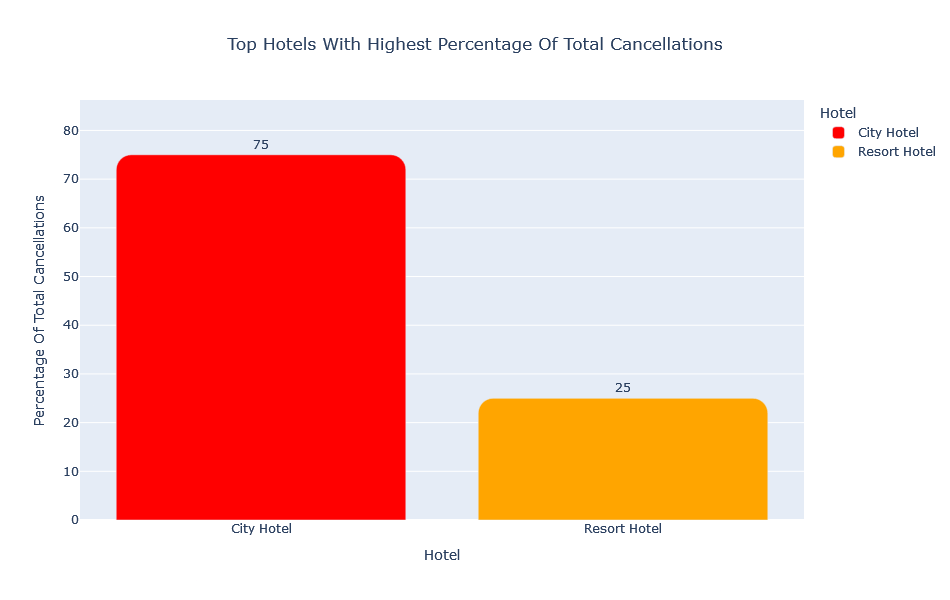

In [230]:
colors = ['red', 'orange']
top_hotel = pt_cancellations_with_hotel.sort_values(by = 'percentage of total cancellations', ascending = False).head(2)
top_hotel_df = pd.DataFrame({'Hotel': top_hotel.index, 'Percentage Of Total Cancellations': top_hotel['percentage of total cancellations']})

fig = px.bar(top_hotel_df, x='Hotel', y='Percentage Of Total Cancellations',
         	labels={'x':'Hotel', 'y':'Percentage Of Total Cancellations'}, color='Hotel',
         	color_discrete_map=dict(zip(top_hotel_df['Hotel'], colors)),
         	hover_data={'Hotel': False}, text='Percentage Of Total Cancellations',
         	title='Top Hotels With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_hotel_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the City Hotel (75%), followed by Resort Hotel (25%). However, it should also be noted that the highest percentage of total confirmations are also from the City Hotel (72%), followed by Resort Hotel (28%). Based on the analysis, the data reveals that the City Hotel experiences the highest percentage of total cancellations (75%), followed by the Resort Hotel (25%). To address this, City Hotel could consider implementing strategies such as offering more flexible cancellation policies tailored to urban travelers' needs. Providing clearer communication on booking terms and conditions and enhancing customer service responsiveness could also help mitigate cancellations and improve guest satisfaction. Conversely, the highest percentage of total confirmations also originates from the City Hotel (72%), followed by the Resort Hotel (28%). To capitalize on this trend, City Hotels can focus on optimizing operational efficiencies, maintaining high service standards, and leveraging their urban location advantages in marketing efforts. Enhancing amenities and services that appeal to urban travelers while differentiating their offerings from competitors can further strengthen booking confirmations and customer loyalty.**

**Sensitivity Analysis**

In [231]:
xg51 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg51.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['hotel']=='City Hotel'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'hotel'] = 'Resort Hotel'
	y_pred_test_for_sa = xg51.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Hotel From City Hotel To Resort Hotel")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Hotel From City Hotel To Resort Hotel
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Hotel From City Hotel To Resort Hotel
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Hotel From City Hotel To Resort Hotel
Accuracy On

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the lead times are relatively small. The model's response to changes in lead times may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between hotel & required_car_parking_spaces, market_segment, country, reserved_room_type, reservation_year, reservation_month, agent, assigned_room_type, stays_in_week_nights, stays_in_weekend_nights, arrival_date_week_number, arrival_date_month, meal, arrival_date_year, adults, distribution_channel, lead_time, adr, children, babies, previous_bookings_not_canceled, booking_changes, is_repeated_guest, arrival_date_day_of_month, customer_type, deposit_type, reservation_date, days_in_waiting_list, total_of_special_requests. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [232]:
xg52 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg52.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'is_repeated_guest' column
    indices_to_change_is_repeated_guest = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['is_repeated_guest'] == 'no'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_is_repeated_guest, 'is_repeated_guest'] = 'yes'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg52.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Hotel And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Hotel And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Hotel And Interrelated Columns
Accuracy On Test Data: 88.18%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8723    0.9727    0.9198      8363
           1     0.9151    0.6734    0.7759      3647

    accuracy                         0.8818     12010
   macro avg     0.8937    0.8231    0.8478     12010
weighted avg     0.8853    0.8818    0.8761     12010

Scenario: With 50% Changes In Hotel And Interrelated Columns
Accuracy On Test Data: 83.46%
Cl

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between babies and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [233]:
pt_cancellations_with_babies = df.groupby (['babies', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_babies['percentage of total cancellations'] = ((pt_cancellations_with_babies['yes']/pt_cancellations_with_babies['yes'].sum())*100).round(0)
pt_cancellations_with_babies['percentage of total confirmations'] = ((pt_cancellations_with_babies['no']/pt_cancellations_with_babies['no'].sum())*100).round(0)
pt_cancellations_with_babies.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
babies,,,,
zero,41696,17727,99.0,99.0
one,492,132,1.0,1.0


**Plotting The Top Number Of Babies With Highest Percentage Of Total Cancellations**

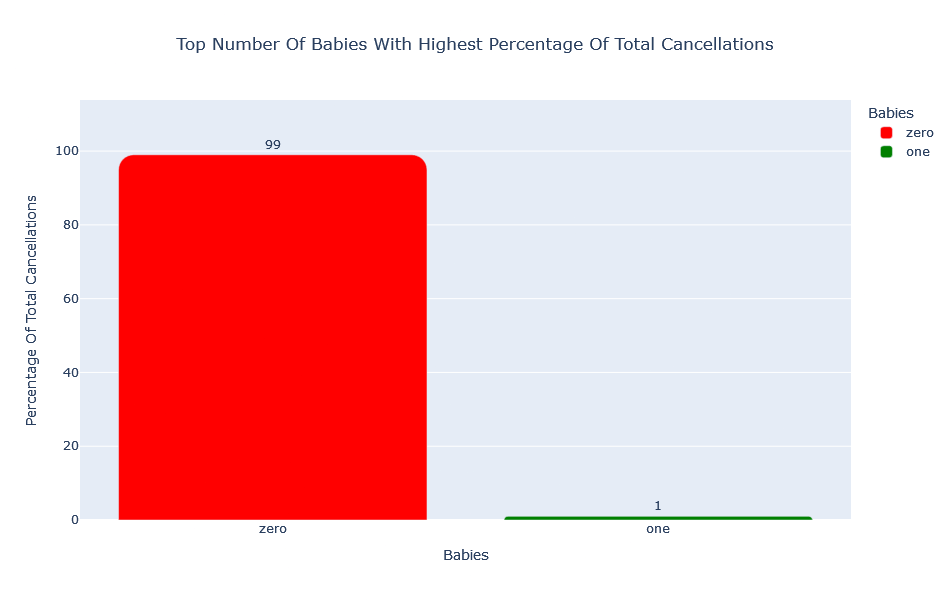

In [234]:
colors = ['red', 'green']
top_babies = pt_cancellations_with_babies.sort_values(by = 'percentage of total cancellations', ascending = False).head(2)
top_babies_df = pd.DataFrame({'Babies': top_babies.index, 'Percentage Of Total Cancellations': top_babies['percentage of total cancellations']})

fig = px.bar(top_babies_df, x='Babies', y='Percentage Of Total Cancellations',
         	labels={'x':'Babies', 'y':'Percentage Of Total Cancellations'}, color='Babies',
         	color_discrete_map=dict(zip(top_babies_df['Babies'], colors)),
         	hover_data={'Babies': False}, text='Percentage Of Total Cancellations',
         	title='Top Number Of Babies With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_babies_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the reservations made with zero babies (99%), followed by one baby (1%). However, it should also be noted that the highest percentage of total confirmations are also from the reservations made with zero babies (99%), followed by one baby (1%). This indicates a consistent trend where bookings without babies are both the most cancelled and confirmed. To minimize cancellations, hotels could focus on enhancing offerings and services that cater to families with babies, such as baby-friendly accommodations, amenities, and special packages. Additionally, targeted marketing campaigns highlighting family-friendly features and promotions could attract more bookings from families with infants, thereby expanding their customer base and increasing overall occupancy rates.**

**Sensitivity Analysis**

In [235]:
xg53 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg53.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['babies']=='zero'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'babies'] = 'one'
	y_pred_test_for_sa = xg53.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Babies From 0 To 1")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Babies From 0 To 1
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Babies From 0 To 1
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 50% Changes In Babies From 0 To 1
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
  

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the number of babies are relatively small. The model's response to changes in number of babies may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between babies & hotel, adults, children, stays_in_week_nights, arrival_date_year, arrival_date_month, arrival_date_week_number, stays_in_weekend_nights, booking_changes, total_of_special_requests, meal, assigned_room_type, reserved_room_type, agent, market_segment, distribution_channel, country, required_car_parking_spaces, reservation_month, reservation_year, adr. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [236]:
xg54 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg54.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'babies' column
    indices_to_change_babies = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['babies'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_babies, 'babies'] = 'one'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'
    
    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg54.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Number Of Babies And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Number Of Babies And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Number Of Babies And Interrelated Columns
Accuracy On Test Data: 89.55%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8833    0.9793    0.9288      8363
           1     0.9368    0.7033    0.8034      3647

    accuracy                         0.8955     12010
   macro avg     0.9101    0.8413    0.8661     12010
weighted avg     0.8996    0.8955    0.8908     12010

Scenario: With 50% Changes In Number Of Babies And Interrelated Columns

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between arrival_date_day_of_month and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [237]:
pt_cancellations_with_arrival_date_day_of_month = df.groupby (['arrival_date_day_of_month', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_arrival_date_day_of_month['percentage of total cancellations'] = ((pt_cancellations_with_arrival_date_day_of_month['yes']/pt_cancellations_with_arrival_date_day_of_month['yes'].sum())*100).round(3)
pt_cancellations_with_arrival_date_day_of_month['percentage of total confirmations'] = ((pt_cancellations_with_arrival_date_day_of_month['no']/pt_cancellations_with_arrival_date_day_of_month['no'].sum())*100).round(3)
pt_cancellations_with_arrival_date_day_of_month.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
arrival_date_day_of_month,,,,
29,1388,654,3.662,3.290
26,1409,653,3.656,3.340
2,1444,631,3.533,3.423
27,1398,630,3.528,3.314
17,1415,630,3.528,3.354


**Plotting The Top Five Arrival Dates Of Month With Highest Percentage Of Total Cancellations**

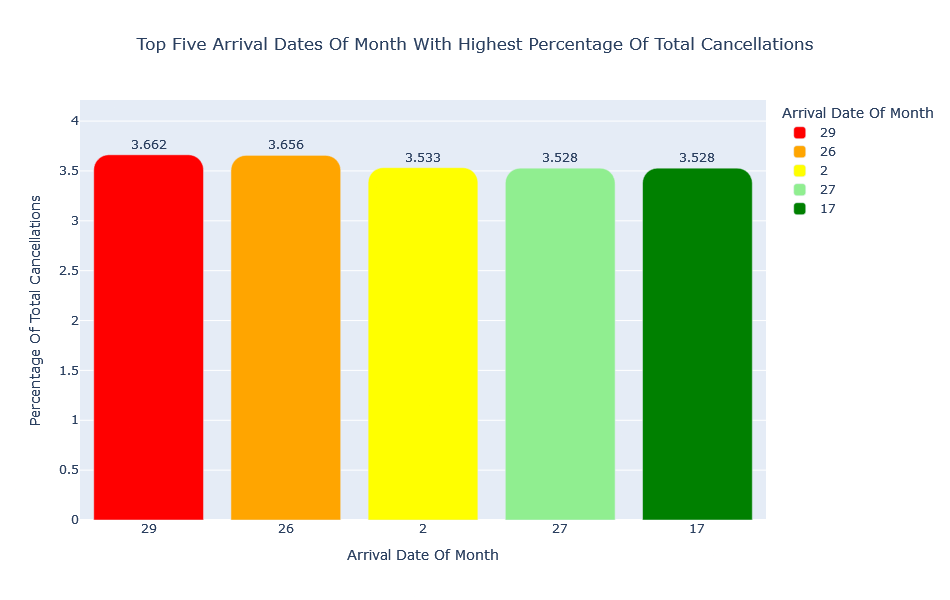

In [238]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_arrival_date_day_of_month = pt_cancellations_with_arrival_date_day_of_month.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_arrival_date_day_of_month_df = pd.DataFrame({'Arrival Date Of Month': top_arrival_date_day_of_month.index, 'Percentage Of Total Cancellations': top_arrival_date_day_of_month['percentage of total cancellations']})

fig = px.bar(top_arrival_date_day_of_month_df, x='Arrival Date Of Month', y='Percentage Of Total Cancellations',
         	labels={'x':'Arrival Date Of Month', 'y':'Percentage Of Total Cancellations'}, color='Arrival Date Of Month',
         	color_discrete_map=dict(zip(top_arrival_date_day_of_month_df['Arrival Date Of Month'], colors)),
         	hover_data={'Arrival Date Of Month': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Arrival Dates Of Month With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_arrival_date_day_of_month_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are from the reservations with arrival date 29 (3.662%), followed by 26 (3.656%), 2 (3.533%), 27 & 17 (3.528% each). However, it should also be noted that the highest percentage of total confirmations are from the reservations with arrival date 19 (3.558%), followed by 28 (3.475%), 2 (3.423%), 18 (3.411%) & 20 (3.390%). This pattern suggests fluctuations in booking behavior across different arrival dates, with peaks in cancellations and confirmations observed on specific days. To optimize occupancy and minimize cancellations, hotels could implement dynamic pricing strategies or promotional offers during historically high cancellation periods. Additionally, enhancing customer engagement through personalized booking experiences and proactive communication about reservation flexibility could help mitigate cancellation rates and improve guest satisfaction.**

**Sensitivity Analysis**

In [239]:
xg55 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg55.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month']=='2'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'arrival_date_day_of_month'] = '31'
	y_pred_test_for_sa = xg55.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Arrival Date Of Month From 2 To 31")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Arrival Date Of Month From 2 To 31
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Date Of Month From 2 To 31
Accuracy On Test Data: 98.83%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9847    0.9988    0.9917      8363
           1     0.9972    0.9644    0.9805      3647

    accuracy                         0.9883     12010
   macro avg     0.9909    0.9816    0.9861     12010
weighted avg     0.9885    0.9883    0.9883     12010

Scenario: With 50% Changes In Arrival Date Of Month From 2 To 31
Accuracy On Test Dat

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the arrival_date_day_of_month are relatively small. The model's response to changes in arrival_date_day_of_month may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between arrival_date_day_of_month & arrival_date_month, arrival_date_week_number, lead_time, arrival_date_year, hotel, agent, reservation_date, reservation_month, days_in_waiting_list, stays_in_week_nights, stays_in_weekend_nights, market_segment, country, reservation_year, distribution_channel, customer_type, adr, adults, meal, deposit_type, assigned_room_type, reserved_room_type, booking_changes, total_of_special_requests, previous_cancellations, children. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [240]:
xg56 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg56.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'children' column
    indices_to_change_children = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['children'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_children, 'children'] = 'three'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'

    # Modify 'total_of_special_requests' column
    indices_to_change_total_of_special_requests = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['total_of_special_requests'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_total_of_special_requests, 'total_of_special_requests'] = 'four'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg56.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Arrival Date Day Of Month And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Arrival Date Day Of Month And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Arrival Date Day Of Month And Interrelated Columns
Accuracy On Test Data: 91.97%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9398    0.9452    0.9425      8363
           1     0.8727    0.8613    0.8670      3647

    accuracy                         0.9197     12010
   macro avg     0.9063    0.9032    0.9047     12010
weighted avg     0.9195    0.9197    0.9196     12010

Scenario: With 50% Changes In Arrival Date Day Of Mon

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

**Bivariate analysis between reservation date and cancellations. Making pivot table and expressing the results in percentages to make the interpretation of results easier**

In [241]:
pt_cancellations_with_reservation_date = df.groupby (['reservation_date', 'is_canceled'])['is_canceled'].count().unstack()
pt_cancellations_with_reservation_date['percentage of total cancellations'] = ((pt_cancellations_with_reservation_date['yes']/pt_cancellations_with_reservation_date['yes'].sum())*100).round(3)
pt_cancellations_with_reservation_date['percentage of total confirmations'] = ((pt_cancellations_with_reservation_date['no']/pt_cancellations_with_reservation_date['no'].sum())*100).round(3)
pt_cancellations_with_reservation_date.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)

is_canceled,no,yes,percentage of total cancellations,percentage of total confirmations
reservation_date,,,,
9,1417,649,3.634,3.359
22,1345,648,3.628,3.188
21,1483,633,3.544,3.515
12,1500,624,3.494,3.556
6,1386,617,3.455,3.285


**Plotting The Top Five Reservation Dates With Highest Percentage Of Total Cancellations**

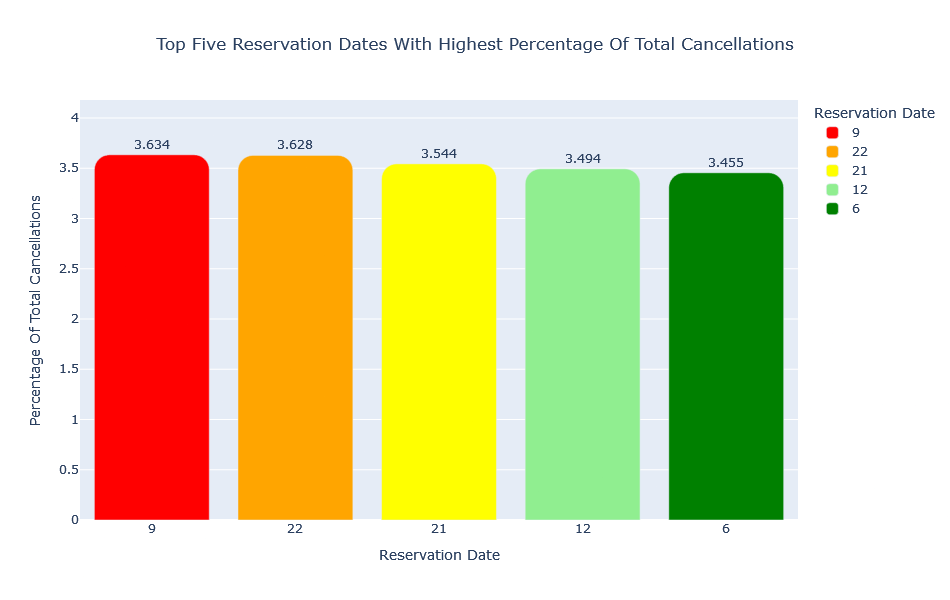

In [242]:
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green']
top_reservation_date = pt_cancellations_with_reservation_date.sort_values(by = 'percentage of total cancellations', ascending = False).head(5)
top_reservation_date_df = pd.DataFrame({'Reservation Date': top_reservation_date.index, 'Percentage Of Total Cancellations': top_reservation_date['percentage of total cancellations']})

fig = px.bar(top_reservation_date_df, x='Reservation Date', y='Percentage Of Total Cancellations',
         	labels={'x':'Reservation Date', 'y':'Percentage Of Total Cancellations'}, color='Reservation Date',
         	color_discrete_map=dict(zip(top_reservation_date_df['Reservation Date'], colors)),
         	hover_data={'Reservation Date': False}, text='Percentage Of Total Cancellations',
         	title='Top Five Reservation Dates With Highest Percentage Of Total Cancellations', width=950, height=600)

fig.update_traces(textposition='outside')
fig.update_layout(title_x=0.5, barcornerradius=15)
max_count = top_reservation_date_df['Percentage Of Total Cancellations'].max()
fig.update_yaxes(range=[0, max_count * 1.15])

**The above bar plot shows that the highest percentage of total cancellations are with the reservation date 9 (3.634%), followed by 22 (3.628%), 21 (3.544%), 12 (3.494%), & 6 (3.455%). However it should also be noted that the highest percentage of total confirmations are with the reservation date 2 (3.627%), followed by 12 (3.556%), 21 (3.515%), 28 (3.394%), & 3 (3.382%). This disparity highlights varying booking behaviors depending on the reservation date, with certain dates showing higher propensity for both cancellations and confirmations. To mitigate cancellations, hotels could employ targeted marketing campaigns or incentives for bookings made during historically high cancellation periods. Moreover, enhancing booking flexibility options and optimizing staffing levels based on reservation trends could help improve operational efficiency and guest satisfaction.**

**Sensitivity Analysis**

In [243]:
xg57 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)
xg57.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
	modified_x_test_for_sa = x_test_for_sa.copy()
	num = int(len(modified_x_test_for_sa) * (scenario / 100))

	indices_to_change = np.random.choice(modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date']=='2'],
                                     	num, replace=True)

	modified_x_test_for_sa.loc[indices_to_change, 'reservation_date'] = '31'
	y_pred_test_for_sa = xg57.predict(modified_x_test_for_sa)

	print(f"Scenario: With {scenario}% Changes In Reservation Date From 2 To 31")
	print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
	print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
	print("=" * 50)

Scenario: With 0% Changes In Reservation Date From 2 To 31
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reservation Date From 2 To 31
Accuracy On Test Data: 98.36%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9829    0.9938    0.9883      8363
           1     0.9854    0.9602    0.9726      3647

    accuracy                         0.9836     12010
   macro avg     0.9841    0.9770    0.9805     12010
weighted avg     0.9836    0.9836    0.9835     12010

Scenario: With 50% Changes In Reservation Date From 2 To 31
Accuracy On Test Data: 98.36%
Class

**While the statistical tests indicate significance, the observed changes in model performance metrics with variations in the reservation_date are relatively small. The model's response to changes in reservation_date may be influenced by other variables not explicitly considered in the presented scenarios. Let's verify this.**

**The results of statistical tests between independent features show that there is a strong relationship between reservation_date & arrival_date_week_number, reservation_month, arrival_date_day_of_month, agent, arrival_date_month, lead_time, days_in_waiting_list, market_segment, stays_in_week_nights, country, reservation_year, customer_type, arrival_date_year, distribution_channel, deposit_type, stays_in_weekend_nights, meal, hotel, booking_changes, adults, required_car_parking_spaces, previous_cancellations, previous_bookings_not_canceled, assigned_room_type, reserved_room_type, adr. This means that these factors collectively affect the cancellations. Let's verify this further through sensitivity analysis. Skipping the pivot table since these are a lot of columns and it's not feasible to make a pivot table of them.**

In [244]:
xg58 = XGBClassifier(enable_categorical=True, tree_method="hist", device='cuda', n_estimators=50)

xg58.fit(x_train_for_sa, y_train_for_sa, eval_set=[(x_val_for_sa, y_val_for_sa)], early_stopping_rounds=10, verbose = False)

scenarios = [0, 25, 50, 75, 100]

for scenario in scenarios:
    modified_x_test_for_sa = x_test_for_sa.copy()
    num = int(len(modified_x_test_for_sa) * (scenario / 100))

    # Modify 'stays_in_weekend_nights' column
    indices_to_change_stays_in_weekend_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_weekend_nights'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_weekend_nights, 'stays_in_weekend_nights'] = 'three'

    # Modify 'stays_in_week_nights' column
    indices_to_change_stays_in_week_nights = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['stays_in_week_nights'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_stays_in_week_nights, 'stays_in_week_nights'] = 'nine'

    # Modify 'arrival_date_week_number' column
    indices_to_change_arrival_date_week_number = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_week_number'] == '33'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_week_number, 'arrival_date_week_number'] = '51'

    # Modify 'arrival_date_month' column
    indices_to_change_arrival_date_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_month, 'arrival_date_month'] = 'January'

    # Modify 'hotel' column
    indices_to_change_hotel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['hotel'] == 'City Hotel'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_hotel, 'hotel'] = 'Resort Hotel'

    # Modify 'arrival_date_year' column
    indices_to_change_arrival_date_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_year, 'arrival_date_year'] = '2015'

    # Modify 'meal' column
    indices_to_change_meal = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['meal'] == 'BB'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_meal, 'meal'] = 'Undefined'

    # Modify 'lead_time' column
    indices_to_change_lead_time = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['lead_time'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_lead_time, 'lead_time'] = '315'

    # Modify 'adults' column
    indices_to_change_adults = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['adults'] == 'two'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adults, 'adults'] = 'four'

    # Modify 'arrival_date_day_of_month' column
    indices_to_change_arrival_date_day_of_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['arrival_date_day_of_month'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_arrival_date_day_of_month, 'arrival_date_day_of_month'] = '31'

    # Modify 'reservation_year' column
    indices_to_change_reservation_year = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_year'] == '2016'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_year, 'reservation_year'] = '2015'

    # Modify 'country' column
    indices_to_change_country = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['country'] == 'Portugal'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_country, 'country'] = 'Latvia'

    # Modify 'market_segment' column
    indices_to_change_market_segment = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['market_segment'] == 'Online TA'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_market_segment, 'market_segment'] = 'Aviation'

    # Modify 'distribution_channel' column
    indices_to_change_distribution_channel = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['distribution_channel'] == 'TA/TO'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_distribution_channel, 'distribution_channel'] = 'GDS'

    # Modify 'agent' column
    indices_to_change_agent = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['agent'] == '9'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_agent, 'agent'] = '36'

    # Modify 'previous_cancellations' column
    indices_to_change_previous_cancellations = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_cancellations'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_cancellations, 'previous_cancellations'] = 'one'

    # Modify 'reservation_month' column
    indices_to_change_reservation_month = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_month'] == 'August'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_month, 'reservation_month'] = 'December'

    # Modify 'customer_type' column
    indices_to_change_customer_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['customer_type'] == 'Transient'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_customer_type, 'customer_type'] = 'Group'

    # Modify 'required_car_parking_spaces' column
    indices_to_change_required_car_parking_spaces = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['required_car_parking_spaces'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_required_car_parking_spaces, 'required_car_parking_spaces'] = 'one'

    # Modify 'assigned_room_type' column
    indices_to_change_assigned_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['assigned_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_assigned_room_type, 'assigned_room_type'] = 'B'

    # Modify 'reserved_room_type' column
    indices_to_change_reserved_room_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reserved_room_type'] == 'A'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reserved_room_type, 'reserved_room_type'] = 'H'

    # Modify 'previous_bookings_not_canceled' column
    indices_to_change_previous_bookings_not_canceled = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['previous_bookings_not_canceled'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_previous_bookings_not_canceled, 'previous_bookings_not_canceled'] = 'five'

    # Modify 'deposit_type' column
    indices_to_change_deposit_type = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['deposit_type'] == 'No Deposit'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_deposit_type, 'deposit_type'] = 'Refundable'
    
    # Modify 'reservation_date' column
    indices_to_change_reservation_date = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['reservation_date'] == '2'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_reservation_date, 'reservation_date'] = '31'

    # Modify 'days_in_waiting_list' column
    indices_to_change_days_in_waiting_list = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['days_in_waiting_list'] == '0'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_days_in_waiting_list, 'days_in_waiting_list'] = '63'

    # Modify 'booking_changes' column
    indices_to_change_booking_changes = np.random.choice(
        modified_x_test_for_sa.index[modified_x_test_for_sa['booking_changes'] == 'zero'], num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_booking_changes, 'booking_changes'] = 'five'

    # Modify 'adr' column
    indices_to_change_adr = np.random.choice(
        modified_x_test_for_sa.index[(modified_x_test_for_sa['adr'] >= 69.290000) & (modified_x_test_for_sa['adr'] <= 90.000000)],
        num, replace=True)
    modified_x_test_for_sa.loc[indices_to_change_adr, 'adr'] = 231.670000
    
    y_pred_test_for_sa = xg58.predict(modified_x_test_for_sa)
    
    print(f"Scenario: With {scenario}% Changes In Reservation Date And Interrelated Columns")
    print(f"Accuracy On Test Data: {accuracy_score(y_test_for_sa, y_pred_test_for_sa) * 100:.2f}%")
    print(f"Classification Report Of Test Data:\n{classification_report(y_test_for_sa, y_pred_test_for_sa, digits=4)}")
    print("=" * 50)

Scenario: With 0% Changes In Reservation Date And Interrelated Columns
Accuracy On Test Data: 98.88%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.9851    0.9990    0.9920      8363
           1     0.9977    0.9655    0.9813      3647

    accuracy                         0.9888     12010
   macro avg     0.9914    0.9822    0.9867     12010
weighted avg     0.9890    0.9888    0.9888     12010

Scenario: With 25% Changes In Reservation Date And Interrelated Columns
Accuracy On Test Data: 88.47%
Classification Report Of Test Data:
              precision    recall  f1-score   support

           0     0.8838    0.9607    0.9206      8363
           1     0.8873    0.7104    0.7891      3647

    accuracy                         0.8847     12010
   macro avg     0.8856    0.8356    0.8549     12010
weighted avg     0.8849    0.8847    0.8807     12010

Scenario: With 50% Changes In Reservation Date And Interrelated Columns

**The results of sensitivity analysis show a reasonable change with the change in the values of the interrelated columns mentioned above. This validates the inference made above that they collectively affect the booking cancellations.**

Conclusions Of Bivariate Analysis:

1. Cancellations by Lead Time: Highest percentage of total cancellations occur with a lead time of 0 days (1.131%), followed by 18 days (1.064%), 12 days (0.985%), 10 days (0.902%), and 17 days (0.896%). Significant last-minute cancellations and notable cancellations at longer lead times. Recommendations: Implement flexible cancellation policies for last-minute bookings, enhance communication about cancellation policies, and offer incentives for early bookings.

2. Cancellations by Reservation Month: Highest percentage of total cancellations in March (12%), followed by April and February (11% each), and January and May (10% each). Highest percentage of total confirmations in August (14%), followed by July (13%), and June, May, and September (10% each). Recommendations: Implement flexible cancellation policies for peak cancellation months and enhance marketing efforts during high confirmation periods in August and July. Monitor monthly booking trends to adjust strategies promptly.

3. Cancellations by Special Requests: Highest percentage of total cancellations with 0 special requests (59%), followed by 1 special request (29%) and 2 special requests (11%). Highest percentage of total confirmations with 0 special requests (41%), followed by 1 special request (38%) and 2 special requests (17%). Recommendations: Enhance communication about special request options and ensure effective management of these requests, to reduce cancellations. Leverage high confirmation rates for bookings with 0 special requests by maintaining high service standards and leveraging positive guest experiences in marketing efforts.

4. Cancellations by Car Parking Requirements: 100% of total cancellations from guests with no car parking requirements, none from those requiring 1 car parking space. Highest percentage of total confirmations from guests with no car parking requirements (89%), followed by those requiring 1 car parking space (11%). Recommendations: Enhance communication and availability of parking options during the booking process. Ensure adequate parking facilities and transparent communication about parking policies.

5. Cancellations by Agent ID: Highest percentage of total cancellations from reservations by agent ID 9 (64%), followed by ID 240 (17%) and ID 14 (3%). Highest percentage of total confirmations with agent ID 9 (51%), followed by ID 240 (11%) and ID 14 (6%). Recommendations: Enhance collaboration with top-performing agents, provide additional support and resources, and implement performance metrics to foster a competitive yet cooperative booking environment.

6. Cancellations by Market Segment: Highest percentage of cancellations from Online TA (83%), followed by Direct bookings (7%) and Offline TA/TO (6%). Highest percentage of confirmations also from Online TA (63%), followed by Direct bookings (17%) and Offline TA/TO (14%). Recommendations: To mitigate cancellations, improve online booking experiences, enhance customer support, and implement flexible cancellation policies. Focus on nurturing Direct bookings and optimizing Offline TA/TO partnerships.

7. Cancellations by Country: Highest percentage of total cancellations from Portugal (33%), followed by France, UK, and Spain (9% each) and Italy (6%). Highest percentage of total confirmations from Portugal (22%), followed by France (13%), UK (12%), Spain (9%), and Germany (8%). Recommendations: Implement targeted communication strategies, flexible booking policies, personalized marketing campaigns, and enhance guest engagement. Diversify market reach to include countries like Germany and monitor booking trends to adapt strategies in real-time.

8. Cancellations by Previous Cancellations: 97% of total cancellations from guests with 0 previous cancellations, followed by 3% from guests with 1 previous cancellation. 100% of total confirmations from guests with 0 previous cancellations. Recommendations: To mitigate initial cancellations, gather feedback from guests who cancel, address reasons behind cancellations, provide transparent policies, and proactive communication. Leverage insights from confirmed bookings to refine targeting strategies and enhance guest retention.

10. Cancellations by Distribution Channel: Highest percentage of total cancellations from TA/TO (91%), followed by Direct bookings (7%) and Corporate channels (2%). Highest percentage of total confirmations also from TA/TO (79%), followed by Direct bookings (17%) and Corporate channels (3%). Recommendations: Enhance monitoring and policies specific to TA/TO bookings, implement stricter confirmation procedures, and foster stronger relationships with corporate clients.

11. Cancellations by Customer Type: Highest percentage of total cancellations from Transient (93%), followed by Transient-Party (5%) and Contract (2%). Highest percentage of total confirmations also from Transient (83%), followed by Transient-Party (12%) and Contract (4%). Recommendations: To mitigate cancellations, offer flexible booking options for Transient guests, improve communication of policies, and incentivize direct bookings. Strengthen relationships with Transient-Party and Contract customers through personalized services and exclusive offers.

12. Cancellations by Booking Changes: Highest percentage of total cancellations with zero booking changes (90%), followed by one booking change (6%) and two booking changes (3%). Highest percentage of total confirmations also with zero booking changes (81%), followed by one booking change (14%) and two booking changes (4%). Recommendations: To minimize cancellations, streamline the booking change process with clear policies and user-friendly interfaces. Enhance transparency and trust through proactive communication about booking changes. Improve operational efficiency to accommodate booking changes and monitor patterns for continuous improvement.

13. Cancellations by Deposit Type: Highest percentage of total cancellations from no deposit reservations (98%), followed by non-refundable deposits (2%). All confirmations come from no deposit reservations. Recommendations: Implement flexible deposit policies, provide incentives for refundable deposit options, and enhance transparency in deposit terms. Regularly review deposit policies to align with market dynamics.

14. Cancellations by Length of Stay: Highest percentage of total cancellations for two-night stays on weeknights (26%), followed by three-night (22%), single-night (20%), five-night (12%), and four-night stays (11%). Highest percentage of total confirmations for single-night stays (26%), followed by two-night (25%), three-night (20%), five-night (10%), and four-night stays (9%). Recommendations: To mitigate cancellations for shorter stays, enhance cancellation policies with more flexibility and improve booking experience. For longer stays, offer value-added services and incentives to secure early bookings.

15. Cancellations by Average Daily Rate: Highest percentage of total cancellations for rates between 151.23 and 231.67 (23%), followed by 123.4 to 151.2 (22%), 102.72 to 123.33 (20%), 86.72 to 102.708 (18%), and 69.29 to 86.712 (16%). Highest percentage of total confirmations for rates between 69.29 and 86.712 (22%), followed by 86.72 to 102.708 (21%), 102.72 to 123.33 (20%), and 123.4 to 151.2 and 151.23 to 231.67 (19% each). Recommendations: To mitigate cancellations at higher rates, offer flexible rate options or value-added packages. Maintain competitive pricing and emphasize unique benefits for lower rates. Monitor pricing trends and adjust strategies to attract and retain bookings across rate categories.

16. Cancellations by Arrival Year: Highest percentage of total cancellations for reservations in 2016 (48%), followed by 2017 (42%), and 2015 (10%). Highest percentage of total confirmations also align with 2016 (49%), followed by 2017 (36%), and 2015 (15%). Implement dynamic pricing models based on historical demand, target promotions during high confirmation periods, revise cancellation policies to incentivize early bookings, and personalize guest experiences based on historical preferences.

17. Cancellations by Assigned Room Type: Highest percentage of total cancellations for room type A (58%), followed by D (25%), E (7%), F (4%), and G (3%). Highest percentage of total confirmations also for room type A (52%), followed by D (26%), E (9%), F (5%), and G (3%). Recommendations: Analyze if room assignments meet guest expectations, enhance allocation process, offer upgrades and incentives for less popular room types, and improve guest experience for frequently assigned room types to reduce cancellations.

18. Cancellations by Previous Bookings: 100% of total cancellations and 98% of total confirmations occur with zero previous bookings not canceled. Recommendations: Focus on first-time bookers by enhancing personalized communication, special offers, and flexible policies. Gather and address feedback to improve satisfaction and reduce cancellations.

19. Cancellations by Number of Adults: Highest percentage of total cancellations and confirmations are with two adults (79% and 77%, respectively). Recommendations: Implement targeted strategies for couples, such as special packages and incentives. Enhance communication and offers for one and three-adult reservations to reduce cancellations and increase confirmations.

20. Cancellations by Reservation Year: Highest percentage of total cancellations and confirmations are from the year 2016 (54% and 49%, respectively). Recommendations: Examine 2016 conditions and events, review booking policies, and offer incentives to retain bookings. Leverage successful aspects of 2016, like popular promotions, to improve future bookings.

21. Cancellations by Meal Type: Highest percentage of total cancellations and confirmations come from the booked meal type BB (74% and 77%, respectively). Recommendations: Improve clarity around breakfast service for BB bookings. Highlight flexibility for SC bookings and ensure transparency for HB bookings to reduce cancellations and enhance guest experience.

22. Cancellations by Guest Type: 100% of total cancellations and 98% of confirmations are from non-repeated guests. Recommendations: Enhance the first-time guest experience with personalized messages, clear confirmations, and proactive communication. Encourage repeat visits with loyalty programs and exclusive offers.

23. Cancellations by Number of Children: Highest percentage of total cancellations and confirmations are from bookings with no children (87% and 90%, respectively). Recommendations: Introduce flexible cancellation policies for bookings without children, emphasize hotel amenities, and gather feedback to reduce cancellations. Attract families with family-friendly packages, enhanced amenities, and targeted marketing efforts.

24. Cancellations by Arrival Month: Highest percentage of total cancellations in August (16%), followed by July (14%), April, June, and May (each 11%). Highest percentage of total confirmations in August and July (each 14%), followed by June (11%), May (10%), and April (9%). Recommendations: Implement flexible booking policies and proactive communication during peak cancellation months. Capitalize on high confirmation months with exclusive promotions and enhanced guest experiences.

25. Cancellations by Arrival Week Number: Highest percentage of total cancellations in week 33 (4%), followed by weeks 21, 35, 34, and 32 (each 3%). Highest percentage of total confirmations in week 33 (4%), followed by weeks 28, 29, 30, and 31 (each 3%). Recommendations: Enhance booking flexibility and offer incentives during peak cancellation weeks. Adjust pricing strategies and introduce promotions for high-demand weeks to optimize revenue.

26. Cancellations by Weekend Stays: Highest percentage of total cancellations with zero weekend nights (36%), followed by two (33%) and one weekend night (27%). Highest percentage of total confirmations also with zero weekend nights (40%), followed by two (30%) and one weekend night (27%). Recommendations: Encourage longer weekend stays with special packages. Promote weekend getaways and use predictive analytics to optimize room availability and pricing.

27. Cancellations by Reserved Room Type: Highest percentage of total cancellations with room type A (59%), followed by D (25%) and E (7%). Highest percentage of total confirmations also with room type A (63%), followed by D (22%) and E (7%). Recommendations: Improve appeal and offer incentives for popular room types. Ensure availability of room type A and promote it prominently to boost confirmations.

28. Cancellations by Hotel Type: Highest percentage of total cancellations in City Hotel (75%), followed by Resort Hotel (25%). Highest percentage of total confirmations also in City Hotel (72%), followed by Resort Hotel (28%). Recommendations: Implement flexible cancellation policies and improve communication for City Hotel. Optimize operations and leverage urban location advantages in marketing.

29. Cancellations by Presence of Babies: Highest percentage of total cancellations with zero babies (99%), followed by one baby (1%). Highest percentage of total confirmations also with zero babies (99%), followed by one baby (1%). Recommendations: Enhance family-friendly offerings and market these features to attract more bookings from families with infants, increasing occupancy rates.

30. Cancellations by Arrival Date: Highest percentage of total cancellations on arrival dates: 29 (3.662%), 26 (3.656%), 2 (3.533%), 27 and 17 (3.528% each). Highest percentage of total confirmations on arrival dates: 19 (3.558%), 28 (3.475%), 2 (3.423%), 18 (3.411%), and 20 (3.390%). Recommendations: Implement dynamic pricing and promotional offers during high cancellation periods. Enhance customer engagement with personalized booking experiences and proactive communication to reduce cancellations.

31. Cancellations by Reservation Date: Highest percentage of total cancellations on reservation dates: 9 (3.634%), 22 (3.628%), 21 (3.544%), 12 (3.494%), and 6 (3.455%). Highest percentage of total confirmations on reservation dates: 2 (3.627%), 12 (3.556%), 21 (3.515%), 28 (3.394%), and 3 (3.382%). Recommendations: Use targeted marketing campaigns and incentives for bookings during high cancellation periods. Enhance booking flexibility and optimize staffing based on reservation trends to improve efficiency and satisfaction.